<a href="https://colab.research.google.com/github/adnaksbhat/Colab_JupyterNotebooks/blob/main/bh_ecn_ecr_play.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# prompt: export df  to .excel
#2664
# Assuming df_merged is your DataFrame
from google.colab import files
df.to_excel('df.xlsx', index=False)
files.download('df.xlsx')

#ECN_GT_All_WAB

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set default visual style
sns.set(style="whitegrid")


In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [ ]:

file_path = '/content/ECN_GT_All_WAB.xlsx'
og_df = pd.read_excel(file_path)

og_df.head()


,ECN_CODE,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,ECN_CREATOR_ID,ECN_CREATION_DATE,CLOSURE,DISPOSITION,MATURITY,CREATION_DATE,UPDATE_DATE,AGING,AGING GROUP,ECR OFFICE Name
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,"M111Z8002_1709041/003,M111Z8002_1709040/003,M1...","M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",503033706,2024-01-25,Closed,Approved,Complete,2024-01-25,2024-01-25,268,>40,NaN
1,CIS-033699,Scope Change Notice,8844182 - Dummy addition,8844182,"M66508002_8844182/016,M66508002_8844182/012","M66508002_8844182/018,M66508002_8844182/017",503033706,2024-01-30,Closed,Approved,Complete,2024-01-30,2024-01-31,262,>40,NaN
2,CIS-033803,Scope Change Notice,Woodside Pluto 8840659-60-61-62,8840659,"M111F0019_8840659/001,M111F0019_8840660/001,M1...","M111F0019_8840660/003,M111F0019_8840661/003,M1...",212362330,2024-02-08,Closed,Approved,Complete,2024-02-08,2024-02-09,253,>40,UPG
3,CIS-033860,Scope Change Notice,1709039;1709040;1709041 Add a Dummy,1709041,"M11108002_1709040/000,M11108002_1709039/000,M1...","M11108002_1709040/001,M11108002_1709041/001,M1...",503033706,2024-02-15,Closed,Approved,Complete,2024-02-15,2024-02-15,247,>40,NaN
4,CIS-033956,Scope Change Notice,Qatar GTG NFS- 1709039 - Dummy position change,1709039,"M680B0850_1709039/000,M68000951_1709041/000,M6...","M680B0850_1709041/001,M680B0850_1709039/001,M6...",503033706,2024-02-21,Closed,Approved,Complete,2024-02-21,2024-02-21,240,>40,NaN


In [ ]:
# prompt: from above df create a new df with only cols ECN_CODE, ECN_TYPE,'IMPACTED_ITEMS' , 'SOLUTION_ITEMS'

df = og_df[['ECN_CODE', 'ECN_TYPE', 'ECN_DESC', 'COSTING_PROJECTS', 'IMPACTED_ITEMS', 'SOLUTION_ITEMS', 'CLOSURE', 'AGING GROUP', 'ECR OFFICE Name']]
df.head()

,ECN_CODE,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,"M111Z8002_1709041/003,M111Z8002_1709040/003,M1...","M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
1,CIS-033699,Scope Change Notice,8844182 - Dummy addition,8844182,"M66508002_8844182/016,M66508002_8844182/012","M66508002_8844182/018,M66508002_8844182/017",Closed,>40,NaN
2,CIS-033803,Scope Change Notice,Woodside Pluto 8840659-60-61-62,8840659,"M111F0019_8840659/001,M111F0019_8840660/001,M1...","M111F0019_8840660/003,M111F0019_8840661/003,M1...",Closed,>40,UPG
3,CIS-033860,Scope Change Notice,1709039;1709040;1709041 Add a Dummy,1709041,"M11108002_1709040/000,M11108002_1709039/000,M1...","M11108002_1709040/001,M11108002_1709041/001,M1...",Closed,>40,NaN
4,CIS-033956,Scope Change Notice,Qatar GTG NFS- 1709039 - Dummy position change,1709039,"M680B0850_1709039/000,M68000951_1709041/000,M6...","M680B0850_1709041/001,M680B0850_1709039/001,M6...",Closed,>40,NaN


##Graphs and visualization

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ECN_CODE          244 non-null    object
 1   ECN_TYPE          244 non-null    object
 2   ECN_DESC          244 non-null    object
 3   COSTING_PROJECTS  244 non-null    int64 
 4   IMPACTED_ITEMS    244 non-null    object
 5   SOLUTION_ITEMS    239 non-null    object
 6   CLOSURE           244 non-null    object
 7   AGING GROUP       244 non-null    object
 8   ECR OFFICE Name   105 non-null    object
dtypes: int64(1), object(8)
memory usage: 17.3+ KB


In [ ]:
# prompt: i have col values as 'M111Z8002_1709041/003,M111Z8002_1709040/003'   split this value at ',' and insert it in a seperate row

import pandas as pd



def split_and_insert_rows(df, col):
    new_rows = []
    for index, row in df.iterrows():
        values = str(row[col]).split(',')
        for value in values:
            new_row = row.copy()  # Create a copy of the original row
            new_row[col] = value.strip() #update the value
            new_rows.append(new_row)
    return pd.DataFrame(new_rows)


#Example usage assuming the column name is 'IMPACTED_ITEMS'
df = split_and_insert_rows(df, 'IMPACTED_ITEMS')


df.head()


,ECN_CODE,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709041/003,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709040/003,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709039/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709041/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709040/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN


In [ ]:
# Histogram of Aging

In [ ]:
'''
plt.figure(figsize=(10, 6))
sns.histplot(df['AGING'], bins=30, kde=True)
plt.title('Distribution of ECN Aging')
plt.xlabel('Aging (days)')
plt.ylabel('Frequency')
plt.show()
'''

"\nplt.figure(figsize=(10, 6))\nsns.histplot(df['AGING'], bins=30, kde=True)\nplt.title('Distribution of ECN Aging')\nplt.xlabel('Aging (days)')\nplt.ylabel('Frequency')\nplt.show()\n"

In [ ]:
# ==================

In [ ]:
#Box Plot by Aging Group

In [ ]:
'''
plt.figure(figsize=(12, 6))
sns.boxplot(x='AGING GROUP', y='AGING', data=df)
plt.title('Aging Distribution by Aging Group')
plt.xlabel('Aging Group')
plt.ylabel('Aging (days)')
plt.show()
'''

"\nplt.figure(figsize=(12, 6))\nsns.boxplot(x='AGING GROUP', y='AGING', data=df)\nplt.title('Aging Distribution by Aging Group')\nplt.xlabel('Aging Group')\nplt.ylabel('Aging (days)')\nplt.show()\n"

In [ ]:
 #Pie Chart of Closure Status

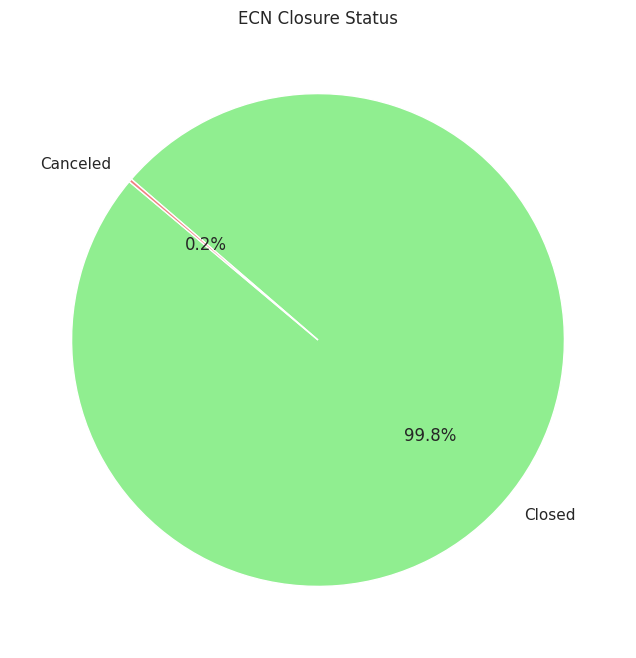

In [ ]:
plt.figure(figsize=(8, 8))
closure_counts = df['CLOSURE'].value_counts()
plt.pie(closure_counts, labels=closure_counts.index, autopct='%1.1f%%', startangle=140, colors=['lightgreen', 'lightcoral'])
plt.title('ECN Closure Status')
plt.show()


In [ ]:
office_by_type = df.groupby(['ECN_TYPE', 'ECR OFFICE Name']).size()

office_by_type

ECN_TYPE                              ECR OFFICE Name
Item Revision Change Notice(RCID)     AC                  5
                                      CCRQS               5
                                      CFG                 5
                                      CSE                19
                                      ELE                 3
                                      GT                 28
                                      ICE                10
                                      LC                 18
                                      PROC                1
                                      PSO                 1
                                      PUMPS              10
                                      TTL                19
                                      UPG                19
Real Replacement Change Notice(SCID)  CCRQS               2
                                      CFG                 2
                                      CSE                 4
                                      LC                  1
                                      UPG                 2
Scope Change Notice                   PE-CFG              6
                                      PUMPS               6
                                      UPG                 4
Scope Move Change Notice              CST                12
Scope Remove Change Notice            CST                 4
                                      GT                 16
dtype: int64

<Figure size 1600x800 with 0 Axes>

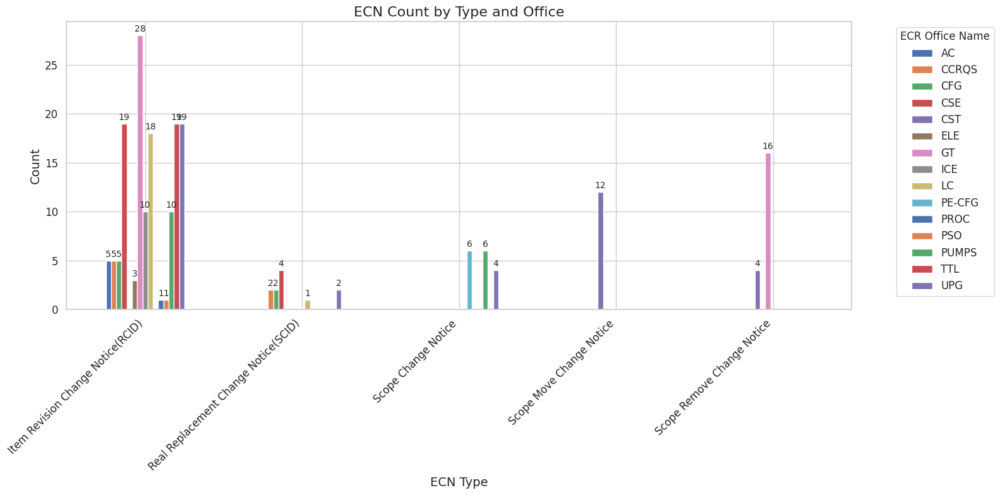

In [ ]:

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


office_by_type_unstacked = office_by_type.unstack()

plt.figure(figsize=(16, 8))
ax = office_by_type_unstacked.plot(kind='bar', figsize=(16, 8), fontsize=12)
plt.title('ECN Count by Type and Office', fontsize=16)
plt.xlabel('ECN Type', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.legend(title='ECR Office Name', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
plt.tight_layout()

# Add counts above each bar with increased font size, only if count > 0
for p in ax.patches:
    count = int(p.get_height())
    if count > 0:
        ax.annotate(str(count), (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 7), textcoords='offset points', fontsize=10)

plt.show()

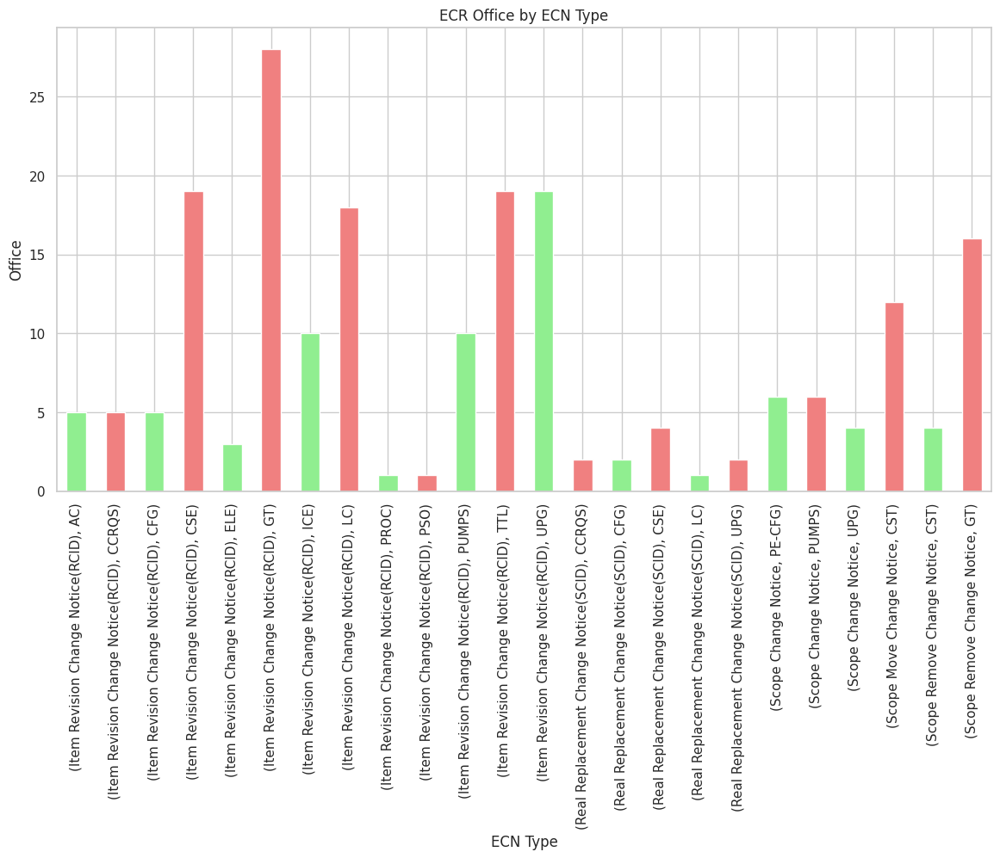

In [ ]:
office_by_type.plot(kind='bar', stacked=True, figsize=(14, 7), color=['lightgreen', 'lightcoral'])
plt.title('ECR Office by ECN Type')
plt.xlabel('ECN Type')
plt.ylabel('Office')
plt.show()

In [ ]:
# Stacked Bar Chart by ECN Type

In [ ]:
closure_by_type = df.groupby(['ECN_TYPE', 'CLOSURE']).size()

closure_by_type

ECN_TYPE                              CLOSURE 
Item Revision Change Notice(RCID)     Canceled      1
                                      Closed      302
Real Replacement Change Notice(SCID)  Closed       14
Scope Change Notice                   Closed       48
Scope Move Change Notice              Closed       27
Scope Quantity Change Notice          Closed        8
Scope Remove Change Notice            Closed       75
dtype: int64

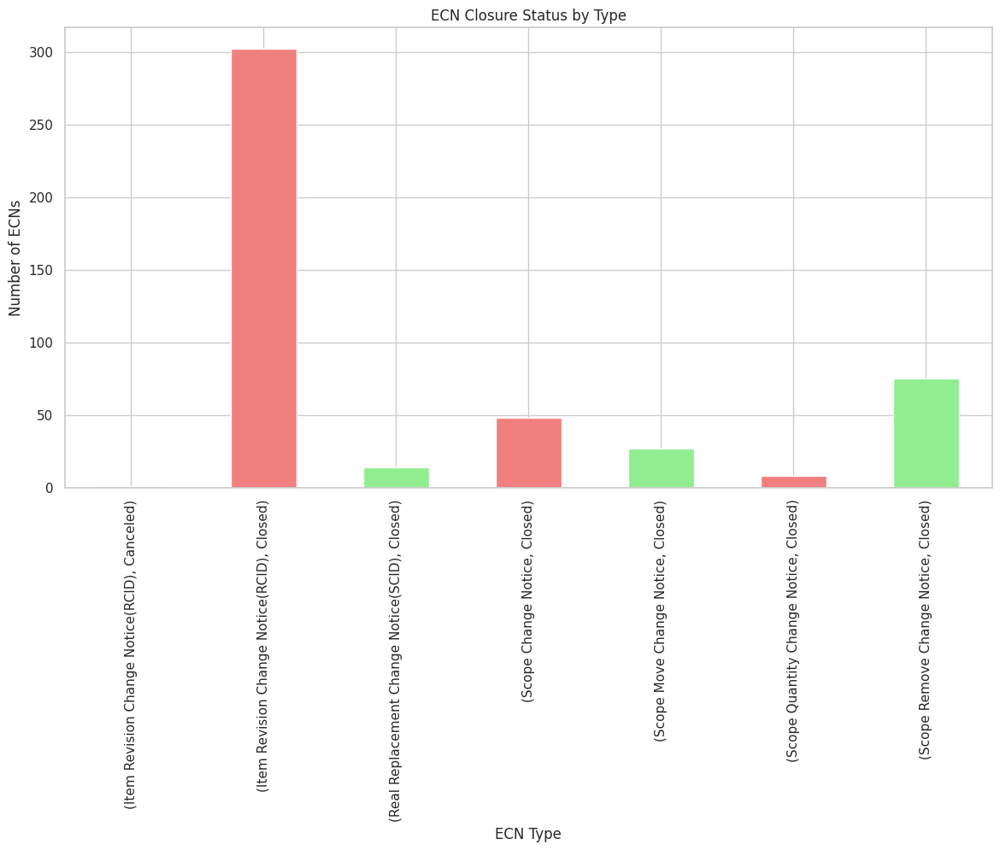

In [ ]:


closure_by_type.plot(kind='bar', stacked=True, figsize=(14, 7), color=['lightgreen', 'lightcoral'])
plt.title('ECN Closure Status by Type')
plt.xlabel('ECN Type')
plt.ylabel('Number of ECNs')
plt.show()


In [ ]:
df.head()

,ECN_CODE,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709041/003,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709040/003,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709039/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709041/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,M111Z8002_1709040/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN


In [ ]:
impacted_by_type = df.groupby(['IMPACTED_ITEMS', 'ECN_TYPE']).size().reset_index(name='counts')
impacted_by_type_sorted = impacted_by_type.sort_values(by=['ECN_TYPE', 'counts'], ascending=[True, False])




impacted_by_type_sorted

,IMPACTED_ITEMS,ECN_TYPE,counts
0,BOM_NLA8683007/000,Item Revision Change Notice(RCID),1
1,BOM_RQO160050020/000,Item Revision Change Notice(RCID),1
2,BOM_RQO160121020/000,Item Revision Change Notice(RCID),1
3,BOM_RQO160181020/000,Item Revision Change Notice(RCID),1
4,BOM_RQO160211010/000,Item Revision Change Notice(RCID),1
5,BOM_RQO160211210/000,Item Revision Change Notice(RCID),1
6,BOM_RQO160250020/000,Item Revision Change Notice(RCID),1
7,BOM_RQO160300020/000,Item Revision Change Notice(RCID),1
8,BOM_RQO160310420/000,Item Revision Change Notice(RCID),1
9,BOM_RQO160320020/000,Item Revision Change Notice(RCID),1


In [ ]:
# value count for each ECN_TYPE in impacted_by_solution_sorted



ecn_type_counts = impacted_by_type_sorted['ECN_TYPE'].value_counts()
print(ecn_type_counts)

ECN_TYPE
Item Revision Change Notice(RCID)       303
Scope Remove Change Notice               75
Scope Change Notice                      48
Scope Move Change Notice                 27
Real Replacement Change Notice(SCID)     14
Scope Quantity Change Notice              8
Name: count, dtype: int64


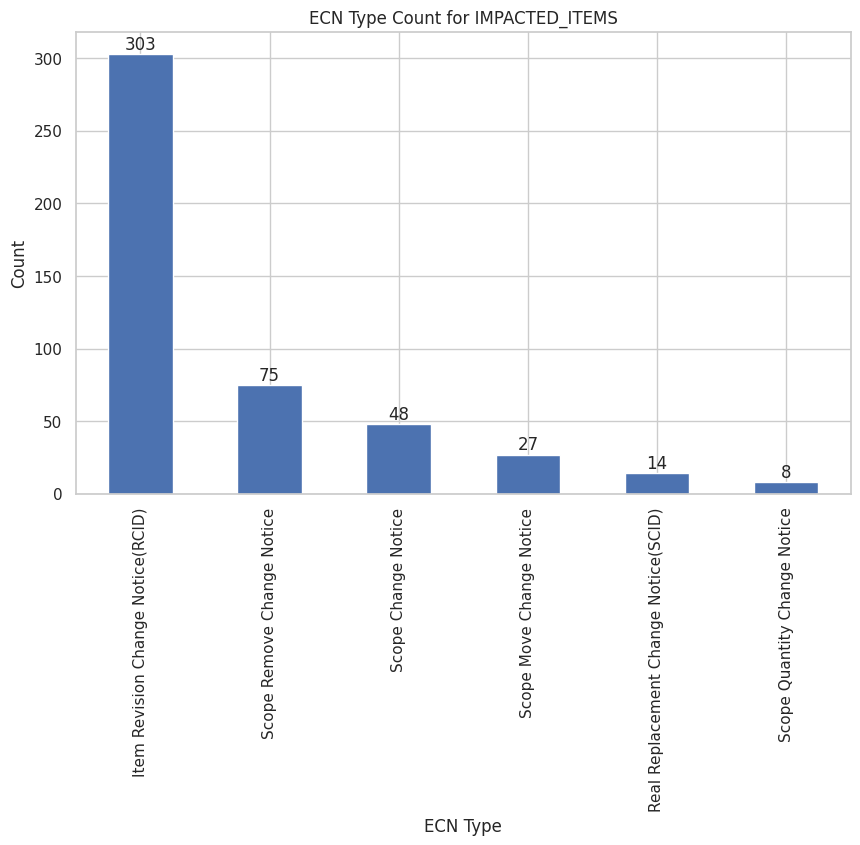

In [ ]:
# prompt: plot graph for ecn_type_counts  with count number on each bar

plt.figure(figsize=(10, 6))
ax = ecn_type_counts.plot(kind='bar')
plt.title('ECN Type Count for IMPACTED_ITEMS')
plt.xlabel('ECN Type')
plt.ylabel('Count')

# Add counts above each bar
for p in ax.patches:
    ax.annotate(str(int(p.get_height())), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 7), textcoords='offset points')

plt.show()

In [ ]:
# Time Series Line Chart

In [ ]:
'''
# Convert dates to datetime objects
og_df['ECN_CREATION_DATE'] = pd.to_datetime(og_df['ECN_CREATION_DATE'])
og_df['EXECUTION_DATE'] = pd.to_datetime(og_df['EXECUTION_DATE'])

# Group by month and count ECNs
creation_trend = og_df.set_index('ECN_CREATION_DATE').resample('M').size()
execution_trend = og_df.set_index('EXECUTION_DATE').resample('M').size()

plt.figure(figsize=(14, 7))
plt.plot(creation_trend, label='ECN Creation Trend', marker='o')
plt.plot(execution_trend, label='ECN Execution Trend', marker='x')
plt.title('Monthly ECN Creation and Execution Trends')
plt.xlabel('Date')
plt.ylabel('Number of ECNs')
plt.legend()
plt.show()
'''

"\n# Convert dates to datetime objects\nog_df['ECN_CREATION_DATE'] = pd.to_datetime(og_df['ECN_CREATION_DATE'])\nog_df['EXECUTION_DATE'] = pd.to_datetime(og_df['EXECUTION_DATE'])\n\n# Group by month and count ECNs\ncreation_trend = og_df.set_index('ECN_CREATION_DATE').resample('M').size()\nexecution_trend = og_df.set_index('EXECUTION_DATE').resample('M').size()\n\nplt.figure(figsize=(14, 7))\nplt.plot(creation_trend, label='ECN Creation Trend', marker='o')\nplt.plot(execution_trend, label='ECN Execution Trend', marker='x')\nplt.title('Monthly ECN Creation and Execution Trends')\nplt.xlabel('Date')\nplt.ylabel('Number of ECNs')\nplt.legend()\nplt.show()\n"

In [ ]:
# Heatmap of ECNs by Month and Year

In [ ]:

'''
df['creation_month'] = df['ECN_CREATION_DATE'].dt.month
df['creation_year'] = df['ECN_CREATION_DATE'].dt.year

heatmap_data = df.pivot_table(index='creation_year', columns='creation_month', aggfunc='size', fill_value=0)

plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, cmap='Blues', annot=True, fmt='d')
plt.title('ECN Creation Heatmap by Month and Year')
plt.xlabel('Month')
plt.ylabel('Year')
plt.show()
'''

"\ndf['creation_month'] = df['ECN_CREATION_DATE'].dt.month\ndf['creation_year'] = df['ECN_CREATION_DATE'].dt.year\n\nheatmap_data = df.pivot_table(index='creation_year', columns='creation_month', aggfunc='size', fill_value=0)\n\nplt.figure(figsize=(12, 8))\nsns.heatmap(heatmap_data, cmap='Blues', annot=True, fmt='d')\nplt.title('ECN Creation Heatmap by Month and Year')\nplt.xlabel('Month')\nplt.ylabel('Year')\nplt.show()\n"

In [ ]:
# Bar Chart for ECNs Reviewed by Each Reviewer

In [ ]:
'''
reviewer_counts = df['REVIEWER_ID'].value_counts().head(10)  # Top 10 reviewers

plt.figure(figsize=(12, 6))
sns.barplot(x=reviewer_counts.index, y=reviewer_counts.values, palette='viridis')
plt.title('Top 10 Reviewers by Number of ECNs Reviewed')
plt.xlabel('Reviewer ID')
plt.ylabel('Number of ECNs')
plt.xticks(rotation=45)
plt.show()
'''

"\nreviewer_counts = df['REVIEWER_ID'].value_counts().head(10)  # Top 10 reviewers\n\nplt.figure(figsize=(12, 6))\nsns.barplot(x=reviewer_counts.index, y=reviewer_counts.values, palette='viridis')\nplt.title('Top 10 Reviewers by Number of ECNs Reviewed')\nplt.xlabel('Reviewer ID')\nplt.ylabel('Number of ECNs')\nplt.xticks(rotation=45)\nplt.show()\n"

In [ ]:
#  Bar Chart for Impacted Items

In [ ]:
'''
plt.figure(figsize=(14, 7))
sns.countplot(y='IMPACTED_ITEMS', data=df, order=df['IMPACTED_ITEMS'].value_counts().index, palette='coolwarm')
plt.title('Count of ECNs by Impacted Items')
plt.xlabel('Number of ECNs')
plt.ylabel('Impacted Items')
plt.show()
'''

"\nplt.figure(figsize=(14, 7))\nsns.countplot(y='IMPACTED_ITEMS', data=df, order=df['IMPACTED_ITEMS'].value_counts().index, palette='coolwarm')\nplt.title('Count of ECNs by Impacted Items')\nplt.xlabel('Number of ECNs')\nplt.ylabel('Impacted Items')\nplt.show()\n"

In [ ]:
# Bar Chart of Execution to Review Duration

In [ ]:
'''
df['execution_to_review_duration'] = (pd.to_datetime(df['REVIEWER_DEC_DATE']) - df['EXECUTION_DATE']).dt.days

plt.figure(figsize=(10, 6))
sns.histplot(df['execution_to_review_duration'], bins=30, kde=True, color='purple')
plt.title('Execution to Review Duration')
plt.xlabel('Days')
plt.ylabel('Frequency')
plt.show()
'''

"\ndf['execution_to_review_duration'] = (pd.to_datetime(df['REVIEWER_DEC_DATE']) - df['EXECUTION_DATE']).dt.days\n\nplt.figure(figsize=(10, 6))\nsns.histplot(df['execution_to_review_duration'], bins=30, kde=True, color='purple')\nplt.title('Execution to Review Duration')\nplt.xlabel('Days')\nplt.ylabel('Frequency')\nplt.show()\n"

In [ ]:
# Pie Chart for Reviewer Decisions

In [ ]:
'''
plt.figure(figsize=(8, 8))
decision_counts = df['REVIEWER_DECISION'].value_counts()
plt.pie(decision_counts, labels=decision_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral', 'gold'])
plt.title('Reviewer Decision Distribution')
plt.show()
'''

"\nplt.figure(figsize=(8, 8))\ndecision_counts = df['REVIEWER_DECISION'].value_counts()\nplt.pie(decision_counts, labels=decision_counts.index, autopct='%1.1f%%', startangle=140, colors=['skyblue', 'lightcoral', 'gold'])\nplt.title('Reviewer Decision Distribution')\nplt.show()\n"

##Data preprocessing and Model building

In [ ]:
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

file_path = '/content/ECN_GT_All_WAB.xlsx'
og_df = pd.read_excel(file_path)


df = og_df[['ECN_CODE', 'ECN_TYPE', 'ECN_DESC', 'COSTING_PROJECTS', 'IMPACTED_ITEMS', 'SOLUTION_ITEMS', 'CLOSURE', 'AGING GROUP', 'ECR OFFICE Name']]


In [ ]:
df.head()

,ECN_CODE,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name
0,CIS-033635,Scope Change Notice,1709039-41 Modifiche BOM,1709041,"M111Z8002_1709041/003,M111Z8002_1709040/003,M1...","M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
1,CIS-033699,Scope Change Notice,8844182 - Dummy addition,8844182,"M66508002_8844182/016,M66508002_8844182/012","M66508002_8844182/018,M66508002_8844182/017",Closed,>40,NaN
2,CIS-033803,Scope Change Notice,Woodside Pluto 8840659-60-61-62,8840659,"M111F0019_8840659/001,M111F0019_8840660/001,M1...","M111F0019_8840660/003,M111F0019_8840661/003,M1...",Closed,>40,UPG
3,CIS-033860,Scope Change Notice,1709039;1709040;1709041 Add a Dummy,1709041,"M11108002_1709040/000,M11108002_1709039/000,M1...","M11108002_1709040/001,M11108002_1709041/001,M1...",Closed,>40,NaN
4,CIS-033956,Scope Change Notice,Qatar GTG NFS- 1709039 - Dummy position change,1709039,"M680B0850_1709039/000,M68000951_1709041/000,M6...","M680B0850_1709041/001,M680B0850_1709039/001,M6...",Closed,>40,NaN


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 244 entries, 0 to 243
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   ECN_CODE          244 non-null    object
 1   ECN_TYPE          244 non-null    object
 2   ECN_DESC          244 non-null    object
 3   COSTING_PROJECTS  244 non-null    int64 
 4   IMPACTED_ITEMS    244 non-null    object
 5   SOLUTION_ITEMS    239 non-null    object
 6   CLOSURE           244 non-null    object
 7   AGING GROUP       244 non-null    object
 8   ECR OFFICE Name   105 non-null    object
dtypes: int64(1), object(8)
memory usage: 17.3+ KB


In [ ]:
df.drop(["ECN_CODE"],axis=1, inplace=True)

<ipython-input-69-e367c41d613e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(["ECN_CODE"],axis=1, inplace=True)


In [ ]:
# u need to merge similar rows in ECN_DESC

In [ ]:
# diplay in ECN_DESC if it contains the word 'dummy'.

dummy_ecn_desc = og_df[og_df['ECN_DESC'].astype(str).str.contains('Dummy', na=False)]
dummy_ecn_desc

,ECN_CODE,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,ECN_CREATOR_ID,ECN_CREATION_DATE,CLOSURE,DISPOSITION,MATURITY,CREATION_DATE,UPDATE_DATE,AGING,AGING GROUP,ECR OFFICE Name
1,CIS-033699,Scope Change Notice,8844182 - Dummy addition,8844182,"M66508002_8844182/016,M66508002_8844182/012","M66508002_8844182/018,M66508002_8844182/017",503033706,2024-01-30,Closed,Approved,Complete,2024-01-30,2024-01-31,262,>40,NaN
3,CIS-033860,Scope Change Notice,1709039;1709040;1709041 Add a Dummy,1709041,"M11108002_1709040/000,M11108002_1709039/000,M1...","M11108002_1709040/001,M11108002_1709041/001,M1...",503033706,2024-02-15,Closed,Approved,Complete,2024-02-15,2024-02-15,247,>40,NaN
4,CIS-033956,Scope Change Notice,Qatar GTG NFS- 1709039 - Dummy position change,1709039,"M680B0850_1709039/000,M68000951_1709041/000,M6...","M680B0850_1709041/001,M680B0850_1709039/001,M6...",503033706,2024-02-21,Closed,Approved,Complete,2024-02-21,2024-02-21,240,>40,NaN
5,CIS-034411,Scope Change Notice,1709039 Dummy to be added,1709039,"M11101900_1709039/001,M11101900_1709039/000","M11101900_1709039/002,M11101900_1709039/003",503033706,2024-03-29,Closed,Approved,Complete,2024-03-29,2024-03-29,203,>40,NaN
6,CIS-034480,Scope Change Notice,1709040;1709041 Dummy to be added,1709041,"M11101900_1709040/000,M11101900_1709040/001,M1...","M11101900_1709041/003,M11101900_1709040/003,M1...",503033706,2024-04-08,Closed,Approved,Complete,2024-04-08,2024-04-08,193,>40,NaN
8,CIS-034905,Scope Change Notice,1709039-NFS GTG - COOLING PIPING & EXHAUST DIF...,1709041,"M67000800_1709041/008,M67000800_1709039/008,M6...","M67000800_1709041/009,M67000800_1709041/010,M6...",503033706,2024-05-16,Closed,Approved,Complete,2024-05-16,2024-05-20,155,>40,NaN
201,SCR-015850,Scope Remove Change Notice,Scope Remove Unused Dummy Items from the LIGHT...,1703681,"M11200044_1703682/000,M11200044_1703681/000,M1...","M11200044_1703681/002,M11200044_1703681/003,M1...",212420535,2017-01-30,Closed,Approved,Complete,2017-01-30,2017-01-30,332,>40,CST


In [ ]:
df.head()

,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name
0,Scope Change Notice,1709039-41 Modifiche BOM,1709041,"M111Z8002_1709041/003,M111Z8002_1709040/003,M1...","M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN
1,Scope Change Notice,8844182 - Dummy addition,8844182,"M66508002_8844182/016,M66508002_8844182/012","M66508002_8844182/018,M66508002_8844182/017",Closed,>40,NaN
2,Scope Change Notice,Woodside Pluto 8840659-60-61-62,8840659,"M111F0019_8840659/001,M111F0019_8840660/001,M1...","M111F0019_8840660/003,M111F0019_8840661/003,M1...",Closed,>40,UPG
3,Scope Change Notice,1709039;1709040;1709041 Add a Dummy,1709041,"M11108002_1709040/000,M11108002_1709039/000,M1...","M11108002_1709040/001,M11108002_1709041/001,M1...",Closed,>40,NaN
4,Scope Change Notice,Qatar GTG NFS- 1709039 - Dummy position change,1709039,"M680B0850_1709039/000,M68000951_1709041/000,M6...","M680B0850_1709041/001,M680B0850_1709039/001,M6...",Closed,>40,NaN


In [ ]:
df['IMPACTED_ITEMS'].value_counts().sum()

244

In [ ]:
df['IMPACTED_ITEMS'].nunique()

244

In [ ]:
df["File_prefix"]=df['IMPACTED_ITEMS'].str[0]

df.head()

<ipython-input-73-47c782ccf2c0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["File_prefix"]=df['IMPACTED_ITEMS'].str[0]


,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name,File_prefix
0,Scope Change Notice,1709039-41 Modifiche BOM,1709041,"M111Z8002_1709041/003,M111Z8002_1709040/003,M1...","M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,>40,NaN,M
1,Scope Change Notice,8844182 - Dummy addition,8844182,"M66508002_8844182/016,M66508002_8844182/012","M66508002_8844182/018,M66508002_8844182/017",Closed,>40,NaN,M
2,Scope Change Notice,Woodside Pluto 8840659-60-61-62,8840659,"M111F0019_8840659/001,M111F0019_8840660/001,M1...","M111F0019_8840660/003,M111F0019_8840661/003,M1...",Closed,>40,UPG,M
3,Scope Change Notice,1709039;1709040;1709041 Add a Dummy,1709041,"M11108002_1709040/000,M11108002_1709039/000,M1...","M11108002_1709040/001,M11108002_1709041/001,M1...",Closed,>40,NaN,M
4,Scope Change Notice,Qatar GTG NFS- 1709039 - Dummy position change,1709039,"M680B0850_1709039/000,M68000951_1709041/000,M6...","M680B0850_1709041/001,M680B0850_1709039/001,M6...",Closed,>40,NaN,M


In [ ]:
df['ECN_TYPE'].unique()

array(['Scope Change Notice', 'Item Revision Change Notice(RCID)',
       'Real Replacement Change Notice(SCID)', 'Scope Move Change Notice',
       'Scope Quantity Change Notice', 'Scope Remove Change Notice'],
      dtype=object)

In [ ]:
df['ECR OFFICE Name'].unique()

array([nan, 'UPG', 'PE-CFG', 'PUMPS', 'TTL', 'GT', 'ICE', 'PSO', 'CFG',
       'CCRQS', 'LC', 'ELE', 'CSE', 'AC', 'PROC', 'CST'], dtype=object)

In [ ]:
df.fillna("Unknown", inplace=True)

<ipython-input-76-03e27043bf8c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.fillna("Unknown", inplace=True)


In [ ]:
# df['AGING'].fillna(df['AGING'].median(), inplace=True)



In [ ]:
df['AGING GROUP'].unique()

array(['>40', '0-20', '20-40'], dtype=object)

In [ ]:
#do label encoding
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df['AGING GROUP'] = label_encoder.fit_transform(df['AGING GROUP'])

<ipython-input-79-57f072f2ddb9>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['AGING GROUP'] = label_encoder.fit_transform(df['AGING GROUP'])


In [ ]:
# df['execution_to_review_duration'].fillna(df['execution_to_review_duration'].median(), inplace=True)

In [ ]:
# df['creation_to_execution'].fillna(df['creation_to_execution'].median(), inplace=True)

In [ ]:
# df['creation_to_execution'].fillna(df['creation_to_execution'].median(), inplace=True)

In [ ]:
#modified syntax
# df.fillna({'execution_to_review' : df['creation_to_execution'].median()}, inplace=True)

In [ ]:
# df.fillna({'total_lifecycle_duration' : df['total_lifecycle_duration'].median()}, inplace=True)

In [ ]:
'''
# Duration features
df['creation_to_execution'] = (pd.to_datetime(df['EXECUTION_DATE']) - pd.to_datetime(df['ECN_CREATION_DATE'])).dt.days
df['execution_to_review'] = (pd.to_datetime(df['REVIEWER_DEC_DATE']) - pd.to_datetime(df['EXECUTION_DATE'])).dt.days
df['total_lifecycle_duration'] = (pd.to_datetime(df['UPDATE_DATE']) - pd.to_datetime(df['ECN_CREATION_DATE'])).dt.days

# Month and year extraction
df['creation_month'] = pd.to_datetime(df['ECN_CREATION_DATE']).dt.month
df['creation_year'] = pd.to_datetime(df['ECN_CREATION_DATE']).dt.year
'''

"\n# Duration features\ndf['creation_to_execution'] = (pd.to_datetime(df['EXECUTION_DATE']) - pd.to_datetime(df['ECN_CREATION_DATE'])).dt.days\ndf['execution_to_review'] = (pd.to_datetime(df['REVIEWER_DEC_DATE']) - pd.to_datetime(df['EXECUTION_DATE'])).dt.days\ndf['total_lifecycle_duration'] = (pd.to_datetime(df['UPDATE_DATE']) - pd.to_datetime(df['ECN_CREATION_DATE'])).dt.days\n\n# Month and year extraction\ndf['creation_month'] = pd.to_datetime(df['ECN_CREATION_DATE']).dt.month\ndf['creation_year'] = pd.to_datetime(df['ECN_CREATION_DATE']).dt.year\n"

In [ ]:
# Standardize or normalize numerical features to ensure they are on the same scale.
'''
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
numerical_cols = ['AGING', 'creation_to_execution', 'execution_to_review', 'total_lifecycle_duration']
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])
'''

"\nfrom sklearn.preprocessing import StandardScaler\n\nscaler = StandardScaler()\nnumerical_cols = ['AGING', 'creation_to_execution', 'execution_to_review', 'total_lifecycle_duration']\ndf[numerical_cols] = scaler.fit_transform(df[numerical_cols])\n"

In [ ]:
'''
Predicting ECN Closure Status
Objective: Predict whether an ECN will be closed or remain open based on its characteristics (e.g., type, creator office, aging, maturity).
Model Type: Classification (Closed vs. Open).
'''

'\nPredicting ECN Closure Status\nObjective: Predict whether an ECN will be closed or remain open based on its characteristics (e.g., type, creator office, aging, maturity).\nModel Type: Classification (Closed vs. Open).\n'

In [ ]:
import pandas as pd



def split_and_insert_rows(df, col):
    new_rows = []
    for index, row in df.iterrows():
        values = str(row[col]).split(',')
        for value in values:
            new_row = row.copy()  # Create a copy of the original row
            new_row[col] = value.strip() #update the value
            new_rows.append(new_row)
    return pd.DataFrame(new_rows)


#Example usage assuming the column name is 'IMPACTED_ITEMS'
df = split_and_insert_rows(df, 'IMPACTED_ITEMS')


df.head()


,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS,CLOSURE,AGING GROUP,ECR OFFICE Name,File_prefix
0,2,7,1709041,M111Z8002_1709041/003,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,2,Unknown,M
0,2,7,1709041,M111Z8002_1709040/003,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,2,Unknown,M
0,2,7,1709041,M111Z8002_1709039/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,2,Unknown,M
0,2,7,1709041,M111Z8002_1709041/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,2,Unknown,M
0,2,7,1709041,M111Z8002_1709040/002,"M111Z8002_1709039/004,M111Z8002_1709041/005,M1...",Closed,2,Unknown,M


In [ ]:
#encoding

le_ECN_DESC=LabelEncoder()
df['ECN_DESC']=le_ECN_DESC.fit_transform(df['ECN_DESC'])
le_name_mapping = dict(zip(le_ECN_DESC.classes_, le_ECN_DESC.transform(le_ECN_DESC.classes_)))


<ipython-input-89-70e1c1b456ab>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ECN_DESC']=le_ECN_DESC.fit_transform(df['ECN_DESC'])


In [ ]:
le_name_mapping


{'- Liquid fuel skid purchase specification revision after order\n- Added lifting spreader bar to scope of supply': 0,
 '- Purchase spec update according to BQF comments\n- Interconnecting piping added to scope of supply': 1,
 '- Revisionare BOM_SMO9978258 combiando la QTY da 11 a 12 per la MK201\n- Revisionare BOM_SMO9978095 aggiungendo spessore in teflon di 10mm\n- Revisionare SMO9978105 cambiando la MK42 con una nuova specifica che compri un raccordo dritto 1 1/2" NPT-M 1 1/4" OD SWAGELOK modello SS-2000-1-24\n- Revisionare SOM6770252 come da distinta BOM_SMO9985918': 2,
 '- UPDATED SCRUBBER SHEET: added heat tracing, TP107 rating reduced to 300#, removed shut-down valve and related PSV and PIT from fuel gas inlet;\n- updated line tags;\n- updated 96SV-1A/B/C loop;\n- implemented minor comments according Customer comments': 3,
 '1. Shaft heat treatment changed from H2 to TH\n2. Inner casing revised to update lifting hole shifting to avoid interference b/w  tooling holes and lifting 

In [ ]:
le_ECN_TYPE=LabelEncoder()
df['ECN_TYPE']=le_ECN_TYPE.fit_transform(df['ECN_TYPE'])
le_ECN_TYPE_classes = dict(zip(le_ECN_TYPE.classes_, le_ECN_TYPE.transform(le_ECN_TYPE.classes_)))


<ipython-input-94-a16621538efe>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ECN_TYPE']=le_ECN_TYPE.fit_transform(df['ECN_TYPE'])


In [ ]:
le_ECN_TYPE_classes

{'Item Revision Change Notice(RCID)': 0,
 'Real Replacement Change Notice(SCID)': 1,
 'Scope Change Notice': 2,
 'Scope Move Change Notice': 3,
 'Scope Quantity Change Notice': 4,
 'Scope Remove Change Notice': 5}

In [ ]:
#encoding

le_IMPACTED_ITEMS=LabelEncoder()
df['IMPACTED_ITEMS']=le_IMPACTED_ITEMS.fit_transform(df['IMPACTED_ITEMS'])
le_IMPACTED_ITEMS_classes = dict(zip(le_IMPACTED_ITEMS.classes_, le_IMPACTED_ITEMS.transform(le_IMPACTED_ITEMS.classes_)))

In [ ]:
#encoding

le_SOLUTION_ITEMS=LabelEncoder()
df['SOLUTION_ITEMS']=le_SOLUTION_ITEMS.fit_transform(df['SOLUTION_ITEMS'])
le_SOLUTION_ITEMS_classes = dict(zip(le_SOLUTION_ITEMS.classes_, le_SOLUTION_ITEMS.transform(le_SOLUTION_ITEMS.classes_)))

In [ ]:
df.drop(['CLOSURE', 'AGING GROUP', 'ECR OFFICE Name', 'File_prefix'],axis=1, inplace=True)

In [ ]:
df.head()

,ECN_TYPE,ECN_DESC,COSTING_PROJECTS,IMPACTED_ITEMS,SOLUTION_ITEMS
0,2,7,1709041,167,80
0,2,7,1709041,165,80
0,2,7,1709041,162,80
0,2,7,1709041,166,80
0,2,7,1709041,164,80


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 475 entries, 0 to 243
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   ECN_TYPE          475 non-null    int64
 1   ECN_DESC          475 non-null    int64
 2   COSTING_PROJECTS  475 non-null    int64
 3   IMPACTED_ITEMS    475 non-null    int64
 4   SOLUTION_ITEMS    475 non-null    int64
dtypes: int64(5)
memory usage: 22.3 KB


##Model building - not completed

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score




X=df.drop(columns=['SOLUTION_ITEMS'])
y=df['SOLUTION_ITEMS']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


clf = RandomForestClassifier(n_estimators=10)
clf.fit(X_train, y_train)


y_pred = clf.predict(X_test)



In [ ]:
accuracy_score(y_test, y_pred)

0.5052631578947369

In [ ]:
classification_report(y_test, y_pred)

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_

'              precision    recall  f1-score   support\n\n           0       0.00      0.00      0.00         1\n           1       0.50      1.00      0.67         2\n           2       0.00      0.00      0.00         1\n           4       1.00      1.00      1.00         1\n           8       0.00      0.00      0.00         0\n          10       0.00      0.00      0.00         0\n          11       0.00      0.00      0.00         1\n          14       0.00      0.00      0.00         1\n          15       0.00      0.00      0.00         0\n          19       0.00      0.00      0.00         1\n          23       0.00      0.00      0.00         1\n          30       0.00      0.00      0.00         1\n          31       0.17      1.00      0.29         1\n          32       1.00      1.00      1.00         1\n          36       0.00      0.00      0.00         3\n          37       0.00      0.00      0.00         1\n          40       0.00      0.00      0.00         1\n       

##Test -notcompleted

In [ ]:
!python -m spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 1.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
import spacy
nlp=spacy.load("en_core_web_lg")

def similarityMethod(wordToCompare, stringStatement ):

  '''
  #using spacy similarity

  similarArray=[]
  base_token=nlp(wordToCompare)
  doc=nlp(stringStatement)

  for token in doc:
    print(base_token.text," | ",token.text," | ",base_token.similarity(token))

    if base_token.similarity(token)>0.5:
      similarArray.append(token.text)

  print("\n\n Similar words using spacy similarity are below")
  return similarArray

  '''

  #using cosine similarity

  similarArray=[]
  base_token=wordToCompare
  doc=stringStatement.split(' ')

  for i in doc:
    print("Token: ",i, "    ", cosine_similarity(    [nlp(base_token).vector]  ,   [nlp(i).vector]))
    if cosine_similarity(    [nlp(base_token).vector]  ,   [nlp(i).vector])>0.5:
      similarArray.append(i)

  print("\n\n Similar words using cosine similarity are below")
  return similarArray






In [ ]:
le_ECN_DESC.inverse_transform(df['ECN_DESC'])

array(['1709039-41 Modifiche BOM', '1709039-41 Modifiche BOM',
       '1709039-41 Modifiche BOM', '1709039-41 Modifiche BOM',
       '1709039-41 Modifiche BOM', '1709039-41 Modifiche BOM',
       '8844182 - Dummy addition', '8844182 - Dummy addition',
       'Woodside Pluto 8840659-60-61-62',
       'Woodside Pluto 8840659-60-61-62',
       'Woodside Pluto 8840659-60-61-62',
       'Woodside Pluto 8840659-60-61-62',
       '1709039;1709040;1709041 Add a Dummy',
       '1709039;1709040;1709041 Add a Dummy',
       '1709039;1709040;1709041 Add a Dummy',
       'Qatar GTG NFS- 1709039 - Dummy position change',
       'Qatar GTG NFS- 1709039 - Dummy position change',
       'Qatar GTG NFS- 1709039 - Dummy position change',
       'Qatar GTG NFS- 1709039 - Dummy position change',
       'Qatar GTG NFS- 1709039 - Dummy position change',
       'Qatar GTG NFS- 1709039 - Dummy position change',
       '1709039 Dummy to be added', '1709039 Dummy to be added',
       '1709040;1709041 Dummy to be

In [ ]:
# prompt: in df['ECN_DESC] i have string statements. do cosine similarity

from sklearn.metrics.pairwise import cosine_similarity

# Assuming 'df' is your DataFrame and 'ECN_DESC' contains the string statements.
# Example usage:
word_to_compare = "example_word"  # Replace with the word you want to compare

# Assuming le_ECN_DESC is defined in your original code
# inverse transform the ECN_DESC column back to original string
df['ECN_DESC_original'] = le_ECN_DESC.inverse_transform(df['ECN_DESC'])


for index, row in df.iterrows():
  string_statement = row['ECN_DESC_original']
  similar_words = similarityMethod(word_to_compare, string_statement)
  print(f"Similar words for ECN_DESC: {string_statement}: {similar_words}")


#ECR_23_24_All_Closed_WoAB

## ECR - 2023, 2024, All office, Closed, Without As Built

In [ ]:
import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

og_df=pd.read_excel("/content/ECR_23_24_All_Closed_WoAB.xlsx")

og_df.head()

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,COMMENT,ACKNOWLEDGE_DATE,PROMISE_DATE,SSO ID,ECR_CREATION_DATE,CHANGE_TYPE,ENG IMPACTED LIST,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE_ON_RECEIVED_ITEMS,IMPACT VERIFICATION,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ECR CREATION YEAR,AGING,APPROVER,APPROVER_DECISION,APPROVER DESC DATE,CLOSURE,DISPOSITION,MATURITY,AS_BUILT_FROM_SITE,REFERENCE ECR,INTERNAL_REFERENT,EXCLUDED,EXCLUDED for Graph,DEFECTIVE CHANGE,FW,ORGANIZATION NAME,MAIN_FUNCTION,PL,SUB_PL,MANAGER NAME,ECR CREATION MONTH
0,ECR-443835,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,NaN,NaN,NaN,105058600,2021-12-30,FFF&P ONLY,NaN,315535,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",NaN,Yes,The code selected for the 96EP needs to be upd...,BOM_SMO1467038/003,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE,2021,0.50,105710853,Approved,2021-12-30,Closed,Approved,Complete,NO,NaN,NaN,Y,N,Yes,2021-53,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Dona', Stefano",12
1,ECR-421583,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,NaN,NaN,NaN,105058600,2021-06-16,FFF&P ONLY,NaN,315535,INSTRUMENTATION,DOCUMENT,NaN,Yes,The selected codes for the Emergency Push Butt...,BOM_SMO1466802/002,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE,2021,197.54,105710853,Approved,2021-06-17,Closed,Approved,Complete,NO,NaN,NaN,Y,N,Yes,2021-25,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Dona', Stefano",6
2,ECR-419628,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,NaN,NaN,NaN,105058600,2021-05-28,FFF&P ONLY,NaN,315546,INSTRUMENTATION,CHANGE QTY,NaN,Yes,The RMO374512756 under the BOM_SSO2495319 is l...,BOM_SSO2495319/000,S750B0550_MINERAL OIL CONSOLE INSTRUMENTATION,GEP-ENG,ICE,2021,216.54,105710853,Approved,2021-05-31,Closed,Approved,Complete,NO,NaN,NaN,Y,N,Yes,2021-22,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Dona', Stefano",5
3,ECR-438242,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,NaN,NaN,NaN,105058600,2021-11-16,FFF&P ONLY,NaN,315547,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",NaN,Yes,The code RTO507911911 has been inclueded in th...,BOM_SMO1467038/002,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE,2021,44.50,105710853,Approved,2021-11-17,Closed,Approved,Complete,NO,NaN,NaN,Y,N,Yes,2021-47,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Dona', Stefano",11
4,ECR-406205,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,NaN,NaN,NaN,105058600,2021-02-03,FFF&P ONLY,NaN,315535,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",NaN,Yes,During finalization of electrical arrangement ...,BOM_SMO1466802/000,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE,2021,330.50,105710853,Approved,2021-02-03,Closed,Approved,Complete,NO,NaN,NaN,Y,N,Yes,2021-6,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Dona', Stefano",2


In [ ]:
df=og_df[['ECR_CODE', 'ECR_TYPE', 'SOURCE OF CHANGE', 'REASON_DESC', 'SSO ID', 'CHANGE_TYPE', 'COSTING_PROJECTS', 'MATERIAL_CATEGORY', 'CHANGE_CATEGORY', 'CHANGE DESCRIPTION', 'IMPACTEDITEM', 'IMPACTED ITEM DESCRIPTION', 'FUNCTION', 'DIVISION' ]]

In [ ]:
df.head()

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,SSO ID,CHANGE_TYPE,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION
0,ECR-443835,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,105058600,FFF&P ONLY,315535,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",The code selected for the 96EP needs to be upd...,BOM_SMO1467038/003,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE
1,ECR-421583,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,105058600,FFF&P ONLY,315535,INSTRUMENTATION,DOCUMENT,The selected codes for the Emergency Push Butt...,BOM_SMO1466802/002,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE
2,ECR-419628,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,105058600,FFF&P ONLY,315546,INSTRUMENTATION,CHANGE QTY,The RMO374512756 under the BOM_SSO2495319 is l...,BOM_SSO2495319/000,S750B0550_MINERAL OIL CONSOLE INSTRUMENTATION,GEP-ENG,ICE
3,ECR-438242,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,105058600,FFF&P ONLY,315547,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",The code RTO507911911 has been inclueded in th...,BOM_SMO1467038/002,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE
4,ECR-406205,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,105058600,FFF&P ONLY,315535,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",During finalization of electrical arrangement ...,BOM_SMO1466802/000,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE


In [ ]:
df.shape

(5115, 14)

In [ ]:
df=df.drop_duplicates()

In [ ]:
df.isnull().sum()

,0
ECR_CODE,0
ECR_TYPE,0
SOURCE OF CHANGE,0
REASON_DESC,0
SSO ID,0
CHANGE_TYPE,0
COSTING_PROJECTS,0
MATERIAL_CATEGORY,0
CHANGE_CATEGORY,1
CHANGE DESCRIPTION,0


In [ ]:
df['CHANGE_CATEGORY'].fillna("Unknown", inplace=True)

df['IMPACTED ITEM DESCRIPTION'].fillna("Unknown", inplace=True)

<ipython-input-7-16984e141bf4>:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['CHANGE_CATEGORY'].fillna("Unknown", inplace=True)
<ipython-input-7-16984e141bf4>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try u

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5115 entries, 0 to 5114
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   ECR_CODE                   5115 non-null   object
 1   ECR_TYPE                   5115 non-null   object
 2   SOURCE OF CHANGE           5115 non-null   object
 3   REASON_DESC                5115 non-null   object
 4   SSO ID                     5115 non-null   object
 5   CHANGE_TYPE                5115 non-null   object
 6   COSTING_PROJECTS           5115 non-null   object
 7   MATERIAL_CATEGORY          5115 non-null   object
 8   CHANGE_CATEGORY            5115 non-null   object
 9   CHANGE DESCRIPTION         5115 non-null   object
 10  IMPACTEDITEM               5115 non-null   object
 11  IMPACTED ITEM DESCRIPTION  5115 non-null   object
 12  FUNCTION                   5115 non-null   object
 13  DIVISION                   5115 non-null   object
dtypes: objec

In [ ]:
df.head(1)

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,SSO ID,CHANGE_TYPE,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION
0,ECR-443835,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,ANY MISTAKES GENERATED BY ENG SUPPLIER,105058600,FFF&P ONLY,315535,INSTRUMENTATION,"ADD COMPONENT,REMOVE COMPONENT",The code selected for the 96EP needs to be upd...,BOM_SMO1467038/003,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE


## Division - GT

In [ ]:
##

In [ ]:
'''
do only for GT division
'''

'\ndo only for GT division\n'

In [ ]:
df= df[df['DIVISION'] == 'GT']


In [ ]:
df.head()

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,SSO ID,CHANGE_TYPE,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION
153,ECR-554195,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",exn437xo,FFF&P ONLY,1800451,"COUPLING,COUPLING GUARD","REMOVE COMPONENT,ADD COMPONENT,DOCUMENT",Revising the HYDRAULIC OIL AUX. PUMP ARRANGEME...,BOM_SMO9621966/000,HYDRAULIC OIL AUX. PUMP ARRANGEMENT,GEP-ENG,GT
157,ECR-552206,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",223045208,FFF&P ONLY,315545,SPARE PARTS,CHANGE QTY,"to update quantities of gaskets, studs, nuts",SOM9914489/000,LT16 GAS TURBINE FLEXIBLE PIPINGS TO GAS GENER...,GEP-ENG,GT
165,ECR-548552,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",105701245,FFF&P ONLY,1604131,STEEL STRUCTURES,"REMOVE COMPONENT,ADD COMPONENT",Replacement of code regarding walkways inside ...,M61108062_1604131/028,896 GT MECHANICAL PACKAGING,GEP-ENG,GT
193,ECR-534343,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",105707604,FFF&P ONLY,1608667,PIPINGS & SUPPORTS,DOCUMENT,Add child under SMO0590840,BOM_SMO0590840/000,MANIFOLD,GEP-ENG,GT
233,ECR-585547,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",212724093,FFF&P ONLY,1703787,ENCLOSURE,ADD COMPONENT,Welding of additional plate on enclosure struc...,SOM896160614/000,GT ENCLOSURE OUTLINE DRAWING - GAS TURBINE MOD...,OTHER ASSIGNMENTS,GT


In [ ]:
df['ECR_CODE']=df['ECR_CODE'].str.split('-').str[1]

In [ ]:
df['ECR_CODE']=df['ECR_CODE'].astype(int)

In [ ]:
df['ECR_TYPE'].unique()

array(['Requisition Change Request'], dtype=object)

In [ ]:
df.drop(['ECR_TYPE'], axis=1, inplace=True)

In [ ]:
df['SOURCE OF CHANGE'].unique()

array(['CHANGE DRIVEN BY ENGINEERING',
       'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING',
       'CHANGE DRIVEN BY MANUFACTURING', 'CHANGE DRIVEN BY ITO',
       'CHANGE DRIVEN BY SOURCING/SUPPLIER'], dtype=object)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le_source_of_change = LabelEncoder()
df['SOURCE OF CHANGE'] = le_source_of_change.fit_transform(df['SOURCE OF CHANGE'])


le_source_of_change_classes = dict(zip(le_source_of_change.classes_, le_source_of_change.transform(le_source_of_change.classes_)))

le_source_of_change_classes

{'CHANGE DRIVEN BY ENGINEERING': 0,
 'CHANGE DRIVEN BY ITO': 1,
 'CHANGE DRIVEN BY MANUFACTURING': 2,
 'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING': 3,
 'CHANGE DRIVEN BY SOURCING/SUPPLIER': 4}

In [ ]:
df['REASON_DESC'].unique()

array(['DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)',
       'DESIGN PROGRESS COMPLETION', 'FUNCTIONAL UNIT REALLOCATION',
       'MFG NOT CONFORMITIES (NCR)', 'MISSING/WRONG SCOPE OF SUPPLY',
       'PREDECESSOR DATA REVISION', 'REQUIREMENTS NOT CAPTURED (MISTAKE)',
       'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT',
       'TYPO MISTAKE'], dtype=object)

In [ ]:
le_reason_desc = LabelEncoder()
df['REASON_DESC'] = le_reason_desc.fit_transform(df['REASON_DESC'])


le_reason_desc_classes = dict(zip(le_reason_desc.classes_, le_reason_desc.transform(le_reason_desc.classes_)))

le_reason_desc_classes

{'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)': 0,
 'DESIGN PROGRESS COMPLETION': 1,
 'FUNCTIONAL UNIT REALLOCATION': 2,
 'MFG NOT CONFORMITIES (NCR)': 3,
 'MISSING/WRONG SCOPE OF SUPPLY': 4,
 'PREDECESSOR DATA REVISION': 5,
 'REQUIREMENTS NOT CAPTURED (MISTAKE)': 6,
 'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT': 7,
 'TYPO MISTAKE': 8}

In [ ]:
df.head(1)

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,SSO ID,CHANGE_TYPE,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION
153,554195,0,0,exn437xo,FFF&P ONLY,1800451,"COUPLING,COUPLING GUARD","REMOVE COMPONENT,ADD COMPONENT,DOCUMENT",Revising the HYDRAULIC OIL AUX. PUMP ARRANGEME...,BOM_SMO9621966/000,HYDRAULIC OIL AUX. PUMP ARRANGEMENT,GEP-ENG,GT


In [ ]:
df['CHANGE_TYPE'].unique()

array(['FFF&P ONLY', 'CIS/CIS+FFF&P'], dtype=object)

In [ ]:
df = pd.get_dummies(df, columns = ['CHANGE_TYPE'], dtype=int)    #dtype=int will give values as 0/1. else it will give true/false


df.head(1)

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,SSO ID,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,CHANGE_TYPE_CIS/CIS+FFF&P,CHANGE_TYPE_FFF&P ONLY
153,554195,0,0,exn437xo,1800451,"COUPLING,COUPLING GUARD","REMOVE COMPONENT,ADD COMPONENT,DOCUMENT",Revising the HYDRAULIC OIL AUX. PUMP ARRANGEME...,BOM_SMO9621966/000,HYDRAULIC OIL AUX. PUMP ARRANGEMENT,GEP-ENG,GT,0,1


In [ ]:
df.drop(['CHANGE_TYPE_CIS/CIS+FFF&P'],axis=1,inplace=True)

In [ ]:
df['MATERIAL_CATEGORY'].unique()

array(['COUPLING,COUPLING GUARD', 'SPARE PARTS', 'STEEL STRUCTURES',
       'PIPINGS & SUPPORTS', 'ENCLOSURE', 'COUPLING', 'INSTRUMENTATION',
       'VALVES', 'LOW VOLTAGE MOTOR',
       'AUXILIARY BASEPLATE,INSTRUMENTATION,UCP/CONTROL SYSTEM',
       'ENCLOSURE,INSTRUMENTATION,PIPINGS & SUPPORTS,UCP/CONTROL SYSTEM',
       'BASEPLATE,PIPINGS & SUPPORTS',
       'AUXILIARY BASEPLATE,UCP/CONTROL SYSTEM,INSTRUMENTATION',
       'AUXILIARY BASEPLATE,EQUIPMENT/MATERIAL FULL SUPPLY,UCP/CONTROL SYSTEM,INSTRUMENTATION',
       'PIPINGS & SUPPORTS,BASEPLATE', 'BASEPLATE',
       'EQUIPMENT/MATERIAL FULL SUPPLY', 'BASEPLATE,STEEL STRUCTURES',
       'BASEPLATE,INTERCONNECTING PIPING AND SUPPORTS,EQUIPMENT/MATERIAL FULL SUPPLY',
       'PUMP FOR AUXILIARIES', 'PIPINGS & SUPPORTS,PIPINGS & SUPPORTS',
       'FILTER HOUSE', 'PIPINGS & SUPPORTS,VALVES',
       'VALVES,UCP/CONTROL SYSTEM,LOW VOLTAGE MOTOR', 'DUCTS',
       'DRY GAS SEAL PANEL/TREATMENT/BOOSTER', 'BASEPLATE,VALVES',
       'INTERCONN

In [ ]:
le_material_category = LabelEncoder()
df['MATERIAL_CATEGORY'] = le_material_category.fit_transform(df['MATERIAL_CATEGORY'])


le_material_category_classes = dict(zip(le_material_category.classes_, le_material_category.transform(le_material_category.classes_)))

le_material_category_classes

{'AUXILIARY BASEPLATE,EQUIPMENT/MATERIAL FULL SUPPLY,UCP/CONTROL SYSTEM,INSTRUMENTATION': 0,
 'AUXILIARY BASEPLATE,INSTRUMENTATION,UCP/CONTROL SYSTEM': 1,
 'AUXILIARY BASEPLATE,UCP/CONTROL SYSTEM,INSTRUMENTATION': 2,
 'BASEPLATE': 3,
 'BASEPLATE,INTERCONNECTING PIPING AND SUPPORTS,EQUIPMENT/MATERIAL FULL SUPPLY': 4,
 'BASEPLATE,PIPINGS & SUPPORTS': 5,
 'BASEPLATE,STEEL STRUCTURES': 6,
 'BASEPLATE,VALVES': 7,
 'COUPLING': 8,
 'COUPLING,COUPLING GUARD': 9,
 'DRY GAS SEAL PANEL/TREATMENT/BOOSTER': 10,
 'DUCTS': 11,
 'ENCLOSURE': 12,
 'ENCLOSURE,INSTRUMENTATION,PIPINGS & SUPPORTS,UCP/CONTROL SYSTEM': 13,
 'EQUIPMENT/MATERIAL FULL SUPPLY': 14,
 'FILTER HOUSE': 15,
 'FILTER HOUSE,ENCLOSURE,UCP/CONTROL SYSTEM': 16,
 'INSTRUMENTATION': 17,
 'INSTRUMENTATION,VALVES,EQUIPMENT/MATERIAL FULL SUPPLY': 18,
 'INTERCONNECTING PIPING AND SUPPORTS': 19,
 'LOW VOLTAGE MOTOR': 20,
 'LUBE OIL CONSOLE': 21,
 'MAIN MOTOR/GENERATOR': 22,
 'PIPINGS & SUPPORTS': 23,
 'PIPINGS & SUPPORTS,BASEPLATE': 24,
 'PIPING

In [ ]:
df['CHANGE_CATEGORY'].unique()

array(['REMOVE COMPONENT,ADD COMPONENT,DOCUMENT', 'CHANGE QTY',
       'REMOVE COMPONENT,ADD COMPONENT', 'DOCUMENT', 'ADD COMPONENT',
       'ADD COMPONENT,REMOVE COMPONENT', 'ADD COMPONENT,DOCUMENT',
       'DOCUMENT,MOVE COMPONENT', 'PCB CATEGORY',
       'DOCUMENT,ADD COMPONENT', 'DOCUMENT,REMOVE COMPONENT',
       'MOVE COMPONENT,DOCUMENT', 'MOVE COMPONENT',
       'ADD COMPONENT,CHANGE QTY,DOCUMENT,REMOVE COMPONENT',
       'DOCUMENT,DOCUMENT', 'CHANGE QTY,DOCUMENT',
       'NEW PRODUCT DEVELOPMENT (NPD)',
       'NEW PRODUCT DEVELOPMENT (NPD),CHANGE QTY', 'REMOVE COMPONENT',
       'DOCUMENT,ADD COMPONENT,REMOVE COMPONENT',
       'DOCUMENT,CHANGE QTY,ADD COMPONENT',
       'DOCUMENT,REMOVE COMPONENT,ADD COMPONENT',
       'REMOVE COMPONENT,DOCUMENT'], dtype=object)

In [ ]:
le_change_category = LabelEncoder()
df['CHANGE_CATEGORY'] = le_change_category.fit_transform(df['CHANGE_CATEGORY'])


le_change_category_classes = dict(zip(le_change_category.classes_, le_change_category.transform(le_change_category.classes_)))

le_change_category_classes

{'ADD COMPONENT': 0,
 'ADD COMPONENT,CHANGE QTY,DOCUMENT,REMOVE COMPONENT': 1,
 'ADD COMPONENT,DOCUMENT': 2,
 'ADD COMPONENT,REMOVE COMPONENT': 3,
 'CHANGE QTY': 4,
 'CHANGE QTY,DOCUMENT': 5,
 'DOCUMENT': 6,
 'DOCUMENT,ADD COMPONENT': 7,
 'DOCUMENT,ADD COMPONENT,REMOVE COMPONENT': 8,
 'DOCUMENT,CHANGE QTY,ADD COMPONENT': 9,
 'DOCUMENT,DOCUMENT': 10,
 'DOCUMENT,MOVE COMPONENT': 11,
 'DOCUMENT,REMOVE COMPONENT': 12,
 'DOCUMENT,REMOVE COMPONENT,ADD COMPONENT': 13,
 'MOVE COMPONENT': 14,
 'MOVE COMPONENT,DOCUMENT': 15,
 'NEW PRODUCT DEVELOPMENT (NPD)': 16,
 'NEW PRODUCT DEVELOPMENT (NPD),CHANGE QTY': 17,
 'PCB CATEGORY': 18,
 'REMOVE COMPONENT': 19,
 'REMOVE COMPONENT,ADD COMPONENT': 20,
 'REMOVE COMPONENT,ADD COMPONENT,DOCUMENT': 21,
 'REMOVE COMPONENT,DOCUMENT': 22}

In [ ]:
df['CHANGE DESCRIPTION'].unique()

array(['Revising the HYDRAULIC OIL AUX. PUMP ARRANGEMENT BOM (BOM_SMO9621966) for the below changes:\n1. To replace the pos.1 (SMO0733226-Coupling Guard) of the BOM_SMO9621966 with the new code SMO0734168.\n2. To change the applicable document of SMO9621966 with new drawing SMO9621967',
       'to update quantities of gaskets, studs, nuts',
       'Replacement of code regarding walkways inside enclosure: the walkways must be suitable for Right side engine removal solution (now, the Left version is wrongly provided).',
       'Add child under SMO0590840',
       'Welding of additional plate on enclosure structure, to be used to support re-designed frame vent piping. Refer also to ECR-583248.\nSupplier Sistemi Industriali was already informed of modification: time and cost impacts already received and approved by PM.',
       'Re-design of frame vent piping (item 0968) to route vents to exhaust plenum.\n\n1) Modification of BOM_SKO0066085 to replace child BOM_SMO0417615 \n with new code 

In [ ]:
!pip install googletrans==3.1.0a0

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.8 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=6b9d0618d8a230b354b1d3b8d4e4d3f38e46cf8a47620d2ac234da5fc5f8debe
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
 

In [ ]:
# prompt: translate a col sentence to english

from googletrans import Translator

translator = Translator()

def translate_column(df, column_name):

  df['CHANGE DESCRIPTION' + '_translated'] = df['CHANGE DESCRIPTION'].apply(lambda x: translator.translate(x, dest='en').text)
  return df


df = translate_column(df, 'CHANGE DESCRIPTION')
df.head()

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,SSO ID,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,CHANGE_TYPE_FFF&P ONLY,CHANGE DESCRIPTION_translated
153,554195,0,0,exn437xo,1800451,9,21,Revising the HYDRAULIC OIL AUX. PUMP ARRANGEME...,BOM_SMO9621966/000,HYDRAULIC OIL AUX. PUMP ARRANGEMENT,GEP-ENG,GT,1,Revising the HYDRAULIC OIL AUX. PUMP ARRANGEME...
157,552206,0,0,223045208,315545,31,4,"to update quantities of gaskets, studs, nuts",SOM9914489/000,LT16 GAS TURBINE FLEXIBLE PIPINGS TO GAS GENER...,GEP-ENG,GT,1,"to update quantities of gaskets, studs, nuts"
165,548552,0,0,105701245,1604131,33,20,Replacement of code regarding walkways inside ...,M61108062_1604131/028,896 GT MECHANICAL PACKAGING,GEP-ENG,GT,1,Replacement of code regarding walkways inside ...
193,534343,0,0,105707604,1608667,23,6,Add child under SMO0590840,BOM_SMO0590840/000,MANIFOLD,GEP-ENG,GT,1,Add child under SMO0590840
233,585547,0,0,212724093,1703787,12,0,Welding of additional plate on enclosure struc...,SOM896160614/000,GT ENCLOSURE OUTLINE DRAWING - GAS TURBINE MOD...,OTHER ASSIGNMENTS,GT,1,Welding of additional plate on enclosure struc...


In [ ]:
df['IMPACTEDITEM'].value_counts()


,count
IMPACTEDITEM,
S500D7013_1106859/007,19
M111Z8002_1604129/009,15
M721H2005_1607521/000,10
SMO0213653/005,8
SOM6928097/001,8
S500D7013_1106876/007,7
M721H2005_1607511/006,7
SKO2541314/000,6
SOM8959955/000,6


In [ ]:
df.head(2)

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,SSO ID,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,CHANGE_TYPE_FFF&P ONLY
0,443835,0,0,105058600,315535,61,12,The code selected for the 96EP needs to be upd...,BOM_SMO1467038/003,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE,1
1,421583,0,0,105058600,315535,61,27,The selected codes for the Emergency Push Butt...,BOM_SMO1466802/002,M24501126 - INSTRUMENTATION FOR TURBINE BASEPLATE,GEP-ENG,ICE,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5115 entries, 0 to 5114
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   ECR_CODE                   5115 non-null   int64 
 1   SOURCE OF CHANGE           5115 non-null   int64 
 2   REASON_DESC                5115 non-null   int64 
 3   SSO ID                     5115 non-null   object
 4   COSTING_PROJECTS           5115 non-null   object
 5   MATERIAL_CATEGORY          5115 non-null   int64 
 6   CHANGE_CATEGORY            5115 non-null   int64 
 7   CHANGE DESCRIPTION         5115 non-null   object
 8   IMPACTEDITEM               5115 non-null   object
 9   IMPACTED ITEM DESCRIPTION  5115 non-null   object
 10  FUNCTION                   5115 non-null   object
 11  DIVISION                   5115 non-null   object
 12  CHANGE_TYPE_FFF&P ONLY     5115 non-null   int64 
dtypes: int64(6), object(7)
memory usage: 519.6+ KB


In [ ]:
'''

deal with only GT division


'''

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,SSO ID,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,CHANGE_TYPE_FFF&P ONLY
153,554195,0,1,exn437xo,1800451,27,58,Revising the HYDRAULIC OIL AUX. PUMP ARRANGEME...,BOM_SMO9621966/000,HYDRAULIC OIL AUX. PUMP ARRANGEMENT,GEP-ENG,GT,1
157,552206,0,1,223045208,315545,100,18,"to update quantities of gaskets, studs, nuts",SOM9914489/000,LT16 GAS TURBINE FLEXIBLE PIPINGS TO GAS GENER...,GEP-ENG,GT,1
165,548552,0,1,105701245,1604131,105,54,Replacement of code regarding walkways inside ...,M61108062_1604131/028,896 GT MECHANICAL PACKAGING,GEP-ENG,GT,1
193,534343,0,1,105707604,1608667,88,27,Add child under SMO0590840,BOM_SMO0590840/000,MANIFOLD,GEP-ENG,GT,1
233,585547,0,1,212724093,1703787,40,0,Welding of additional plate on enclosure struc...,SOM896160614/000,GT ENCLOSURE OUTLINE DRAWING - GAS TURBINE MOD...,OTHER ASSIGNMENTS,GT,1


(407, 13)

#ECR_ElectricMotor

##preprocess

In [ ]:
'''

ECR_Code                -> not unique PK.  can repeat coz there may be same ECR_Code for diff Costing_Project ids (or Job No.)
                        # split and take only numerical part. (u may need not use this col in training)


SOURCE OF CHANGE        -> who changed it. engineer? supplier? manufacturer?
                        # do encoding



REASON_DESC             -> cause of change. typo? design mistake? calculation mistake?
                        # do encoding

ENG IMPACTED LIST       -> parts affected due to change
                        # has null values
                        # has no unique content. mixture of components for each diff case
                        # from value_counts we can observe, "MECH-for aux" has been impacted the most

COSTING_PROJECTS        -> same as job no.
                        # same job no. can be seen with multiple ecr_code


MATERIAL_CATEGORY       -> most occuring material category is "F2F", "Valves", etc
                        # do encoding


CHANGE_CATEGORY         -> add, remove, doc, etc.
                        #has no unique content. mixture of these
                        # use multilabel binarizer


CHANGE DESCRIPTION      -> important col
                        # translate to english
                        # identify if any doc mentioned
                        # can use this for analysis
                        # almightypreprocess
                        # text similarity
                        # tf-idf vectorizer and pipeline training

IMPACTEDITEM            -> docIds are mentioned


IMPACTED ITEM DESCRIPTION -> doc description


FUNCTION                ->   GEP-ENG', 'IVPG-ENG', 'OTHER ASSIGNMENTS


DIVISION                -> do encoding


ORGANIZATION NAME       -> do encoding





////////

feature_col=['SOURCE OF CHANGE', 'REASON_DESC','MATERIAL_CATEGORY', 'CHANGE_CATEGORY','CHANGE DESCRIPTION']]
target_col=['IMPACTEDITEM']

'''

'\n\nECR_Code                -> not unique PK.  can repeat coz there may be same ECR_Code for diff Costing_Project ids (or Job No.)\n                        # split and take only numerical part. (u may need not use this col in training)\n\n\nSOURCE OF CHANGE        -> who changed it. engineer? supplier? manufacturer?\n                        # do encoding\n\n\n\nREASON_DESC             -> cause of change. typo? design mistake? calculation mistake?\n                        # do encoding\n\nENG IMPACTED LIST       -> parts affected due to change\n                        # has null values\n                        # has no unique content. mixture of components for each diff case\n                        # from value_counts we can observe, "MECH-for aux" has been impacted the most\n\nCOSTING_PROJECTS        -> same as job no.\n                        # same job no. can be seen with multiple ecr_code\n\n\nMATERIAL_CATEGORY       -> most occuring material category is "F2F", "Valves", etc\n   

In [ ]:
#combine 2 excel files

import pandas as pd




df_open = pd.read_excel("/content/ECR_ElectricMotor_Open.xlsx")
df_closed = pd.read_excel("/content/ECR_ElectricMotor_Closed.xlsx")


df_og = pd.concat([df_open, df_closed], ignore_index=True)


output_path = '/content/ECR_ElectricMotor_Open_and_Closed.xlsx'
df_og.to_excel(output_path, index=False)

In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df_og.head()

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,COMMENT,ACKNOWLEDGE_DATE,PROMISE_DATE,SSO ID,ECR_CREATION_DATE,CHANGE_TYPE,ENG IMPACTED LIST,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE_ON_RECEIVED_ITEMS,IMPACT VERIFICATION,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ECR CREATION YEAR,AGING,APPROVER,APPROVER_DECISION,APPROVER DESC DATE,CLOSURE,DISPOSITION,MATURITY,AS_BUILT_FROM_SITE,REFERENCE ECR,INTERNAL_REFERENT,EXCLUDED,EXCLUDED for Graph,DEFECTIVE CHANGE,FW,ORGANIZATION NAME,MAIN_FUNCTION,PL,SUB_PL,MANAGER NAME,ECR CREATION MONTH
0,ECR-495299,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,NaN,NaN,NaN,eph157tp,2022-12-13,FFF&P ONLY,"ELE,SYSTEM-for aux,ST F2F,CTRL-for aux",1908315,AUXILIARY BASEPLATE,DOCUMENT,NaN,Yes,Painting cycle and procedure update,SOK7357289/000,GENERAL PAINTING SPECIFICATION,GEP-ENG,CST,2022,13.00,105045201,Approved,2022-12-19,Open,Approved,Implementing,NO,NaN,NaN,N,N,Yes,2022-51,IEP-GEP-ENG-Packages & Systems CST,ENG,TPS,PSE,"Barsali, Jacopo",12
1,ECR-475264,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",NaN,NaN,NaN,105053336,2022-08-23,FFF&P ONLY,NaN,1209950,CABLES,ADD COMPONENT,NaN,Yes,cavo BN più lungo,BOM_SAO2466434/000,INSTRUMENTATION FOR INTERNAL ASSEMBLY,IVPG-ENG,OTHER ASSIGNMENTS,2022,125.04,105035731,Approved,2022-08-23,Open,Approved,Implementing,NO,NaN,NaN,N,N,Yes,2022-35,"IEP-IVPG-ENG-Pumps, Valves & Systems",ENG,TPS,PVS,"Guaglianone, Giulio",8
2,ECR-550831,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",NaN,NaN,NaN,223047349,2023-11-13,FFF&P ONLY,SLI,1908315,MAIN MOTOR/GENERATOR,DOCUMENT,NaN,Yes,LENGTH 3 WAS 108 MM. LENGTH 4 WAS 170 MM. MASS...,SOK0975463/000,GTG-Generator,GEP-ENG,ELE,2023,14.08,105045201,NaN,NaT,Open,NaN,Elaborating,NO,NaN,NaN,N,N,Yes,2023-46,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Spolveri, Niccolo'",11
3,ECR-557948,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,NaN,NaN,NaN,223061477,2023-12-21,FFF&P ONLY,"MECH-for aux,VESS",1908315,"VALVES,UCP/CONTROL SYSTEM,PIPINGS & SUPPORTS",DOCUMENT,NaN,Yes,alignment with other disciplines,SOK0880297/004,STEAM TURBINE GENERATOR PIPING & INSTRUMENT DI...,GEP-ENG,CST,2023,10.00,105045201,Approved,2023-12-21,Open,Approved,Implementing,NO,NaN,NaN,N,N,Yes,2023-51,IEP-GEP-ENG-Packages & Systems CST,ENG,TPS,PSE,"Impala, Veronica",12
4,ECR-550831,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",NaN,NaN,NaN,223047349,2023-11-13,FFF&P ONLY,SLI,1703775,MAIN MOTOR/GENERATOR,DOCUMENT,NaN,Yes,LENGTH 3 WAS 108 MM. LENGTH 4 WAS 170 MM. MASS...,SOK0975463/000,GTG-Generator Shaft Torsional Schematic Drawin...,GEP-ENG,ELE,2023,48.00,105045201,Approved,2023-12-01,Open,Approved,Implementing,NO,NaN,NaN,N,N,Yes,2023-46,IEP-GEP-ENG-Electrical Instrumentation & Contr...,ENG,TPS,EICE,"Spolveri, Niccolo'",11


In [ ]:
df = df_og[['ECR_CODE', 'ECR_TYPE', 'SOURCE OF CHANGE', 'REASON_DESC', 'CHANGE_TYPE','ENG IMPACTED LIST','COSTING_PROJECTS','MATERIAL_CATEGORY','CHANGE_CATEGORY','CHANGE DESCRIPTION','IMPACTEDITEM', 'IMPACTED ITEM DESCRIPTION','FUNCTION','DIVISION','ORGANIZATION NAME']]
df.head()

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,CHANGE_TYPE,ENG IMPACTED LIST,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME
0,ECR-495299,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,FFF&P ONLY,"ELE,SYSTEM-for aux,ST F2F,CTRL-for aux",1908315,AUXILIARY BASEPLATE,DOCUMENT,Painting cycle and procedure update,SOK7357289/000,GENERAL PAINTING SPECIFICATION,GEP-ENG,CST,IEP-GEP-ENG-Packages & Systems CST
1,ECR-475264,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",FFF&P ONLY,NaN,1209950,CABLES,ADD COMPONENT,cavo BN più lungo,BOM_SAO2466434/000,INSTRUMENTATION FOR INTERNAL ASSEMBLY,IVPG-ENG,OTHER ASSIGNMENTS,"IEP-IVPG-ENG-Pumps, Valves & Systems"
2,ECR-550831,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",FFF&P ONLY,SLI,1908315,MAIN MOTOR/GENERATOR,DOCUMENT,LENGTH 3 WAS 108 MM. LENGTH 4 WAS 170 MM. MASS...,SOK0975463/000,GTG-Generator,GEP-ENG,ELE,IEP-GEP-ENG-Electrical Instrumentation & Contr...
3,ECR-557948,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,FFF&P ONLY,"MECH-for aux,VESS",1908315,"VALVES,UCP/CONTROL SYSTEM,PIPINGS & SUPPORTS",DOCUMENT,alignment with other disciplines,SOK0880297/004,STEAM TURBINE GENERATOR PIPING & INSTRUMENT DI...,GEP-ENG,CST,IEP-GEP-ENG-Packages & Systems CST
4,ECR-550831,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES ...",FFF&P ONLY,SLI,1703775,MAIN MOTOR/GENERATOR,DOCUMENT,LENGTH 3 WAS 108 MM. LENGTH 4 WAS 170 MM. MASS...,SOK0975463/000,GTG-Generator Shaft Torsional Schematic Drawin...,GEP-ENG,ELE,IEP-GEP-ENG-Electrical Instrumentation & Contr...


In [ ]:
df = df.drop_duplicates()

In [ ]:
df.shape

(342, 15)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 342 entries, 0 to 341
Data columns (total 15 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   ECR_CODE                   342 non-null    object
 1   ECR_TYPE                   342 non-null    object
 2   SOURCE OF CHANGE           342 non-null    object
 3   REASON_DESC                342 non-null    object
 4   CHANGE_TYPE                342 non-null    object
 5   ENG IMPACTED LIST          82 non-null     object
 6   COSTING_PROJECTS           342 non-null    int64 
 7   MATERIAL_CATEGORY          342 non-null    object
 8   CHANGE_CATEGORY            342 non-null    object
 9   CHANGE DESCRIPTION         342 non-null    object
 10  IMPACTEDITEM               342 non-null    object
 11  IMPACTED ITEM DESCRIPTION  342 non-null    object
 12  FUNCTION                   342 non-null    object
 13  DIVISION                   342 non-null    object
 14  ORGANIZATI

In [ ]:
df.isnull().sum()

,0
ECR_CODE,0
ECR_TYPE,0
SOURCE OF CHANGE,0
REASON_DESC,0
CHANGE_TYPE,0
ENG IMPACTED LIST,260
COSTING_PROJECTS,0
MATERIAL_CATEGORY,0
CHANGE_CATEGORY,0
CHANGE DESCRIPTION,0


In [ ]:
df['ECR_TYPE'].unique()

array(['Requisition Change Request'], dtype=object)

In [ ]:
df.drop(['ECR_TYPE'],axis=1,inplace=True)

In [ ]:
df['SOURCE OF CHANGE'].unique()

array(['CHANGE DRIVEN BY ENGINEERING',
       'CHANGE DRIVEN BY SOURCING/SUPPLIER',
       'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING',
       'CHANGE DRIVEN BY MANUFACTURING', 'CHANGE DRIVEN BY ITO'],
      dtype=object)

In [ ]:
df['REASON_DESC'].unique()

array(['DESIGN PROGRESS COMPLETION',
       'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)',
       'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT',
       'PREDECESSOR DATA REVISION', 'FUNCTIONAL UNIT REALLOCATION',
       'TYPO MISTAKE', 'ANY MISTAKES GENERATED BY ENG SUPPLIER',
       'MFG NOT CONFORMITIES (NCR)', 'MISSING/WRONG SCOPE OF SUPPLY',
       'SOU NOT CONFORMITIES (SDR)',
       'REQUIREMENTS NOT CAPTURED (MISTAKE)',
       'MFG IMPROVEMENTS/COST OUT (NO NCR)'], dtype=object)

In [ ]:
df['CHANGE_TYPE'].unique()

array(['FFF&P ONLY', 'CIS/CIS+FFF&P'], dtype=object)

In [ ]:
df.drop(['CHANGE_TYPE'],axis=1,inplace=True)

In [ ]:
df['SOURCE OF CHANGE'].unique()

array(['CHANGE DRIVEN BY ENGINEERING',
       'CHANGE DRIVEN BY SOURCING/SUPPLIER',
       'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING',
       'CHANGE DRIVEN BY MANUFACTURING', 'CHANGE DRIVEN BY ITO'],
      dtype=object)

In [ ]:
from sklearn.preprocessing import LabelEncoder

le_source_of_change = LabelEncoder()
df['SOURCE OF CHANGE'] = le_source_of_change.fit_transform(df['SOURCE OF CHANGE'])

le_source_of_change_classes = dict(zip(le_source_of_change.classes_, le_source_of_change.transform(le_source_of_change.classes_)))

le_source_of_change_classes


{'CHANGE DRIVEN BY ENGINEERING': 0,
 'CHANGE DRIVEN BY ITO': 1,
 'CHANGE DRIVEN BY MANUFACTURING': 2,
 'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING': 3,
 'CHANGE DRIVEN BY SOURCING/SUPPLIER': 4}

In [ ]:
le_reason_desc = LabelEncoder()
df['REASON_DESC'] = le_reason_desc.fit_transform(df['REASON_DESC'])

le_reason_desc_classes = dict(zip(le_reason_desc.classes_, le_reason_desc.transform(le_reason_desc.classes_)))

le_reason_desc_classes

{'ANY MISTAKES GENERATED BY ENG SUPPLIER': 0,
 'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)': 1,
 'DESIGN PROGRESS COMPLETION': 2,
 'FUNCTIONAL UNIT REALLOCATION': 3,
 'MFG IMPROVEMENTS/COST OUT (NO NCR)': 4,
 'MFG NOT CONFORMITIES (NCR)': 5,
 'MISSING/WRONG SCOPE OF SUPPLY': 6,
 'PREDECESSOR DATA REVISION': 7,
 'REQUIREMENTS NOT CAPTURED (MISTAKE)': 8,
 'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT': 9,
 'SOU NOT CONFORMITIES (SDR)': 10,
 'TYPO MISTAKE': 11}

In [ ]:
le_material_category = LabelEncoder()
df['MATERIAL_CATEGORY'] = le_material_category.fit_transform(df['MATERIAL_CATEGORY'])

le_material_category_classes = dict(zip(le_material_category.classes_, le_material_category.transform(le_material_category.classes_)))

le_material_category_classes

{'AUXILIARY BASEPLATE': 0,
 'BASEPLATE': 1,
 'BASEPLATE,PIPINGS & SUPPORTS': 2,
 'BASEPLATE,STEEL STRUCTURES': 3,
 'CABLES': 4,
 'CONTROL CABINET': 5,
 'COUPLING': 6,
 'COUPLING GUARD': 7,
 'DRY GAS SEAL PANEL/TREATMENT/BOOSTER': 8,
 'DRY GAS SEAL PANEL/TREATMENT/BOOSTER,VALVES,INSTRUMENTATION': 9,
 'DUCTS': 10,
 'ENCLOSURE': 11,
 'EQUIPMENT/MATERIAL FULL SUPPLY': 12,
 'EQUIPMENT/MATERIAL FULL SUPPLY,PIPINGS & SUPPORTS,VALVES': 13,
 'F2F': 14,
 'FILTER HOUSE': 15,
 'GEARBOX': 16,
 'INSTRUMENTATION': 17,
 'INSTRUMENTATION,LUBE OIL CONSOLE,MAIN MOTOR/GENERATOR,PIPINGS & SUPPORTS,UCP/CONTROL SYSTEM': 18,
 'INSTRUMENTATION,PIPINGS & SUPPORTS,UCP/CONTROL SYSTEM,EQUIPMENT/MATERIAL FULL SUPPLY': 19,
 'INTERCONNECTING PIPING AND SUPPORTS': 20,
 'LUBE OIL CONSOLE': 21,
 'LUBE OIL CONSOLE,PIPINGS & SUPPORTS': 22,
 'LUBE OIL CONSOLE,PIPINGS & SUPPORTS,UCP/CONTROL SYSTEM,VALVES': 23,
 'LUBE OIL CONSOLE,VALVES': 24,
 'MAIN MOTOR/GENERATOR': 25,
 'PIPINGS & SUPPORTS': 26,
 'PIPINGS & SUPPORTS,VALVES

In [ ]:
df['CHANGE_CATEGORY'].unique()


array(['DOCUMENT', 'ADD COMPONENT', 'CHANGE QTY',
       'DOCUMENT,ADD COMPONENT', 'NEW PRODUCT DEVELOPMENT (NPD)',
       'ADD COMPONENT,REMOVE COMPONENT', 'REMOVE COMPONENT,ADD COMPONENT',
       'MOVE COMPONENT', 'REMOVE COMPONENT', 'DOCUMENT,CHANGE QTY',
       'ADD COMPONENT,CHANGE QTY',
       'DOCUMENT,CHANGE QTY,ADD COMPONENT,REMOVE COMPONENT',
       'ADD COMPONENT,DOCUMENT'], dtype=object)

In [ ]:
ddff=df

In [ ]:
#multilabel binarizer for CHANGE_CATEGORY col


from sklearn.preprocessing import MultiLabelBinarizer

df['CHANGE_CATEGORY'] = df['CHANGE_CATEGORY'].apply(lambda x: x.split(','))

In [ ]:

mlb = MultiLabelBinarizer()
change_category_encoded = pd.DataFrame(mlb.fit_transform(df['CHANGE_CATEGORY']),
                                       columns=mlb.classes_,
                                       index=df.index)

# Concatenate the original data with the encoded columns
df = pd.concat([df, change_category_encoded], axis=1)

# Drop the original 'CHANGE_CATEGORY' column if no longer needed
df.drop(columns=['CHANGE_CATEGORY'], inplace=True)



In [ ]:
!pip install googletrans==3.1.0a0

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 8.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 42.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 4.1 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=621ce4157d37ff1e1ad3110dc586283090b06021edfea9405498395ecd9bdb68
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling chardet-5.2.0:
 

In [ ]:
# convert to english

from googletrans import Translator

translator = Translator()

def translate_column(df, column_name):
  df[column_name + '_translated'] = df[column_name].astype(str).apply(lambda x: translator.translate(x, dest='en').text)
  return df

df = translate_column(df, 'CHANGE DESCRIPTION')

In [ ]:
# do preprocessing using your method

In [ ]:
from BHDataAnalysis import featureEngineeringFile

!pip show BHDataAnalysis

======== You have summoned the Almighty Preprocess Method ========
Name: BHDataAnalysis
Version: 1.0.5
Summary: Header files for Data Analysis preprocessing methods
Home-page: 
Author: Developer - Skanda Chandrashekar
Author-email: skanda.chandrashekar@bakerhughes.com
License: 
Location: /usr/local/lib/python3.10/dist-packages
Requires: nltk, pandas, spacy
Required-by: 


In [ ]:
df['CHANGE DESCRIPTION_translated']=df['CHANGE DESCRIPTION_translated'].apply(lambda x: featureEngineeringFile.almightyPreprocessMethod(x))



 After Tokenization-------->
 painting cycle and procedure update

 After removing stopwords and punctuations and lemmatizing-------->
 paint cycle procedure update

After stemming-------->
 paint cycl procedur updat
Final string


 After Tokenization-------->
 longer bn cable

 After removing stopwords and punctuations and lemmatizing-------->
 long bn cable

After stemming-------->
 long bn cabl
Final string


 After Tokenization-------->
 length 3 was 108 mm . length 4 was 170 mm . mass updated . related ncr cz/0820/2023

 After removing stopwords and punctuations and lemmatizing-------->
 length 3 108 mm length 4 170 mm mass update relate ncr cz/0820/2023

After stemming-------->
 length 3 108 mm length 4 170 mm mass updat relat ncr cz/0820/2023
Final string


 After Tokenization-------->
 alignment with other disciplines

 After removing stopwords and punctuations and lemmatizing-------->
 alignment discipline

After stemming-------->
 align disciplin
Final string


 After Tokeni

In [ ]:
le_impacteditem=LabelEncoder()
df['IMPACTEDITEM']=le_impacteditem.fit_transform(df['IMPACTEDITEM'])

le_impacteditem_classes = dict(zip(le_impacteditem.classes_, le_impacteditem.transform(le_impacteditem.classes_)))

le_impacteditem_classes

{'B40000001_8201839/001': 0,
 'BOM_SAO2466434/000': 1,
 'BOM_SAO4041354/000': 2,
 'BOM_SAO4296554/002': 3,
 'BOM_SGO820524501/000': 4,
 'BOM_SHO2403233/000': 5,
 'BOM_SHO2403234/000': 6,
 'BOM_SKO0065568/000': 7,
 'BOM_SKO0911619/001': 8,
 'BOM_SKO0911622/002': 9,
 'BOM_SKO1502053/000': 10,
 'BOM_SKO2158395/001': 11,
 'BOM_SKO2158395/002': 12,
 'BOM_SKO2158398/000': 13,
 'BOM_SKO2158410/000': 14,
 'BOM_SKO2158443/000': 15,
 'BOM_SKO2160623/000': 16,
 'BOM_SKO2160625/000': 17,
 'BOM_SKO2160653/000': 18,
 'BOM_SLO0504476/000': 19,
 'BOM_SLO0504478/000': 20,
 'BOM_SLO0505515/000': 21,
 'BOM_SLO0505546/001': 22,
 'BOM_SLO1266045/000': 23,
 'BOM_SLO1266065/000': 24,
 'BOM_SLO1266065/001': 25,
 'BOM_SLO1266069/000': 26,
 'BOM_SLO2123758/000': 27,
 'BOM_SLO2123816/000': 28,
 'BOM_SMO0492823/000': 29,
 'BOM_SMO0493627/000': 30,
 'BOM_SMO0493627/002': 31,
 'BOM_SMO0493627/003': 32,
 'BOM_SMO0493636/000': 33,
 'BOM_SMO0493855/000': 34,
 'BOM_SMO0494037/001': 35,
 'BOM_SMO0494039/001': 36,
 'BOM_

In [ ]:
df.head(2)

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,ENG IMPACTED LIST,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,ADD COMPONENT,CHANGE QTY,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),REMOVE COMPONENT,CHANGE DESCRIPTION_translated
0,ECR-495299,0,2,"ELE,SYSTEM-for aux,ST F2F,CTRL-for aux",1908315,0,Painting cycle and procedure update,236,GENERAL PAINTING SPECIFICATION,GEP-ENG,CST,IEP-GEP-ENG-Packages & Systems CST,0,0,1,0,0,0,paint cycl procedur updat
1,ECR-475264,0,1,NaN,1209950,4,cavo BN più lungo,1,INSTRUMENTATION FOR INTERNAL ASSEMBLY,IVPG-ENG,OTHER ASSIGNMENTS,"IEP-IVPG-ENG-Pumps, Valves & Systems",1,0,0,0,0,0,long bn cabl


## training

In [ ]:
df.drop(['ECR_CODE','ENG IMPACTED LIST','COSTING_PROJECTS','CHANGE DESCRIPTION','IMPACTED ITEM DESCRIPTION','FUNCTION','DIVISION','ORGANIZATION NAME'],axis=1,inplace=True)


In [ ]:
df.head(2)

,SOURCE OF CHANGE,REASON_DESC,MATERIAL_CATEGORY,IMPACTEDITEM,ADD COMPONENT,CHANGE QTY,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),REMOVE COMPONENT,CHANGE DESCRIPTION_translated
0,0,2,0,236,0,0,1,0,0,0,paint cycl procedur updat
1,0,1,4,1,1,0,0,0,0,0,long bn cabl


In [ ]:
X=df.drop(['IMPACTEDITEM'],axis=1)
y=df['IMPACTEDITEM']

In [ ]:
from sklearn.model_selection import train_test_split

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=20)

In [ ]:
smote = SMOTE(random_state=42)  # You can adjust random_state
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

ValueError: could not convert string to float: 'm111z1804 gener farm relay add m11101803 synchron gener excit panel \n  m61008001 remov entir bop m111bh999 bop synch gener control protect panel'

In [ ]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier


clf=Pipeline([
    ('vectorizer',TfidfVectorizer()),
    ('randomforest', RandomForestClassifier())
])

clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

print(classification_report(y_test,y_pred))

ValueError: Found input variables with inconsistent numbers of samples: [10, 273]

In [ ]:
# prompt: shapes are inconsistent. do SMote

from imblearn.over_sampling import SMOTE

# ... (Your existing code)

X=df.drop(['IMPACTEDITEM'],axis=1)
y=df['IMPACTEDITEM']

X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=20)

# Check shapes before proceeding
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)  # You can adjust random_state
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

print("Resampled X_train shape:", X_train_resampled.shape)
print("Resampled y_train shape:", y_train_resampled.shape)


clf=Pipeline([
    ('vectorizer',TfidfVectorizer()),
    ('randomforest', RandomForestClassifier())
])

clf.fit(X_train_resampled,y_train_resampled)

y_pred=clf.predict(X_test)

print(classification_report(y_test,y_pred))

In [ ]:
'''

ECR_Code                -> not unique PK.  can repeat coz there may be same ECR_Code for diff Costing_Project ids (or Job No.)
                        # split and take only numerical part. (u may need not use this col in training)


SOURCE OF CHANGE        -> who changed it. engineer? supplier? manufacturer?
                        # do encoding



REASON_DESC             -> cause of change. typo? design mistake? calculation mistake?
                        # do encoding

ENG IMPACTED LIST       -> parts affected due to change
                        # has null values
                        # has no unique content. mixture of components for each diff case
                        # from value_counts we can observe, "MECH-for aux" has been impacted the most

COSTING_PROJECTS        -> same as job no.
                        # same job no. can be seen with multiple ecr_code


MATERIAL_CATEGORY       -> most occuring material category is "F2F", "Valves", etc
                        # do encoding


CHANGE_CATEGORY         -> add, remove, doc, etc.
                        #has no unique content. mixture of these
                        # use multilabel binarizer


CHANGE DESCRIPTION      -> important col
                        # translate to english
                        # identify if any doc mentioned
                        # can use this for analysis
                        # almightypreprocess
                        # text similarity
                        # tf-idf vectorizer and pipeline training

IMPACTEDITEM            -> docIds are mentioned


IMPACTED ITEM DESCRIPTION -> doc description


FUNCTION                ->   GEP-ENG', 'IVPG-ENG', 'OTHER ASSIGNMENTS


DIVISION                -> do encoding


ORGANIZATION NAME       -> do encoding





////////

feature_col=['SOURCE OF CHANGE', 'REASON_DESC','MATERIAL_CATEGORY', 'CHANGE_CATEGORY','CHANGE DESCRIPTION']]
target_col=['IMPACTEDITEM']

'''

'\n\nECR_Code                -> not unique PK.  can repeat coz there may be same ECR_Code for diff Costing_Project ids (or Job No.)\n                        # split and take only numerical part. (u may need not use this col in training)\n\n\nSOURCE OF CHANGE        -> who changed it. engineer? supplier? manufacturer?\n                        # do encoding\n\n\n\nREASON_DESC             -> cause of change. typo? design mistake? calculation mistake?\n                        # do encoding\n\nENG IMPACTED LIST       -> parts affected due to change\n                        # has null values\n                        # has no unique content. mixture of components for each diff case\n                        # from value_counts we can observe, "MECH-for aux" has been impacted the most\n\nCOSTING_PROJECTS        -> same as job no.\n                        # same job no. can be seen with multiple ecr_code\n\n\nMATERIAL_CATEGORY       -> most occuring material category is "F2F", "Valves", etc\n   

In [ ]:
'''

'''

'\n\n'

## bot code

In [ ]:
# BOT code below=================================================================

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load the Data
file_path = '/content/ECR_ElectricMotor_Open_and_Closed.xlsx'
data = pd.read_excel(file_path)

# Filter relevant columns
columns = [
    'ECR_CODE', 'ECR_TYPE', 'SOURCE OF CHANGE', 'REASON_DESC', 'CHANGE_TYPE',
    'ENG IMPACTED LIST', 'COSTING_PROJECTS', 'MATERIAL_CATEGORY',
    'CHANGE_CATEGORY', 'CHANGE DESCRIPTION', 'IMPACTEDITEM',
    'IMPACTED ITEM DESCRIPTION', 'FUNCTION', 'DIVISION', 'ORGANIZATION NAME'
]
data = data[columns]

# Rename 'COSTING_PROJECTS' to 'Job No.'
data.rename(columns={'COSTING_PROJECTS': 'Job No.'}, inplace=True)

# Step 2: Data Preprocessing
# Fill missing values
data.fillna('Unknown', inplace=True)

# Separate features and target
target = 'IMPACTEDITEM'
features = data.drop(columns=[target])
y = data[target]

# Step 3: Text Processing for 'CHANGE DESCRIPTION' using TfidfVectorizer
text_features = 'CHANGE DESCRIPTION'
tfidf = TfidfVectorizer(max_features=100)

# Step 4: OneHotEncoding for Categorical Columns
categorical_features = [
    'ECR_CODE', 'ECR_TYPE', 'SOURCE OF CHANGE', 'REASON_DESC', 'CHANGE_TYPE',
    'ENG IMPACTED LIST', 'Job No.', 'MATERIAL_CATEGORY', 'CHANGE_CATEGORY',
    'IMPACTED ITEM DESCRIPTION', 'FUNCTION', 'DIVISION', 'ORGANIZATION NAME'
]

# Define Column Transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), []),  # Add any numeric columns here if needed
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_features),
        ('text', tfidf, text_features)
    ]
)

# Step 5: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(
    features, y, test_size=0.2, random_state=42
)

# Step 6: Handle Imbalanced Data
# Using SMOTE for oversampling the minority class
smote = SMOTE(random_state=42,k_neighbors=1)
X_train_resampled, y_train_resampled = smote.fit_resample(
    preprocessor.fit_transform(X_train), y_train
)

# Step 7: Model Building - RandomForest as a baseline
rf = RandomForestClassifier(random_state=42)
pipeline_rf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', rf)
])

# Hyperparameter tuning with GridSearch
param_grid_rf = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 10, 20],
    'classifier__min_samples_split': [2, 5, 10]
}

grid_search_rf = GridSearchCV(pipeline_rf, param_grid_rf, cv=3, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)

# Step 8: Evaluation
best_rf = grid_search_rf.best_estimator_
y_pred_rf = best_rf.predict(X_test)
print("Random Forest Model Evaluation:")
print(classification_report(y_test, y_pred_rf))
print("Accuracy:", accuracy_score(y_test, y_pred_rf))

# Step 9: Alternative Model - GradientBoosting
gb = GradientBoostingClassifier(random_state=42)
pipeline_gb = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', gb)
])

# Hyperparameter tuning for Gradient Boosting
param_grid_gb = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 5, 7]
}

grid_search_gb = GridSearchCV(pipeline_gb, param_grid_gb, cv=3, scoring='accuracy')
grid_search_gb.fit(X_train, y_train)

# Step 10: Evaluation for GradientBoosting
best_gb = grid_search_gb.best_estimator_
y_pred_gb = best_gb.predict(X_test)
print("Gradient Boosting Model Evaluation:")
print(classification_report(y_test, y_pred_gb))
print("Accuracy:", accuracy_score(y_test, y_pred_gb))

# Step 11: Feature Importance (optional)
# Display feature importances for RandomForest
importances = best_rf.named_steps['classifier'].feature_importances_
feature_names = preprocessor.get_feature_names_out()
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)
print("Feature Importances:")
print(importance_df.head(10))


ValueError: Expected n_neighbors <= n_samples_fit, but n_neighbors = 2, n_samples_fit = 1, n_samples = 1

## multilabel binarizer |  for mixture of values in a col

In [ ]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

# Sample data
data = pd.DataFrame({
    'CHANGE_CATEGORY': [
        'MOVE COMPONENT',
        'ADD COMPONENT,REMOVE COMPONENT',
        'MOVE COMPONENT',
        'MOVE COMPONENT',
        'ADD COMPONENT,REMOVE COMPONENT',
        'ADD COMPONENT,REMOVE COMPONENT',
        'ADD COMPONENT,REMOVE COMPONENT'
    ]
})

# Split the 'CHANGE_CATEGORY' column into lists of categories
data['CHANGE_CATEGORY'] = data['CHANGE_CATEGORY'].apply(lambda x: x.split(','))

# Use MultiLabelBinarizer to create binary columns for each unique category
mlb = MultiLabelBinarizer()
change_category_encoded = pd.DataFrame(mlb.fit_transform(data['CHANGE_CATEGORY']),
                                       columns=mlb.classes_,
                                       index=data.index)

# Concatenate the original data with the encoded columns
data = pd.concat([data, change_category_encoded], axis=1)

# Drop the original 'CHANGE_CATEGORY' column if no longer needed
data.drop(columns=['CHANGE_CATEGORY'], inplace=True)

# Display the processed data
print(data)


In [ ]:
'''
output===



To handle the CHANGE_CATEGORY column where values consist of multiple categories separated by commas, you can process this column in several ways. Here are some strategies:

1. Binary Encoding for Each Category
Create separate binary columns for each unique category (e.g., "MOVE COMPONENT", "ADD COMPONENT", "REMOVE COMPONENT"), indicating the presence or absence of each category for a given row.
2. MultiLabel Binarizer
Use MultiLabelBinarizer from sklearn to automatically create binary columns for each category.
3. Feature Engineering: Counting Categories
Create a new feature indicating the number of changes listed in each row.



Explanation:
Splitting the Values: The CHANGE_CATEGORY values are split based on commas to create a list of categories for each row.
MultiLabelBinarizer: This transforms the list into multiple binary columns, one for each unique category.
Concatenating Results: The binary columns are appended to the original DataFrame.


   MOVE COMPONENT  ADD COMPONENT  REMOVE COMPONENT
0               1              0                 0
1               0              1                 1
2               1              0                 0
3               1              0                 0
4               0              1                 1
5               0              1                 1
6               0              1                 1

'''


In [ ]:
#===============================================================

# Fresh Code -> ECR ElectricMotor Open and closed

##preprocessing steps

In [54]:
import pandas as pd




df_open = pd.read_excel("/content/ECR_ElectricMotor_Open.xlsx")
df_closed = pd.read_excel("/content/ECR_ElectricMotor_Closed.xlsx")


df_og = pd.concat([df_open, df_closed], ignore_index=True)


FileNotFoundError: [Errno 2] No such file or directory: '/content/ECR_ElectricMotor_Open.xlsx'

In [55]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [56]:
df_og.head()

,ECR_CODE,ECR_TYPE,SOURCE OF CHANGE,REASON_DESC,COMMENT,ACKNOWLEDGE_DATE,PROMISE_DATE,SSO ID,ECR_CREATION_DATE,CHANGE_TYPE,ENG IMPACTED LIST,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE_ON_RECEIVED_ITEMS,IMPACT VERIFICATION,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ECR CREATION YEAR,AGING,APPROVER,APPROVER_DECISION,APPROVER DESC DATE,CLOSURE,DISPOSITION,MATURITY,AS_BUILT_FROM_SITE,REFERENCE ECR,INTERNAL_REFERENT,EXCLUDED,EXCLUDED for Graph,DEFECTIVE CHANGE,FW,ORGANIZATION NAME,MAIN_FUNCTION,PL,SUB_PL,MANAGER NAME,ECR CREATION MONTH
0,ECR-356867,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,PREDECESSOR DATA REVISION,NaN,NaN,NaN,105059509,2019-12-30,FFF&P ONLY,NaN,1NG0216,VALVES,ADD COMPONENT,No,Yes,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,2019,1.5,105030743,APPROVE,2019-12-30,Closed,Approved,Complete,NO,NaN,NaN,N,N,Yes,2019-53,IEP-TD-ENG-Le Creusot,ENG,TPS,LC,"Wahl, Eric",12
1,ECR-356798,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,NaN,NaN,NaN,105711224,2019-12-27,FFF&P ONLY,NaN,5845568,OTHER,DOCUMENT,No,Yes,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,2019,4.5,105034264,APPROVE,2019-12-27,Closed,Approved,Complete,NO,NaN,NaN,N,N,Yes,2019-52,IEP-GEP-ENG-Packages & Systems UPG,ENG,TPS,PSE,"Bonalumi, Stefano",12
2,ECR-356779,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,NaN,NaN,NaN,105711224,2019-12-27,FFF&P ONLY,NaN,5845568,OTHER,DOCUMENT,No,Yes,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,2019,4.5,105034264,APPROVE,2019-12-27,Closed,Approved,Complete,NO,NaN,NaN,N,N,Yes,2019-52,IEP-GEP-ENG-Packages & Systems UPG,ENG,TPS,PSE,"Bonalumi, Stefano",12
3,ECR-356638,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,TYPO MISTAKE,NaN,NaN,NaN,105030926,2019-12-23,FFF&P ONLY,NaN,5448570,F2F,MOVE COMPONENT,No,Yes,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,2019,8.5,105030926,APPROVE,2019-12-23,Closed,Approved,Complete,NO,NaN,NaN,N,N,Yes,2019-52,IEP-GEP-ENG-Compression and Radial Expanders R...,ENG,TPS,CREE,"Gori, Guido",12
4,ECR-356423,Requisition Change Request,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,NaN,NaN,NaN,105711224,2019-12-20,FFF&P ONLY,NaN,5845566,OTHER,DOCUMENT,No,Yes,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,2019,11.5,105034264,APPROVE,2019-12-23,Closed,Approved,Complete,NO,NaN,NaN,N,N,Yes,2019-51,IEP-GEP-ENG-Packages & Systems UPG,ENG,TPS,PSE,"Bonalumi, Stefano",12


In [57]:
df = df_og[['ECR_CODE', 'SOURCE OF CHANGE', 'ECR_CREATION_DATE', 'REASON_DESC', 'CHANGE_TYPE','COSTING_PROJECTS','MATERIAL_CATEGORY','CHANGE_CATEGORY','CHANGE DESCRIPTION','IMPACTEDITEM', 'IMPACTED ITEM DESCRIPTION','FUNCTION','DIVISION','ORGANIZATION NAME']]
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,1NG0216,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,5845568,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG
2,ECR-356779,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,5845568,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG
3,ECR-356638,CHANGE DRIVEN BY ENGINEERING,2019-12-23,TYPO MISTAKE,FFF&P ONLY,5448570,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...
4,ECR-356423,CHANGE DRIVEN BY ENGINEERING,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,5845566,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG


In [58]:
df = df.drop_duplicates()

In [59]:
df.shape

(24600, 14)

In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24600 entries, 0 to 24599
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   ECR_CODE                   24600 non-null  object        
 1   SOURCE OF CHANGE           24600 non-null  object        
 2   ECR_CREATION_DATE          24600 non-null  datetime64[ns]
 3   REASON_DESC                24600 non-null  object        
 4   CHANGE_TYPE                24600 non-null  object        
 5   COSTING_PROJECTS           24600 non-null  object        
 6   MATERIAL_CATEGORY          24583 non-null  object        
 7   CHANGE_CATEGORY            24585 non-null  object        
 8   CHANGE DESCRIPTION         24600 non-null  object        
 9   IMPACTEDITEM               24600 non-null  object        
 10  IMPACTED ITEM DESCRIPTION  24599 non-null  object        
 11  FUNCTION                   24600 non-null  object        
 12  DIVI

In [61]:
df.isnull().sum()

,0
ECR_CODE,0
SOURCE OF CHANGE,0
ECR_CREATION_DATE,0
REASON_DESC,0
CHANGE_TYPE,0
COSTING_PROJECTS,0
MATERIAL_CATEGORY,17
CHANGE_CATEGORY,15
CHANGE DESCRIPTION,0
IMPACTEDITEM,0


##ECR_CODE
Each ECR_CODE has multiple COSTING_PROJECTS


So, ECR_CODE is grouped along with COSTING_PROJECTS(Job No.)


Now ECR_CODE can be used as PK



In [62]:
'''

ECR_CODE


'''

'\n\nECR_CODE\n\n\n'

In [63]:
'''

Method to group 2 cols


'''

'\n\nMethod to group 2 cols\n\n\n'

In [64]:
def group_cols(df, colA, colB):
    grouped_df = df.groupby(colA)[colB].agg(list).reset_index()
    grouped_df.rename(columns={colB: colB + '_new_col'}, inplace=True)
    df = pd.merge(df, grouped_df, on=colA, how='left')
    df.drop(colB, axis=1, inplace=True)
    return df

In [65]:
df=group_cols(df,'ECR_CODE','COSTING_PROJECTS')

In [66]:
# change type to string
# remove brackets
# drop duplicate so that ECR_CODE can act as PK
df['COSTING_PROJECTS_new_col']=df['COSTING_PROJECTS_new_col'].astype(str)
df['COSTING_PROJECTS_new_col'] = df['COSTING_PROJECTS_new_col'].str.replace(r'[\[\]\']', '', regex=True)
df.drop_duplicates(inplace=True)

In [67]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,COSTING_PROJECTS_new_col
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
2,ECR-356779,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
3,ECR-356638,CHANGE DRIVEN BY ENGINEERING,2019-12-23,TYPO MISTAKE,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,5448570
4,ECR-356423,CHANGE DRIVEN BY ENGINEERING,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845566


In [68]:
df['ECR_CODE'].value_counts()

,count
ECR_CODE,
ECR-356867,1
ECR-444777,1
ECR-486417,1
ECR-486428,1
ECR-486430,1
ECR-486431,1
ECR-486432,1
ECR-486445,1
ECR-444647,1


In [69]:
# ECR-550831	has 2 values coz IMPACTED ITEM DESCRIPTION	is differently described

In [70]:
'''

Method to find all rows which has more than 2 values in a col


'''

'\n\nMethod to find all rows which has more than 2 values in a col\n\n\n'

In [71]:
# Method to find all rows which has more than 2 values in a col. example [1908315, 1703775]

def find_rows_with_multiple_values(df, colA, value):

    result_df = df[df[colA].str.split(',').str.len() > value]

    return result_df

In [72]:
find_rows_with_multiple_values(df,'COSTING_PROJECTS_new_col',1)

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,COSTING_PROJECTS_new_col
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
7,ECR-355841,CHANGE DRIVEN BY ENGINEERING,2019-12-18,DESIGN PROGRESS COMPLETION,FFF&P ONLY,VALVES,"DOCUMENT,CHANGE QTY","one valve BV301 is changed from 1"" SW to 2"" fl...",ISPRB0131102/000,BALL VALVES SPECIFICATION,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
9,ECR-355611,CHANGE DRIVEN BY ENGINEERING,2019-12-17,DESIGN PROGRESS COMPLETION,FFF&P ONLY,F2F,DOCUMENT,"Suite à une erreur de serrage, je dois modifie...",CDD134796/000,INTERMEDIATE SPACER-2,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0218, 1NG0219, 1NG0220"
10,ECR-355565,CHANGE DRIVEN BY ENGINEERING,2019-12-17,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,ADD COMPONENT,Ajout dummy kit hydraulique pour montage accou...,BOM_LCOCPH900246-005/000,HYDRAULIC DEVICE,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0214, 1NG0218"
12,ECR-355446,CHANGE DRIVEN BY ENGINEERING,2019-12-16,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,p&ID update for HAZOp study,IPLSH0001102/001,PIPING AND INSTRUMENTATION DIAGRAM,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0214, 1NG0218"
14,ECR-355333,CHANGE DRIVEN BY ENGINEERING,2019-12-16,DESIGN PROGRESS COMPLETION,FFF&P ONLY,SPECIAL TOOLS,DOCUMENT,changer la longueur L= NA pour le côté TS_x000...,CSPST0787/000,LIFTING PENDULUM SPECIFICATION - BCL404,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0214, 1NG0218"
18,ECR-354983,CHANGE DRIVEN BY ENGINEERING,2019-12-12,DESIGN PROGRESS COMPLETION,FFF&P ONLY,F2F,ADD COMPONENT,ajout cale DGS en spare RTS,BOM_LCOCPH401259-109/000,WORKSHOP RTS SPARE PARTS FOR BCL404,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0218, 1NG0219, 1NG0220"
21,ECR-354309,CHANGE DRIVEN BY ENGINEERING,2019-12-09,DESIGN PROGRESS COMPLETION,FFF&P ONLY,F2F,CHANGE QTY,Mise a jour du lot de pieces diverses pour ens...,BOM_LCOCPH200795-310/001,MISCELLANEOUS CASING MATERIAL _ BCL404,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0218, 1NG0219, 1NG0220"
22,ECR-354218,CHANGE DRIVEN BY ENGINEERING,2019-12-06,DESIGN PROGRESS COMPLETION,FFF&P ONLY,BASEPLATE,DOCUMENT,Modifications des dimensions du socle._x000D_\...,IPLSC0011102/000,SHAFT LINE BASEPLATE,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217"
36,ECR-352998,CHANGE DRIVEN BY ENGINEERING,2019-11-29,TYPO MISTAKE,FFF&P ONLY,F2F,DOCUMENT,UPDATE ON CAD MODEL CDD211333: holes M20 from ...,CDD211333/001,STUDDED CASING BCL404,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0218, 1NG0219, 1NG0220"


##SOURCE OF CHANGE

has 5 unique values.

So, label encode these

In [73]:
df['SOURCE OF CHANGE'].unique()

array(['CHANGE DRIVEN BY ENGINEERING', 'CHANGE DRIVEN BY MANUFACTURING',
       'CHANGE DRIVEN BY SOURCING/SUPPLIER', 'CHANGE DRIVEN BY ITO',
       'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING'], dtype=object)

In [74]:
#label encode these

from sklearn.preprocessing import LabelEncoder

le_source_of_change = LabelEncoder()
df['SOURCE OF CHANGE'] = le_source_of_change.fit_transform(df['SOURCE OF CHANGE'])

le_source_of_change_classes = dict(zip(le_source_of_change.classes_, le_source_of_change.transform(le_source_of_change.classes_)))

le_source_of_change_classes


{'CHANGE DRIVEN BY ENGINEERING': 0,
 'CHANGE DRIVEN BY ITO': 1,
 'CHANGE DRIVEN BY MANUFACTURING': 2,
 'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING': 3,
 'CHANGE DRIVEN BY SOURCING/SUPPLIER': 4}

In [75]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,COSTING_PROJECTS_new_col
0,ECR-356867,0,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
1,ECR-356798,0,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
2,ECR-356779,0,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
3,ECR-356638,0,2019-12-23,TYPO MISTAKE,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,5448570
4,ECR-356423,0,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845566


##REASON_DESC

has unique values

So, label encode these

In [76]:
df['REASON_DESC'].unique()

array(['PREDECESSOR DATA REVISION', 'DESIGN PROGRESS COMPLETION',
       'TYPO MISTAKE', 'MFG NOT CONFORMITIES (NCR)',
       'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT',
       'MISSING/WRONG SCOPE OF SUPPLY',
       'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)',
       'REQUIREMENTS NOT CAPTURED (MISTAKE)', 'FARM IN /OUT STRATEGY',
       'FUNCTIONAL UNIT REALLOCATION',
       'MFG IMPROVEMENTS/COST OUT (NO NCR)',
       'ANY MISTAKES GENERATED BY ENG SUPPLIER',
       'SOU NOT CONFORMITIES (SDR)'], dtype=object)

In [77]:
le_reason_desc = LabelEncoder()
df['REASON_DESC'] = le_reason_desc.fit_transform(df['REASON_DESC'])

le_reason_desc_classes = dict(zip(le_reason_desc.classes_, le_reason_desc.transform(le_reason_desc.classes_)))

le_reason_desc_classes

{'ANY MISTAKES GENERATED BY ENG SUPPLIER': 0,
 'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)': 1,
 'DESIGN PROGRESS COMPLETION': 2,
 'FARM IN /OUT STRATEGY': 3,
 'FUNCTIONAL UNIT REALLOCATION': 4,
 'MFG IMPROVEMENTS/COST OUT (NO NCR)': 5,
 'MFG NOT CONFORMITIES (NCR)': 6,
 'MISSING/WRONG SCOPE OF SUPPLY': 7,
 'PREDECESSOR DATA REVISION': 8,
 'REQUIREMENTS NOT CAPTURED (MISTAKE)': 9,
 'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT': 10,
 'SOU NOT CONFORMITIES (SDR)': 11,
 'TYPO MISTAKE': 12}

In [78]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,COSTING_PROJECTS_new_col
0,ECR-356867,0,2019-12-30,8,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
1,ECR-356798,0,2019-12-27,2,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
2,ECR-356779,0,2019-12-27,2,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
3,ECR-356638,0,2019-12-23,12,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,5448570
4,ECR-356423,0,2019-12-20,2,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845566


##MATERIAL_CATEGORY

has unique values

So, label encode these

In [79]:
le_material_category = LabelEncoder()
df['MATERIAL_CATEGORY'] = le_material_category.fit_transform(df['MATERIAL_CATEGORY'])

le_material_category_classes = dict(zip(le_material_category.classes_, le_material_category.transform(le_material_category.classes_)))

le_material_category_classes

{'AUXILIARY BASEPLATE': 0,
 'AUXILIARY BASEPLATE,BASEPLATE,CONTROL CABINET,COUPLING,COUPLING GUARD,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,ENCLOSURE,EQUIPMENT/MATERIAL FULL SUPPLY,F2F,GEARBOX,INSTRUMENTATION,INTERCONNECTING PIPING AND SUPPORTS,MAIN MOTOR/GENERATOR,MCC,PIPINGS & SUPPORTS,UCP/CONTROL SYSTEM,VALVES': 1,
 'AUXILIARY BASEPLATE,BASEPLATE,COUPLING,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,ENCLOSURE,EQUIPMENT/MATERIAL FULL SUPPLY,F2F,GEARBOX,GEARBOX RAW,INTERCONNECTING PIPING AND SUPPORTS,LOW VOLTAGE MOTOR,MAIN MOTOR/GENERATOR,PIPINGS & SUPPORTS,MCC,PUMP FOR AUXILIARIES,SPECIAL TOOLS,UCP/CONTROL SYSTEM,VALVES': 2,
 'AUXILIARY BASEPLATE,BASEPLATE,PIPINGS & SUPPORTS': 3,
 'AUXILIARY BASEPLATE,CABLES,F2F': 4,
 'AUXILIARY BASEPLATE,COUPLING,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,CONTROL CABINET': 5,
 'AUXILIARY BASEPLATE,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,EQUIPMENT/MATERIAL FULL SUPPLY': 6,
 'AUXILIARY BASEPLATE,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,FILTER HOUSE,INSTRUMENTATION,INTERCONNEC

In [80]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,COSTING_PROJECTS_new_col
0,ECR-356867,0,2019-12-30,8,FFF&P ONLY,358,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
1,ECR-356798,0,2019-12-27,2,FFF&P ONLY,286,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
2,ECR-356779,0,2019-12-27,2,FFF&P ONLY,286,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
3,ECR-356638,0,2019-12-23,12,FFF&P ONLY,164,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,5448570
4,ECR-356423,0,2019-12-20,2,FFF&P ONLY,286,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845566


##CHANGE_CATEGORY

eventhough it has unique values, its in mixtured form
apply multilabel binarizer

here u can ignore 'DOCUMENT' col as they cause no major impacts

In [81]:
df['CHANGE_CATEGORY'].unique()

array(['ADD COMPONENT', 'DOCUMENT', 'MOVE COMPONENT',
       'DOCUMENT,CHANGE QTY', 'CHANGE QTY',
       'REMOVE COMPONENT,ADD COMPONENT', 'CHANGE QTY,MOVE COMPONENT',
       'REMOVE COMPONENT', 'ADD COMPONENT,DOCUMENT',
       'ADD COMPONENT,CHANGE QTY,REMOVE COMPONENT',
       'MOVE COMPONENT,ADD COMPONENT,REMOVE COMPONENT',
       'CHANGE QTY,ADD COMPONENT', 'ADD COMPONENT,REMOVE COMPONENT',
       'DOCUMENT,ADD COMPONENT', 'DOCUMENT,CHANGE QTY,ADD COMPONENT',
       'DOCUMENT,ADD COMPONENT,REMOVE COMPONENT',
       'REMOVE COMPONENT,MOVE COMPONENT', 'ADD COMPONENT,CHANGE QTY',
       'REMOVE COMPONENT,ADD COMPONENT,DOCUMENT',
       'ADD COMPONENT,MOVE COMPONENT', 'MOVE COMPONENT,DOCUMENT', nan,
       'MOVE COMPONENT,ADD COMPONENT', 'CHANGE QTY,DOCUMENT',
       'DOCUMENT,REMOVE COMPONENT,ADD COMPONENT',
       'CHANGE QTY,DOCUMENT,MOVE COMPONENT',
       'CHANGE QTY,REMOVE COMPONENT', 'MOVE COMPONENT,REMOVE COMPONENT',
       'ADD COMPONENT,MOVE COMPONENT,REMOVE COMPONENT',
     

In [82]:
#seperate if df['CHANGE_CATEGORY']=='DOCUMENT'

In [83]:
df_document=df[df['CHANGE_CATEGORY']=='DOCUMENT']






df=df[df['CHANGE_CATEGORY']!='DOCUMENT']

In [84]:
df_document.head()     #will have only documents

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,COSTING_PROJECTS_new_col
1,ECR-356798,0,2019-12-27,2,FFF&P ONLY,286,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
2,ECR-356779,0,2019-12-27,2,FFF&P ONLY,286,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845568
4,ECR-356423,0,2019-12-20,2,FFF&P ONLY,286,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845566
6,ECR-355969,0,2019-12-18,2,FFF&P ONLY,286,DOCUMENT,Add fixing holes for moving railway supports i...,SMO0386841/000,RAILWAY ON BASEPLATE MODIFICATION,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,5845566
8,ECR-355829,0,2019-12-18,2,FFF&P ONLY,347,DOCUMENT,CLOSED LOOP RP-595100488_x000D_\n_x000D_\nAfte...,RP-595100488/001,CABLE GLANDS FOR BC700,GEP-ENG,ICE,IEP-GEP-ENG-Electrical Instrumentation & Contr...,5845566


In [85]:
#multilabel binarizer for CHANGE_CATEGORY col


from sklearn.preprocessing import MultiLabelBinarizer

df['CHANGE_CATEGORY'] = df['CHANGE_CATEGORY'].apply(lambda x: x.split(','))


mlb = MultiLabelBinarizer()
change_category_encoded = pd.DataFrame(mlb.fit_transform(df['CHANGE_CATEGORY']),
                                       columns=mlb.classes_,
                                       index=df.index)

# Concatenate the original data with the encoded columns
df = pd.concat([df, change_category_encoded], axis=1)

# Drop the original 'CHANGE_CATEGORY' column if no longer needed
df.drop(columns=['CHANGE_CATEGORY'], inplace=True)

AttributeError: 'float' object has no attribute 'split'

In [ ]:
df.head()

In [ ]:
df.tail()

##CHANGE DESCRIPTION

convert to english

perform text preprocessing

extract doc if mentioned in a new col

In [ ]:
!pip install googletrans==3.1.0a0

In [ ]:
# convert to english

from googletrans import Translator

translator = Translator()

def translate_column(df, column_name):
  df[column_name + '_translated'] = df[column_name].astype(str).apply(lambda x: translator.translate(x, dest='en').text)
  return df

In [ ]:
df = translate_column(df, 'CHANGE DESCRIPTION')

In [ ]:
df.head()

In [ ]:
!pip install BHDataAnalysis

In [ ]:
from BHDataAnalysis import featureEngineeringFile

!pip show BHDataAnalysis

In [ ]:
df['CHANGE DESCRIPTION_translated_preprocessed']=df['CHANGE DESCRIPTION_translated'].apply(lambda x: featureEngineeringFile.almightyPreprocessMethod(x))


In [ ]:
df.head()

In [ ]:
# new col to find docs in change description

In [ ]:
# if a word which contains any numericals in df[CHANGE DESCRIPTION_translated], get ONLY that values and add it in new column 'Doc_name_from_description'. if it is only alphabets, dont add it

import re

def extract_doc_numbers(text):
    # Regular expression to find numerical sequences (potential document numbers)
    doc_numbers = re.findall(r'\w+\d[\w\d]+', text)
    return ','.join(doc_numbers) if doc_numbers else ''

df['Docs_in_CHANGE DESCRIPTION'] = df['CHANGE DESCRIPTION_translated'].apply(extract_doc_numbers)


In [ ]:
df

In [ ]:
# Total 54 rows has no doc mentioned in Change description.




df['Docs_in_CHANGE DESCRIPTION'].eq('').sum()



In [ ]:
# from this we can see each change description is UNIQUE.  need to do cosine similarity | or analyse based on only ADD component, remove component etc

df['CHANGE DESCRIPTION_translated'].value_counts()

##IMPACTEDITEM

In [ ]:
'''
from value counts u can see, each of them are unique

which means each change done has impacted a unique doc

'''

In [ ]:
df['IMPACTEDITEM'].value_counts()

In [ ]:
df['IMPACTED ITEM DESCRIPTION'].value_counts()

#ECR_All_Closed_2020_2024

##data

In [127]:
import pandas as pd

df_og = pd.read_excel("/content/ECR_All_Closed_2020_2024.xlsx")


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [128]:
df_og.head(2)

,ECR_CODE,SOURCE OF CHANGE,REASON_DESC,SSO ID,ECR_CREATION_DATE,CHANGE_TYPE,ENG IMPACTED LIST,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,AGING,ORGANIZATION NAME,SUB_PL
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,PREDECESSOR DATA REVISION,105059509,2019-12-30,FFF&P ONLY,NaN,1NG0216,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,1.5,IEP-TD-ENG-Le Creusot,LC
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,DESIGN PROGRESS COMPLETION,105711224,2019-12-27,FFF&P ONLY,NaN,5845568,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,4.5,IEP-GEP-ENG-Packages & Systems UPG,PSE


In [129]:
df = df_og[['ECR_CODE', 'SOURCE OF CHANGE', 'ECR_CREATION_DATE', 'REASON_DESC', 'CHANGE_TYPE','COSTING_PROJECTS','MATERIAL_CATEGORY','CHANGE_CATEGORY','CHANGE DESCRIPTION','IMPACTEDITEM', 'IMPACTED ITEM DESCRIPTION','FUNCTION','DIVISION','ORGANIZATION NAME','AGING','SUB_PL']]
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,COSTING_PROJECTS,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,1NG0216,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,5845568,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE
2,ECR-356779,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,5845568,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE
3,ECR-356638,CHANGE DRIVEN BY ENGINEERING,2019-12-23,TYPO MISTAKE,FFF&P ONLY,5448570,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE
4,ECR-356423,CHANGE DRIVEN BY ENGINEERING,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,5845566,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,11.5,PSE


##graphs

Text(0, 0.5, 'Function')

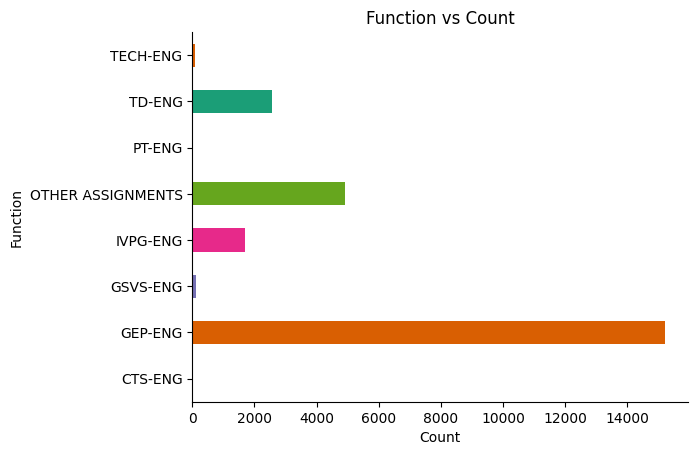

In [130]:
# FUNCTION

from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('FUNCTION').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.title("Function vs Count")
plt.xlabel("Count")
plt.ylabel("Function")

Text(0, 0.5, 'Source of Change')

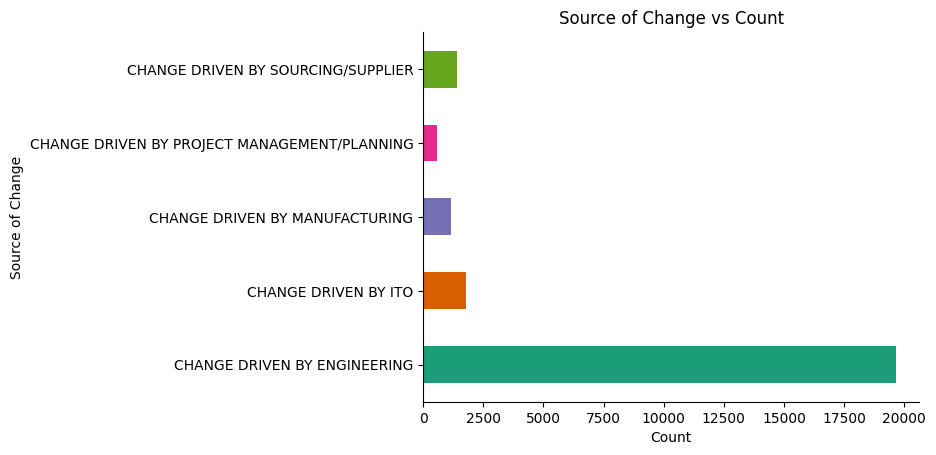

In [131]:
# SOURCE OF CHANGE

from matplotlib import pyplot as plt
import seaborn as sns
df.groupby('SOURCE OF CHANGE').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.title("Source of Change vs Count")
plt.xlabel("Count")
plt.ylabel("Source of Change")

##ECR_CODE
Each ECR_CODE has multiple COSTING_PROJECTS


So, ECR_CODE is grouped along with COSTING_PROJECTS(Job No.)


Now ECR_CODE can be used as PK



In [132]:
def group_cols(df, colA, colB):
    grouped_df = df.groupby(colA)[colB].agg(list).reset_index()
    grouped_df.rename(columns={colB: colB + '_new_col'}, inplace=True)
    df = pd.merge(df, grouped_df, on=colA, how='left')
    df.drop(colB, axis=1, inplace=True)
    return df

In [133]:
df=group_cols(df,'ECR_CODE','COSTING_PROJECTS')

In [134]:
# change type to string
# remove brackets
# drop duplicate so that ECR_CODE can act as PK
df['COSTING_PROJECTS_new_col']=df['COSTING_PROJECTS_new_col'].astype(str)
df['COSTING_PROJECTS_new_col'] = df['COSTING_PROJECTS_new_col'].str.replace(r'[\[\]\']', '', regex=True)


In [135]:
df.drop_duplicates(inplace=True)

In [136]:
df.head(50)

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
2,ECR-356779,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
3,ECR-356638,CHANGE DRIVEN BY ENGINEERING,2019-12-23,TYPO MISTAKE,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570
4,ECR-356423,CHANGE DRIVEN BY ENGINEERING,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,11.5,PSE,5845566
5,ECR-355980,CHANGE DRIVEN BY ENGINEERING,2019-12-18,DESIGN PROGRESS COMPLETION,FFF&P ONLY,UCP/CONTROL SYSTEM,MOVE COMPONENT,Change on code for purchasing,BOM_LCORPHIC0021102/000,PLC OTHER MATERIAL,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,1NG0214
6,ECR-355969,CHANGE DRIVEN BY ENGINEERING,2019-12-18,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,Add fixing holes for moving railway supports i...,SMO0386841/000,RAILWAY ON BASEPLATE MODIFICATION,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,13.5,PSE,5845566
7,ECR-355841,CHANGE DRIVEN BY ENGINEERING,2019-12-18,DESIGN PROGRESS COMPLETION,FFF&P ONLY,VALVES,"DOCUMENT,CHANGE QTY","one valve BV301 is changed from 1"" SW to 2"" fl...",ISPRB0131102/000,BALL VALVES SPECIFICATION,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,"1NG0216, 1NG0214, 1NG0215, 1NG0217, 1NG0218, 1..."
8,ECR-355829,CHANGE DRIVEN BY ENGINEERING,2019-12-18,DESIGN PROGRESS COMPLETION,FFF&P ONLY,UCP/CONTROL SYSTEM,DOCUMENT,CLOSED LOOP RP-595100488_x000D_\n_x000D_\nAfte...,RP-595100488/001,CABLE GLANDS FOR BC700,GEP-ENG,ICE,IEP-GEP-ENG-Electrical Instrumentation & Contr...,13.5,EICE,5845566
9,ECR-355611,CHANGE DRIVEN BY ENGINEERING,2019-12-17,DESIGN PROGRESS COMPLETION,FFF&P ONLY,F2F,DOCUMENT,"Suite à une erreur de serrage, je dois modifie...",CDD134796/000,INTERMEDIATE SPACER-2,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,14.5,LC,"1NG0218, 1NG0219, 1NG0220"


In [137]:
df.shape

(18908, 16)

In [138]:
# Function to sort each cell
def sort_costing_projects(cell):
    # Ensure the cell is a string before processing
    if isinstance(cell, list):
        cell = ', '.join(cell)  # Convert list to string
    # Split, strip whitespace, sort, and rejoin
    sorted_items = sorted(item.strip() for item in cell.split(','))
    return ', '.join(sorted_items)


In [139]:
# Apply the function to each cell in the specified column
df['COSTING_PROJECTS_new_col'] = df['COSTING_PROJECTS_new_col'].apply(sort_costing_projects)



In [140]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1..."
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
2,ECR-356779,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
3,ECR-356638,CHANGE DRIVEN BY ENGINEERING,2019-12-23,TYPO MISTAKE,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570
4,ECR-356423,CHANGE DRIVEN BY ENGINEERING,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,11.5,PSE,5845566


In [141]:
# Top 10 most mentioned string in df[COSTING_PROJECTS_new_col]

from collections import Counter

def top_mentioned_strings(df, column, top_n):

    all_strings = []
    for value in df[column]:
        if isinstance(value, str):  # Check if the value is a string
            strings = value.split(',')
            all_strings.extend(strings)
    string_counts = Counter(all_strings)
    top_strings = string_counts.most_common(top_n)
    return top_strings



In [142]:

top_10_strings = top_mentioned_strings(df, 'COSTING_PROJECTS_new_col', 10)
top_10_strings

[('506094', 187),
 ('1908306', 145),
 ('1NG0257', 123),
 ('1103905', 117),
 ('SCC0248', 116),
 ('1209653', 114),
 ('1PP0107', 101),
 ('1TV0091', 100),
 ('1105328', 99),
 ('5841788', 97)]

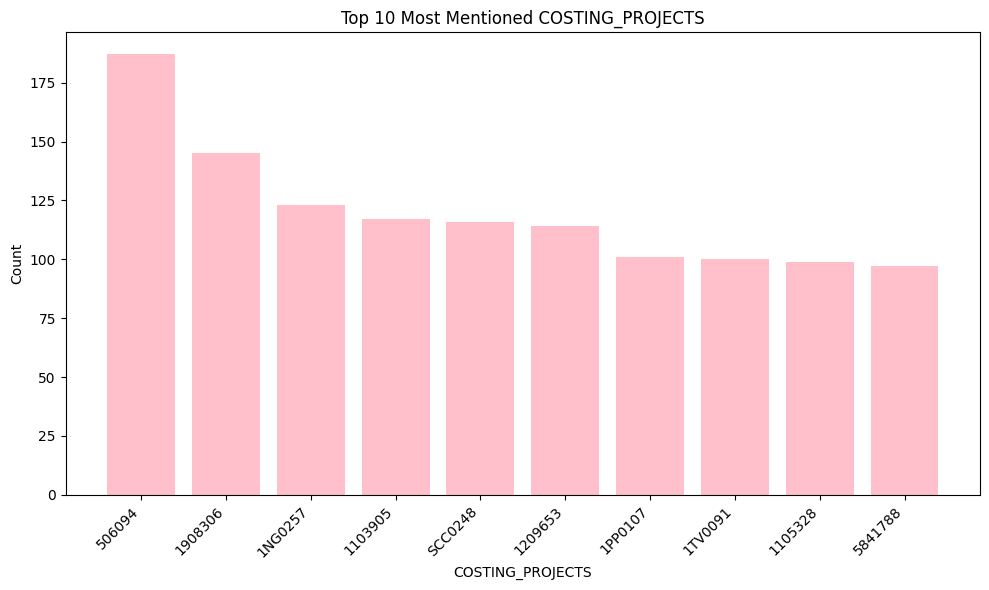

In [143]:
# prompt: plot above top_10_strings

import matplotlib.pyplot as plt

# Assuming top_10_strings is a list of tuples (string, count)
strings, counts = zip(*top_10_strings)

plt.figure(figsize=(10, 6))
plt.bar(strings, counts,color='pink')
plt.xlabel("COSTING_PROJECTS")
plt.ylabel("Count")
plt.title("Top 10 Most Mentioned COSTING_PROJECTS")
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()

##modified df  |  made costing_projects as pk and has been grouped togather

In [17]:
# prompt: if  df[COSTING_PROJECTS_new_col] value is same then merge those rows

def merge_rows_with_same_costing_projects(df):
    # Group by 'COSTING_PROJECTS_new_col' and aggregate other columns
    grouped = df.groupby('COSTING_PROJECTS_new_col').agg({
        'ECR_CODE': lambda x: ','.join(x.astype(str)),  # Combine ECR codes
        'CHANGE DESCRIPTION': lambda x: ','.join(x.astype(str)),
        'IMPACTEDITEM': lambda x: ','.join(x.astype(str)), #Combine IMPACTEDITEM values


    }).reset_index()

    return grouped

df_merged = merge_rows_with_same_costing_projects(df)
df_merged

,COSTING_PROJECTS_new_col,ECR_CODE,CHANGE DESCRIPTION,IMPACTEDITEM
0,1003382,"ECR-398007,ECR-396451,ECR-396149,ECR-394289,EC...",Updated as per comments._x000D_\n1. Removal of...,"SOP6259142/001,BOM_SNO0704249/001,N00406451_10..."
1,"1003382, 1003383, 1003384, 1003385","ECR-390443,ECR-380033","Due to human type error, the BN codes, RJO0582...","BOM_SNO5360970/000,N02606450_1003383/000"
2,1003383,"ECR-396449,ECR-385590,ECR-418617",Flow gauge and filter addition in NP scope und...,"N00406451_1003384/000,N43106450_1003384/007,N0..."
3,"1003383, 1003384, 1003385",ECR-398055,Remove KIT-Hyrocom Driver Dummy and real item ...,N01006450_1003385/015
4,1003384,ECR-418614,Move Compressor assembly BOM N00006450_1003384...,N01606450_1003384/002
5,1003385,ECR-418613,MOve Compressor Assembly BOM N00006450_1003385...,N01706450_1003385/003
6,1003386,"ECR-392197,ECR-387626,ECR-371863,ECR-385309,EC...",Updated according to comment resolution sheet ...,"SOP0223384/001,RT-3009951/000,N65006450_100338..."
7,"1003386, 1003387",ECR-381729,Per entrambi i progetti 1003386 e 1003387:_x00...,N00006450_1003386/002
8,"1003386, 1003387, 1003388, 1003389","ECR-390995,ECR-386633,ECR-376900","Per tutti i progetti 1003386, 1003387, 1003388...","N00406451_1003387/001,N004Z6451_1003387/002,N0..."
9,"1003386, 1003388","ECR-390834,ECR-371581,ECR-380813","Rotor shaft dwg updated by supplier,Per entram...","SOP8621521/000,N65006450_1003386/000,N030BR999..."


In [18]:
df_merged.shape

(2462, 4)

In [19]:
df['ECR_CODE'].value_counts()

,count
ECR_CODE,
ECR-356867,1
ECR-444777,1
ECR-486417,1
ECR-486428,1
ECR-486430,1
ECR-486431,1
ECR-486432,1
ECR-486445,1
ECR-444647,1


In [20]:
# ECR-550831	has 2 values coz IMPACTED ITEM DESCRIPTION	is differently described

In [21]:
'''

Method to find all rows which has more than 2 values in a col


'''

'\n\nMethod to find all rows which has more than 2 values in a col\n\n\n'

In [22]:
# Method to find all rows which has more than 2 values in a col. example [1908315, 1703775]

def find_rows_with_multiple_values(df, colA, value):

    result_df = df[df[colA].str.split(',').str.len() > value]

    return result_df

In [23]:
df_multiple_costingprojects=find_rows_with_multiple_values(df,'COSTING_PROJECTS_new_col',1)

In [24]:
df_multiple_costingprojects.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1..."
7,ECR-355841,CHANGE DRIVEN BY ENGINEERING,2019-12-18,DESIGN PROGRESS COMPLETION,FFF&P ONLY,VALVES,"DOCUMENT,CHANGE QTY","one valve BV301 is changed from 1"" SW to 2"" fl...",ISPRB0131102/000,BALL VALVES SPECIFICATION,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1..."
9,ECR-355611,CHANGE DRIVEN BY ENGINEERING,2019-12-17,DESIGN PROGRESS COMPLETION,FFF&P ONLY,F2F,DOCUMENT,"Suite à une erreur de serrage, je dois modifie...",CDD134796/000,INTERMEDIATE SPACER-2,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,14.5,LC,"1NG0218, 1NG0219, 1NG0220"
10,ECR-355565,CHANGE DRIVEN BY ENGINEERING,2019-12-17,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,ADD COMPONENT,Ajout dummy kit hydraulique pour montage accou...,BOM_LCOCPH900246-005/000,HYDRAULIC DEVICE,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,14.5,LC,"1NG0214, 1NG0218"
12,ECR-355446,CHANGE DRIVEN BY ENGINEERING,2019-12-16,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,p&ID update for HAZOp study,IPLSH0001102/001,PIPING AND INSTRUMENTATION DIAGRAM,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,15.5,LC,"1NG0214, 1NG0218"


In [25]:
#grouping costing_projects to ECR_code



##SOURCE OF CHANGE

has 5 unique values.

So, label encode these

In [144]:
df.head(2)

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
0,ECR-356867,CHANGE DRIVEN BY ENGINEERING,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1..."
1,ECR-356798,CHANGE DRIVEN BY ENGINEERING,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568


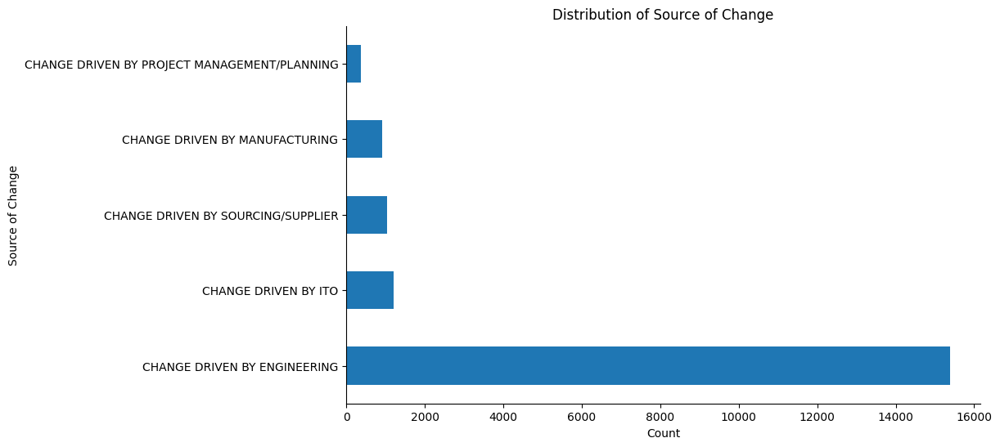

In [145]:
# prompt: plot graph on df['SOURCE OF CHANGE']

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
df['SOURCE OF CHANGE'].value_counts().plot(kind='barh')
plt.ylabel('Source of Change')
plt.xlabel('Count')
plt.title('Distribution of Source of Change')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

In [146]:
df['SOURCE OF CHANGE'].unique()

array(['CHANGE DRIVEN BY ENGINEERING', 'CHANGE DRIVEN BY MANUFACTURING',
       'CHANGE DRIVEN BY SOURCING/SUPPLIER', 'CHANGE DRIVEN BY ITO',
       'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING'], dtype=object)

In [147]:
#label encode these

from sklearn.preprocessing import LabelEncoder

le_source_of_change = LabelEncoder()
df['SOURCE OF CHANGE'] = le_source_of_change.fit_transform(df['SOURCE OF CHANGE'])

le_source_of_change_classes = dict(zip(le_source_of_change.classes_, le_source_of_change.transform(le_source_of_change.classes_)))

le_source_of_change_classes


{'CHANGE DRIVEN BY ENGINEERING': 0,
 'CHANGE DRIVEN BY ITO': 1,
 'CHANGE DRIVEN BY MANUFACTURING': 2,
 'CHANGE DRIVEN BY PROJECT MANAGEMENT/PLANNING': 3,
 'CHANGE DRIVEN BY SOURCING/SUPPLIER': 4}

In [148]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
0,ECR-356867,0,2019-12-30,PREDECESSOR DATA REVISION,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1..."
1,ECR-356798,0,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
2,ECR-356779,0,2019-12-27,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
3,ECR-356638,0,2019-12-23,TYPO MISTAKE,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570
4,ECR-356423,0,2019-12-20,DESIGN PROGRESS COMPLETION,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,11.5,PSE,5845566


##REASON_DESC

has unique values

So, label encode these

In [149]:
df['REASON_DESC'].value_counts()

,count
REASON_DESC,
DESIGN PROGRESS COMPLETION,10208
"DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)",1463
TYPO MISTAKE,1387
MISSING/WRONG SCOPE OF SUPPLY,1206
PREDECESSOR DATA REVISION,999
REQUIREMENTS NOT CAPTURED (MISTAKE),803
REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT,722
MFG IMPROVEMENTS/COST OUT (NO NCR),654
ANY MISTAKES GENERATED BY ENG SUPPLIER,531


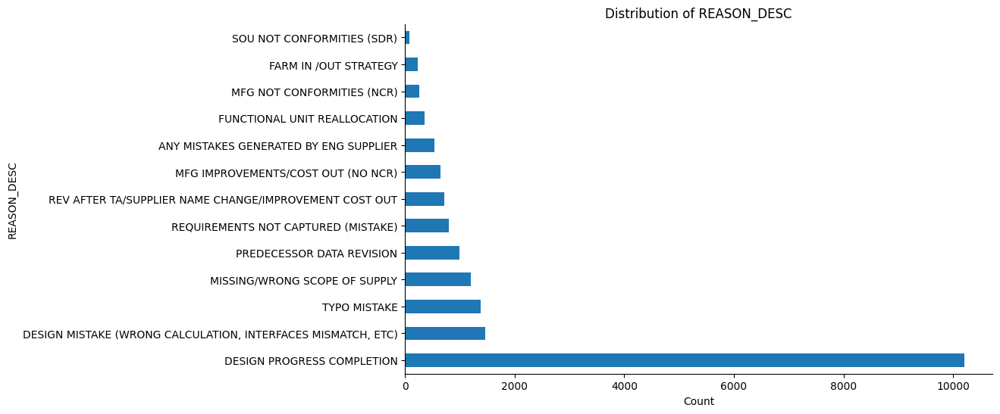

In [150]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
df['REASON_DESC'].value_counts().plot(kind='barh')
plt.ylabel('REASON_DESC')
plt.xlabel('Count')
plt.title('Distribution of REASON_DESC')
plt.gca().spines[['top', 'right']].set_visible(False)
plt.show()

In [151]:
# prompt: group REASON_DESC and MATERIAL_CATEGORY and find top 10 MATERIAL_CATEGORY for each REASON_DESC

# Group by 'REASON_DESC' and 'MATERIAL_CATEGORY', then get the top 10 'MATERIAL_CATEGORY' for each 'REASON_DESC'
top_10_materials_for_reason = df.groupby('REASON_DESC')['MATERIAL_CATEGORY'].value_counts().groupby(level=0).head(5)

top_10_materials_for_reason

REASON_DESC                                                   MATERIAL_CATEGORY                   
ANY MISTAKES GENERATED BY ENG SUPPLIER                        INSTRUMENTATION                          169
                                                              F2F                                      149
                                                              VALVES                                    34
                                                              PIPINGS & SUPPORTS                        24
                                                              BASEPLATE                                 23
DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)  F2F                                      717
                                                              INSTRUMENTATION                          149
                                                              UCP/CONTROL SYSTEM                       124
                                                              PIPINGS & SUPPORTS                        87
                                                              VALVES                                    76
DESIGN PROGRESS COMPLETION                                    F2F                                     4418
                                                              EQUIPMENT/MATERIAL FULL SUPPLY           861
                                                              INSTRUMENTATION                          781
                                                              PIPINGS & SUPPORTS                       605
                                                              VALVES                                   501
FARM IN /OUT STRATEGY                                         UCP/CONTROL SYSTEM                        60
                                                              INSTRUMENTATION                           42
                                                              F2F                                       25
                                                              CONTROL CABINET                           11
                                                              DRY GAS SEAL PANEL/TREATMENT/BOOSTER      11
FUNCTIONAL UNIT REALLOCATION                                  F2F                                       78
                                                              EQUIPMENT/MATERIAL FULL SUPPLY            77
                                                              INSTRUMENTATION                           33
                                                              VALVES                                    26
                                                              UCP/CONTROL SYSTEM                        21
MFG IMPROVEMENTS/COST OUT (NO NCR)                            F2F                                      496
                                                              INSTRUMENTATION                           60
                                                              VALVES                                    31
                                                              EQUIPMENT/MATERIAL FULL SUPPLY            22
                                                              SPECIAL TOOLS                              7
MFG NOT CONFORMITIES (NCR)                                    F2F                                      124
                                                              PIPINGS & SUPPORTS                        36
                                                              INSTRUMENTATION                           24
                                                              VALVES                                    21
                                                              EQUIPMENT/MATERIAL FULL SUPPLY            13
MISSING/WRONG SCOPE OF SUPPLY                                 F2F                                      368
                                                 

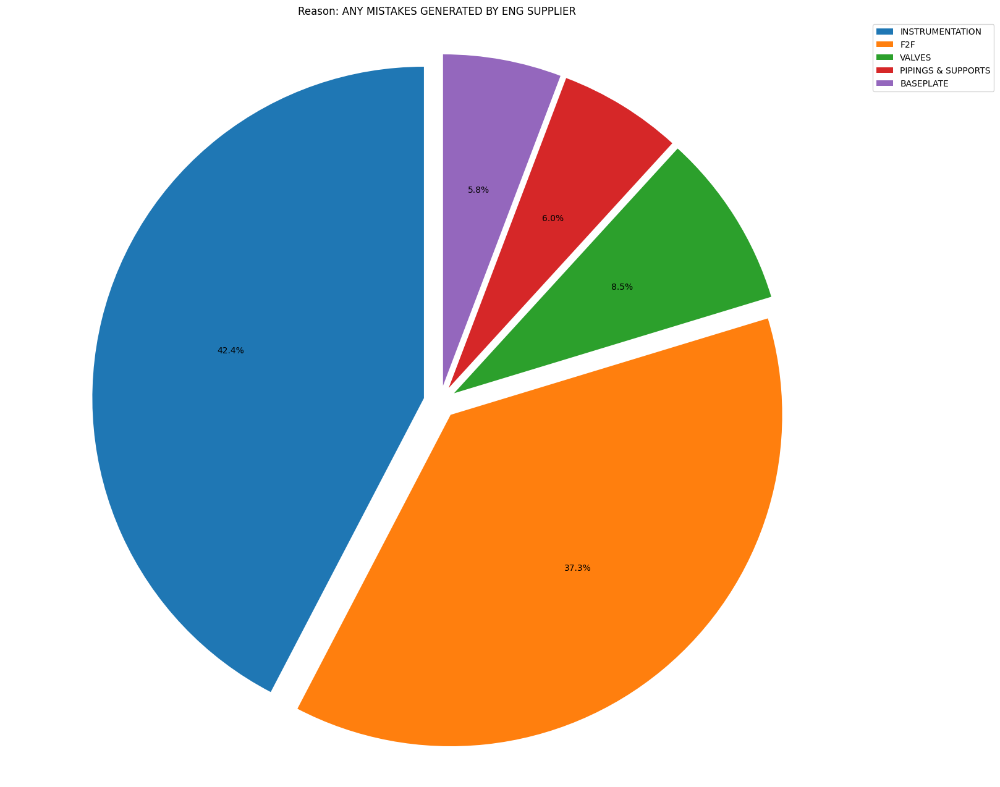

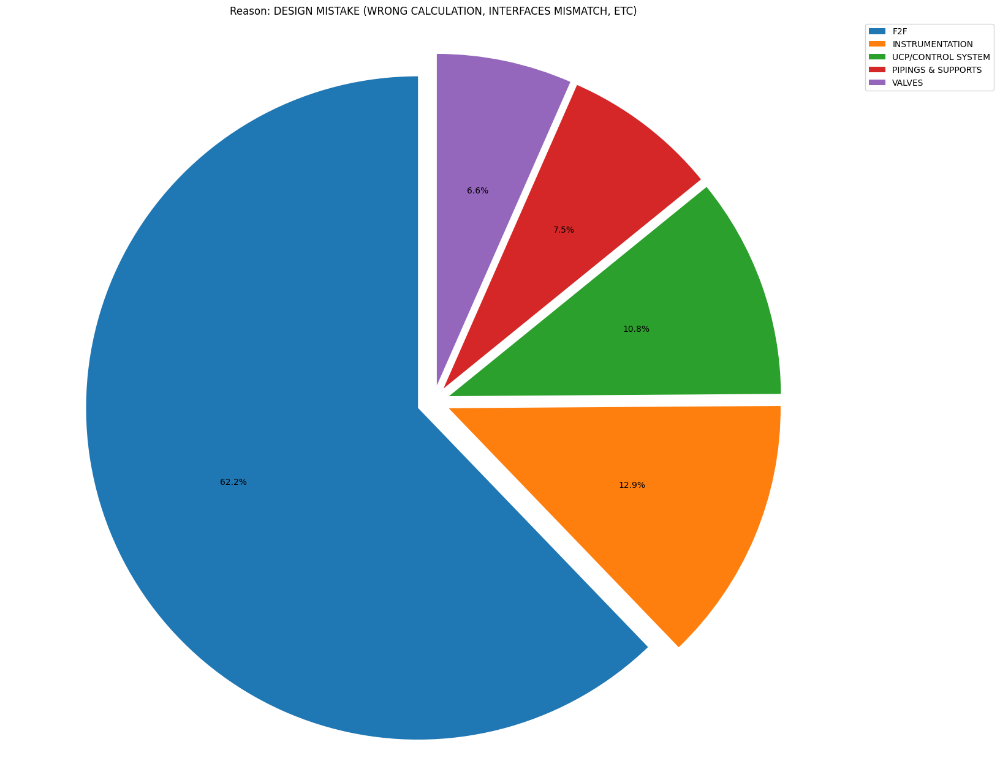

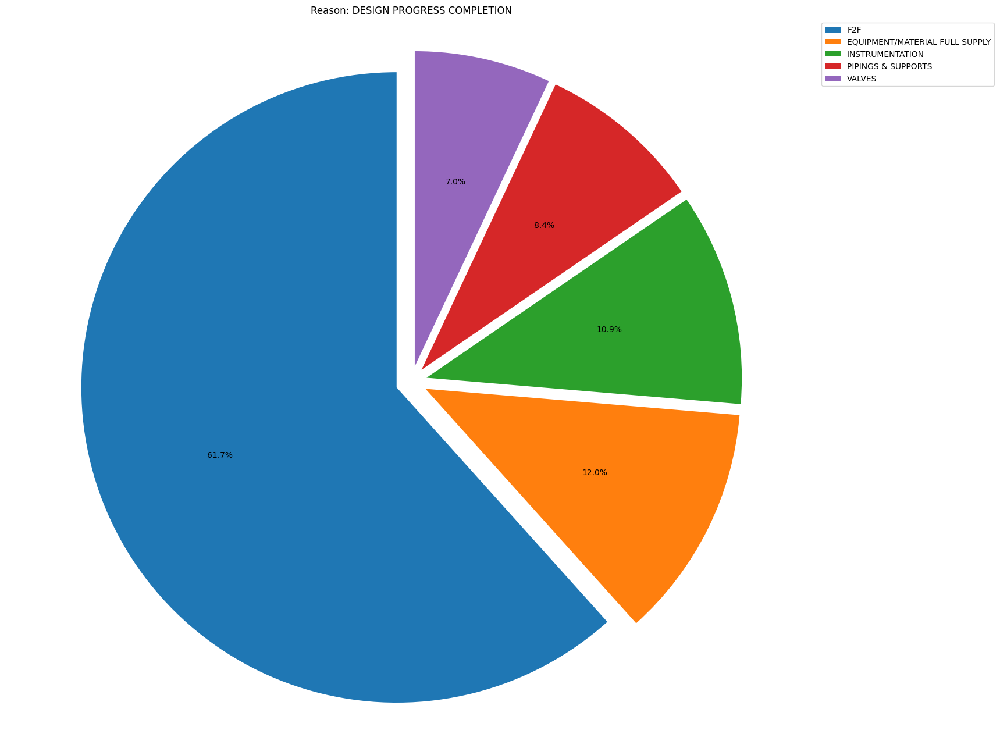

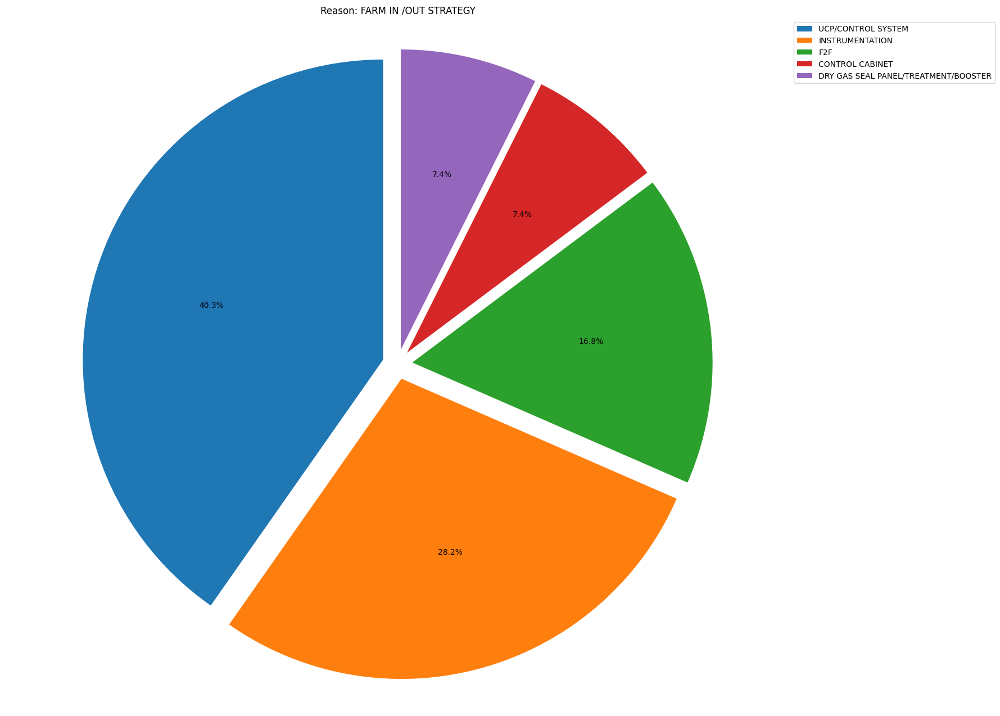

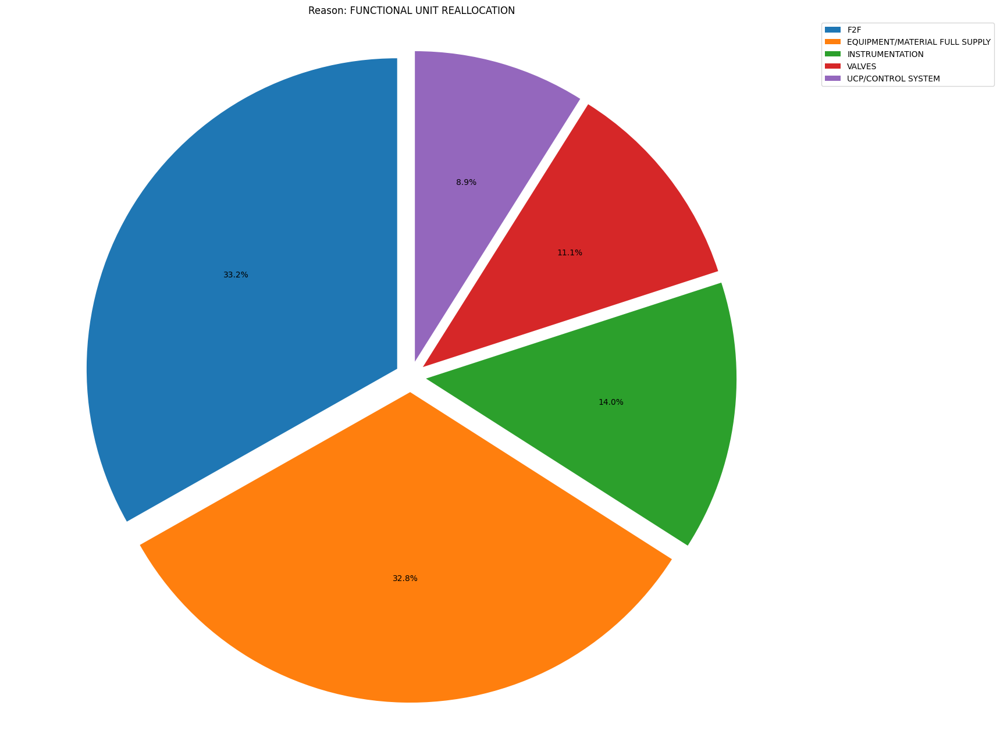

...

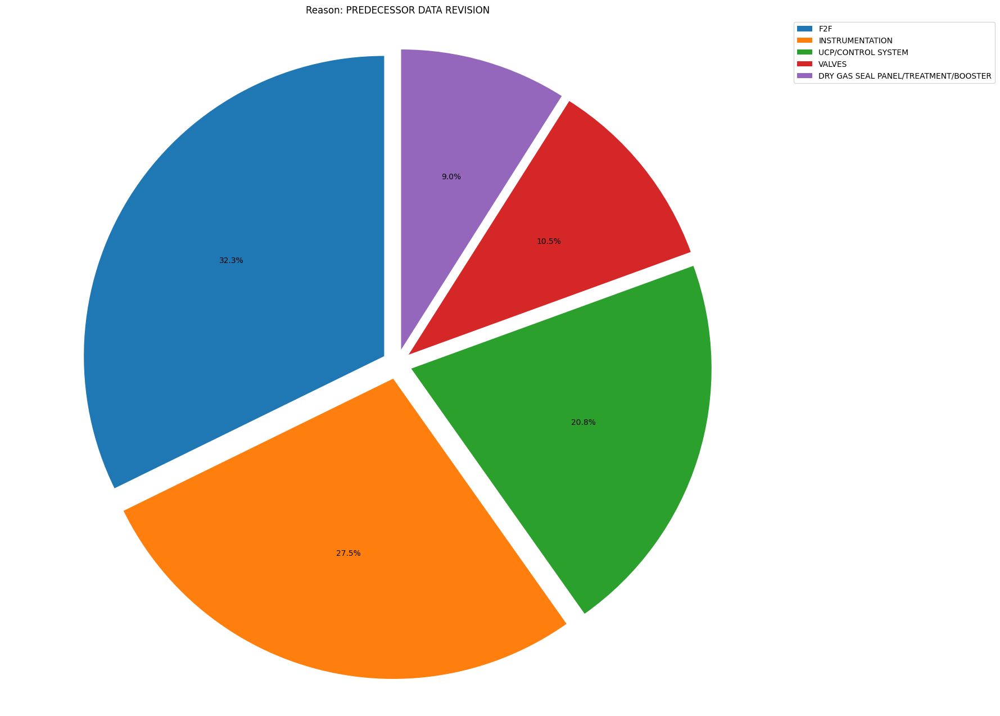

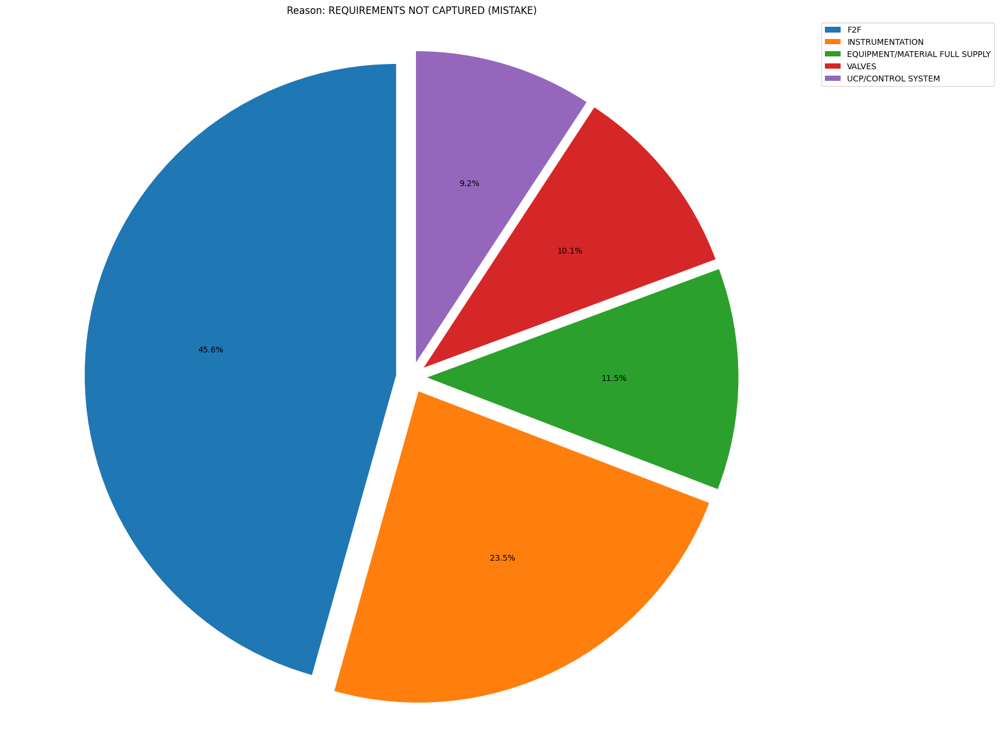

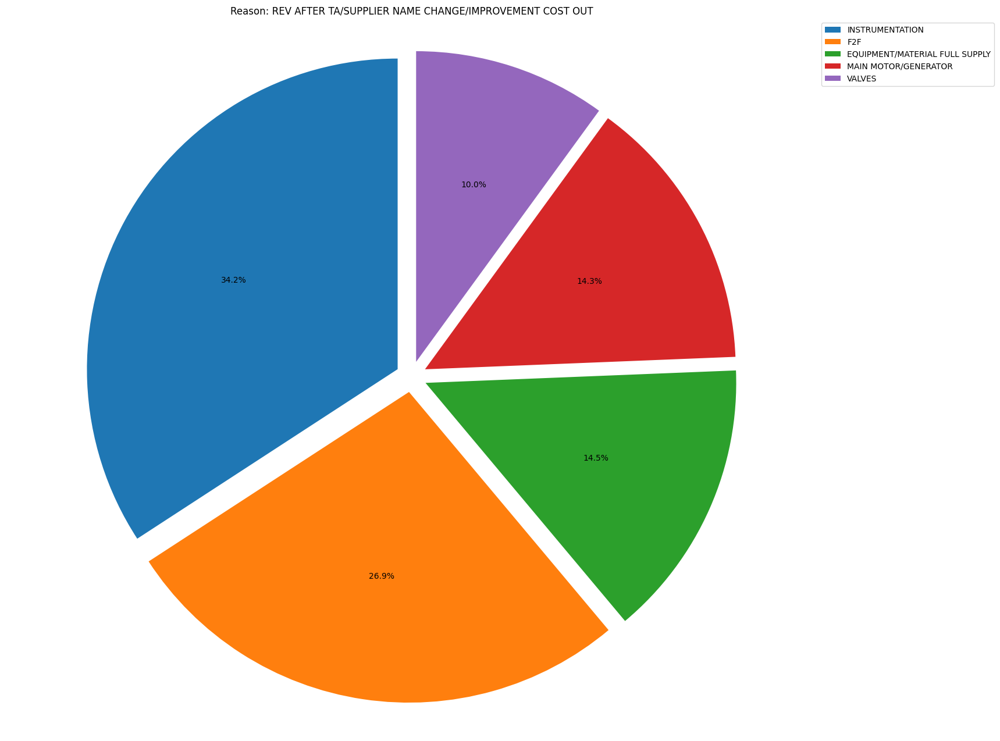

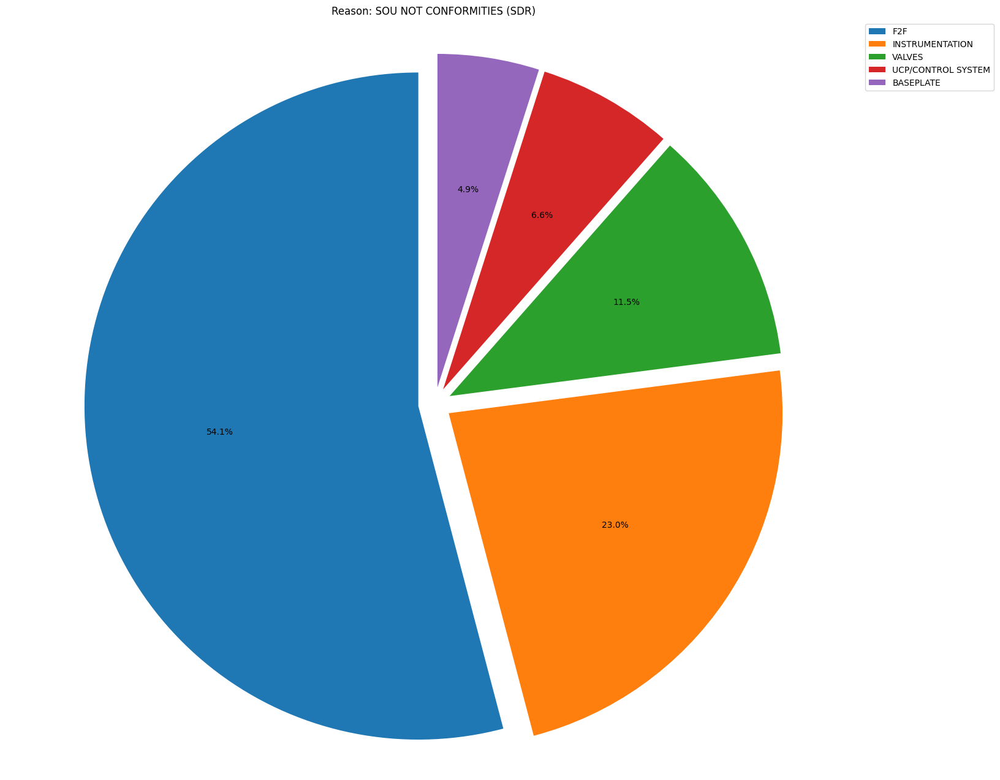

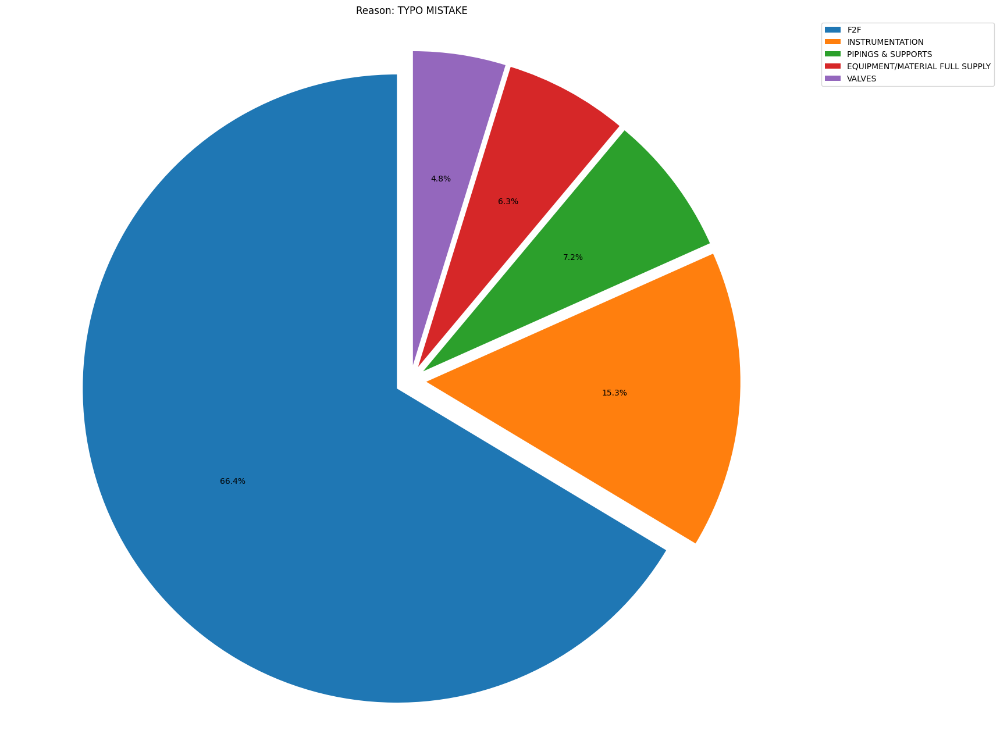

In [152]:


import matplotlib.pyplot as plt

# Assuming top_10_materials_for_reason is already defined as in your provided code
# Iterate through each unique REASON_DESC
for reason in top_10_materials_for_reason.index.get_level_values(0).unique():
    # Get the top 10 materials for the current reason
    reason_data = top_10_materials_for_reason[reason]
    # Create the pie chart
    plt.figure(figsize=(18, 16))  # Adjust figure size as needed
    plt.pie(reason_data, autopct='%1.1f%%', startangle=90, explode=[0.05] * len(reason_data)) #Added autopct for percentage values
    plt.title(f'Reason: {reason}')
    plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
    plt.legend(reason_data.index, loc='upper left', bbox_to_anchor=(1, 1)) #legend only
    plt.show()

In [153]:
df['REASON_DESC'].unique()

array(['PREDECESSOR DATA REVISION', 'DESIGN PROGRESS COMPLETION',
       'TYPO MISTAKE', 'MFG NOT CONFORMITIES (NCR)',
       'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT',
       'MISSING/WRONG SCOPE OF SUPPLY',
       'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)',
       'REQUIREMENTS NOT CAPTURED (MISTAKE)', 'FARM IN /OUT STRATEGY',
       'FUNCTIONAL UNIT REALLOCATION',
       'MFG IMPROVEMENTS/COST OUT (NO NCR)',
       'ANY MISTAKES GENERATED BY ENG SUPPLIER',
       'SOU NOT CONFORMITIES (SDR)'], dtype=object)

In [154]:
le_reason_desc = LabelEncoder()
df['REASON_DESC'] = le_reason_desc.fit_transform(df['REASON_DESC'])

le_reason_desc_classes = dict(zip(le_reason_desc.classes_, le_reason_desc.transform(le_reason_desc.classes_)))

le_reason_desc_classes

{'ANY MISTAKES GENERATED BY ENG SUPPLIER': 0,
 'DESIGN MISTAKE (WRONG CALCULATION, INTERFACES MISMATCH, ETC)': 1,
 'DESIGN PROGRESS COMPLETION': 2,
 'FARM IN /OUT STRATEGY': 3,
 'FUNCTIONAL UNIT REALLOCATION': 4,
 'MFG IMPROVEMENTS/COST OUT (NO NCR)': 5,
 'MFG NOT CONFORMITIES (NCR)': 6,
 'MISSING/WRONG SCOPE OF SUPPLY': 7,
 'PREDECESSOR DATA REVISION': 8,
 'REQUIREMENTS NOT CAPTURED (MISTAKE)': 9,
 'REV AFTER TA/SUPPLIER NAME CHANGE/IMPROVEMENT COST OUT': 10,
 'SOU NOT CONFORMITIES (SDR)': 11,
 'TYPO MISTAKE': 12}

In [155]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
0,ECR-356867,0,2019-12-30,8,FFF&P ONLY,VALVES,ADD COMPONENT,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1..."
1,ECR-356798,0,2019-12-27,2,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
2,ECR-356779,0,2019-12-27,2,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
3,ECR-356638,0,2019-12-23,12,FFF&P ONLY,F2F,MOVE COMPONENT,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570
4,ECR-356423,0,2019-12-20,2,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,11.5,PSE,5845566


##CHANGE_CATEGORY

eventhough it has unique values, its in mixtured form
apply multilabel binarizer

here u can ignore 'DOCUMENT' col as they cause no major impacts

In [156]:
df['CHANGE_CATEGORY'].unique()

array(['ADD COMPONENT', 'DOCUMENT', 'MOVE COMPONENT',
       'DOCUMENT,CHANGE QTY', 'CHANGE QTY',
       'REMOVE COMPONENT,ADD COMPONENT', 'CHANGE QTY,MOVE COMPONENT',
       'REMOVE COMPONENT', 'ADD COMPONENT,DOCUMENT',
       'ADD COMPONENT,CHANGE QTY,REMOVE COMPONENT',
       'MOVE COMPONENT,ADD COMPONENT,REMOVE COMPONENT',
       'CHANGE QTY,ADD COMPONENT', 'ADD COMPONENT,REMOVE COMPONENT',
       'DOCUMENT,ADD COMPONENT', 'DOCUMENT,CHANGE QTY,ADD COMPONENT',
       'DOCUMENT,ADD COMPONENT,REMOVE COMPONENT',
       'REMOVE COMPONENT,MOVE COMPONENT', 'ADD COMPONENT,CHANGE QTY',
       'REMOVE COMPONENT,ADD COMPONENT,DOCUMENT',
       'ADD COMPONENT,MOVE COMPONENT', 'MOVE COMPONENT,DOCUMENT', nan,
       'MOVE COMPONENT,ADD COMPONENT', 'CHANGE QTY,DOCUMENT',
       'DOCUMENT,REMOVE COMPONENT,ADD COMPONENT',
       'CHANGE QTY,DOCUMENT,MOVE COMPONENT',
       'CHANGE QTY,REMOVE COMPONENT', 'MOVE COMPONENT,REMOVE COMPONENT',
       'ADD COMPONENT,MOVE COMPONENT,REMOVE COMPONENT',
     

In [157]:
#seperate if df['CHANGE_CATEGORY']=='DOCUMENT'

In [158]:
df_document=df[df['CHANGE_CATEGORY']=='DOCUMENT']






df=df[df['CHANGE_CATEGORY']!='DOCUMENT']

In [159]:
df_document.head()     #will have only documents

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col
1,ECR-356798,0,2019-12-27,2,FFF&P ONLY,OTHER,DOCUMENT,"Equipments ref. points 6.6.1, 6.6.2 and 6.6.3 ...",SOM6826034/000,WATER MIST FIRE FIGHTING SYSTEM FOR PGT25 DLE ...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
2,ECR-356779,0,2019-12-27,2,FFF&P ONLY,OTHER,DOCUMENT,The following modifications shall be applied i...,SMO0953152/000,DISMANTLING SYSTEM FOR PGT25 DLE GAS TURBINE S...,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,4.5,PSE,5845568
4,ECR-356423,0,2019-12-20,2,FFF&P ONLY,OTHER,DOCUMENT,Add holes for installation of supports in orde...,SM-8910506/000,RAIL,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,11.5,PSE,5845566
6,ECR-355969,0,2019-12-18,2,FFF&P ONLY,OTHER,DOCUMENT,Add fixing holes for moving railway supports i...,SMO0386841/000,RAILWAY ON BASEPLATE MODIFICATION,GEP-ENG,UPG,IEP-GEP-ENG-Packages & Systems UPG,13.5,PSE,5845566
8,ECR-355829,0,2019-12-18,2,FFF&P ONLY,UCP/CONTROL SYSTEM,DOCUMENT,CLOSED LOOP RP-595100488_x000D_\n_x000D_\nAfte...,RP-595100488/001,CABLE GLANDS FOR BC700,GEP-ENG,ICE,IEP-GEP-ENG-Electrical Instrumentation & Contr...,13.5,EICE,5845566


In [160]:
#multilabel binarizer for CHANGE_CATEGORY col


from sklearn.preprocessing import MultiLabelBinarizer
df['CHANGE_CATEGORY']=df['CHANGE_CATEGORY'].astype(str)
df['CHANGE_CATEGORY'] = df['CHANGE_CATEGORY'].apply(lambda x: x.split(','))


mlb = MultiLabelBinarizer()
change_category_encoded = pd.DataFrame(mlb.fit_transform(df['CHANGE_CATEGORY']),
                                       columns=mlb.classes_,
                                       index=df.index)

# Concatenate the original data with the encoded columns
df = pd.concat([df, change_category_encoded], axis=1)

# Drop the original 'CHANGE_CATEGORY' column if no longer needed
df.drop(columns=['CHANGE_CATEGORY'], inplace=True)

In [161]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col,ADD COMPONENT,CHANGE QTY,COSTOUT/SMI,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),PCB CATEGORY,REMOVE COMPONENT,nan
0,ECR-356867,0,2019-12-30,8,FFF&P ONLY,VALVES,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1...",1,0,0,0,0,0,0,0,0
3,ECR-356638,0,2019-12-23,12,FFF&P ONLY,F2F,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570,0,0,0,0,1,0,0,0,0
5,ECR-355980,0,2019-12-18,2,FFF&P ONLY,UCP/CONTROL SYSTEM,Change on code for purchasing,BOM_LCORPHIC0021102/000,PLC OTHER MATERIAL,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,1NG0214,0,0,0,0,1,0,0,0,0
7,ECR-355841,0,2019-12-18,2,FFF&P ONLY,VALVES,"one valve BV301 is changed from 1"" SW to 2"" fl...",ISPRB0131102/000,BALL VALVES SPECIFICATION,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1...",0,1,0,1,0,0,0,0,0
10,ECR-355565,0,2019-12-17,2,FFF&P ONLY,OTHER,Ajout dummy kit hydraulique pour montage accou...,BOM_LCOCPH900246-005/000,HYDRAULIC DEVICE,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,14.5,LC,"1NG0214, 1NG0218",1,0,0,0,0,0,0,0,0


In [162]:
df.tail()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col,ADD COMPONENT,CHANGE QTY,COSTOUT/SMI,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),PCB CATEGORY,REMOVE COMPONENT,nan
24255,ECR-540560,0,2023-09-20,2,CIS/CIS+FFF&P,"COUPLING,GEARBOX",1. Please undo the BOM substitution of the BOM...,L000DT999_1918319/000,SPARE - CAPITAL SPARES,GEP-ENG,SYS-SLI,IEP-GEP-ENG-Compression and Radial Expanders S...,102.04,CREE,1908319,1,0,0,0,0,0,0,0,0
24476,ECR-547546,0,2023-10-24,1,FFF&P ONLY,F2F,Complément à l'ECR-547411 pour remplacer le su...,BOM_LCOCPH300678-001/001,PIECES DIVERSES,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,68.04,LC,"1PP0115, 1PP0116, 1PP0117",1,0,0,0,0,0,0,1,0
24485,ECR-547411,0,2023-10-24,1,FFF&P ONLY,F2F,"Sous BOM_LCOCDD301201 ENSEMBLE PALIERS, la BOM...",BOM_LCOCDD301201/003,BEARINGS ASSEMBLY / ENSEMBLE PALIERS,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,68.04,LC,"1PP0115, 1PP0116, 1PP0117",1,1,0,0,0,0,0,1,0
24598,ECR-498016,0,2022-12-29,2,FFF&P ONLY,EQUIPMENT/MATERIAL FULL SUPPLY,BOM position to be added because NUT was mista...,BOM_SKO1501139/000,ASSEMBLY AND LOCKING DRAWING FOR GEARBOX,TECH-ENG,TTL,IEP-TECH-ENG-Innovation Engineering TTL,367.00,IE,1105348,1,0,0,0,0,0,0,0,0
24599,ECR-497796,0,2022-12-28,0,FFF&P ONLY,UCP/CONTROL SYSTEM,This ECR is impacted by ECR-492079. Change is ...,SOM6925186/003,UCP RIO HSP I/O LIST,GEP-ENG,CORE,IEP-GEP-ENG-Project Engineering Office CORE,368.00,PEO,1703762,1,0,0,0,0,0,0,0,0


In [163]:
#find no. of ADD COMPONENTS, CHANGE QTY, etc

In [164]:
print("ADD COMPONENT -> ", len(df[df['ADD COMPONENT']==1]))

print("CHANGE QTY -> ", len(df[df['CHANGE QTY']==1]))

print("COSTOUT/SMI -> ", len(df[df['COSTOUT/SMI']==1]))

print("DOCUMENT -> ", len(df[df['DOCUMENT']==1]))

print("MOVE COMPONENT -> ", len(df[df['MOVE COMPONENT']==1]))

print("NEW PRODUCT DEVELOPMENT (NPD) -> ", len(df[df['NEW PRODUCT DEVELOPMENT (NPD)']==1]))

print("PCB CATEGORY -> ", len(df[df['PCB CATEGORY']==1]))

print("REMOVE COMPONENT -> ", len(df[df['REMOVE COMPONENT']==1]))





ADD COMPONENT ->  6567
CHANGE QTY ->  1121
COSTOUT/SMI ->  22
DOCUMENT ->  664
MOVE COMPONENT ->  932
NEW PRODUCT DEVELOPMENT (NPD) ->  82
PCB CATEGORY ->  68
REMOVE COMPONENT ->  2744


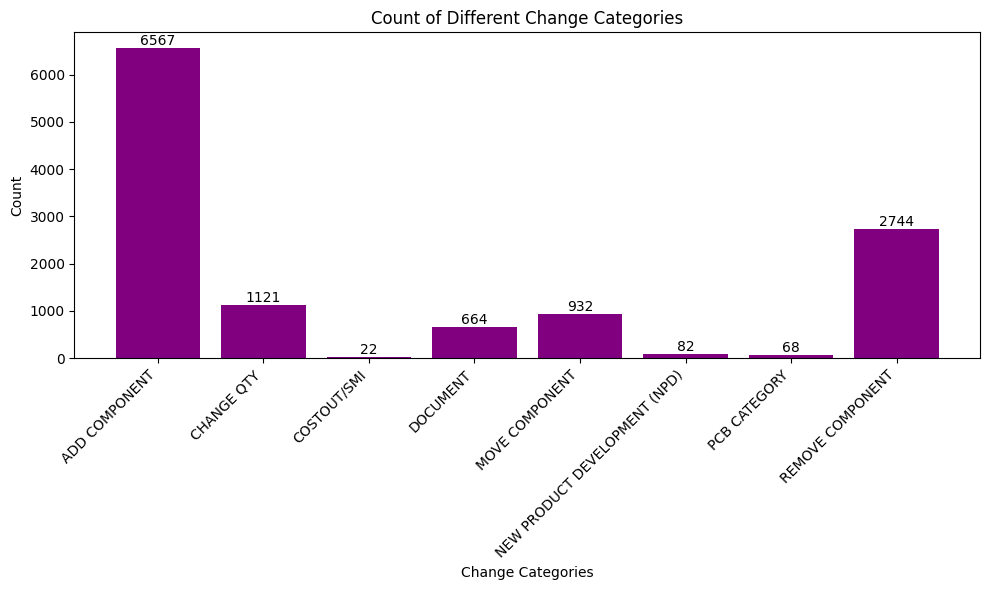

In [165]:

import matplotlib.pyplot as plt

# Data for the bar chart (replace with your actual data)
categories = ['ADD COMPONENT', 'CHANGE QTY', 'COSTOUT/SMI', 'DOCUMENT', 'MOVE COMPONENT', 'NEW PRODUCT DEVELOPMENT (NPD)', 'PCB CATEGORY', 'REMOVE COMPONENT']
counts = [len(df[df['ADD COMPONENT']==1]), len(df[df['CHANGE QTY']==1]), len(df[df['COSTOUT/SMI']==1]), len(df[df['DOCUMENT']==1]), len(df[df['MOVE COMPONENT']==1]), len(df[df['NEW PRODUCT DEVELOPMENT (NPD)']==1]), len(df[df['PCB CATEGORY']==1]), len(df[df['REMOVE COMPONENT']==1])]

# Create the bar chart
plt.figure(figsize=(10, 6))
bars = plt.bar(categories, counts, color='purple')
plt.xlabel("Change Categories")
plt.ylabel("Count")
plt.title("Count of Different Change Categories")
plt.xticks(rotation=45, ha='right')

# Add value labels on top of each bar
for bar, count in zip(bars, counts):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

##MATERIAL_CATEGORY

has unique values

So, label encode these

In [166]:
# prompt: for each of df[COSTING_PROJECTS] find top MATERIAL_CATEGORY value

def get_top_material_category(df):


    # Group by 'COSTING_PROJECTS' and get the mode of 'MATERIAL_CATEGORY'
    top_material_categories = df.groupby('COSTING_PROJECTS_new_col')['MATERIAL_CATEGORY'].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else 'Unknown').reset_index()
    return top_material_categories


# Example usage (assuming your DataFrame is named 'df'):
top_categories_df = get_top_material_category(df)

top_categories_df

,COSTING_PROJECTS_new_col,MATERIAL_CATEGORY
0,1003382,F2F
1,"1003382, 1003383, 1003384, 1003385",INSTRUMENTATION
2,1003383,F2F
3,"1003383, 1003384, 1003385",OTHER
4,1003384,F2F
5,1003385,F2F
6,1003386,F2F
7,"1003386, 1003387",OTHER
8,"1003386, 1003387, 1003388, 1003389",F2F
9,"1003386, 1003388",EQUIPMENT/MATERIAL FULL SUPPLY


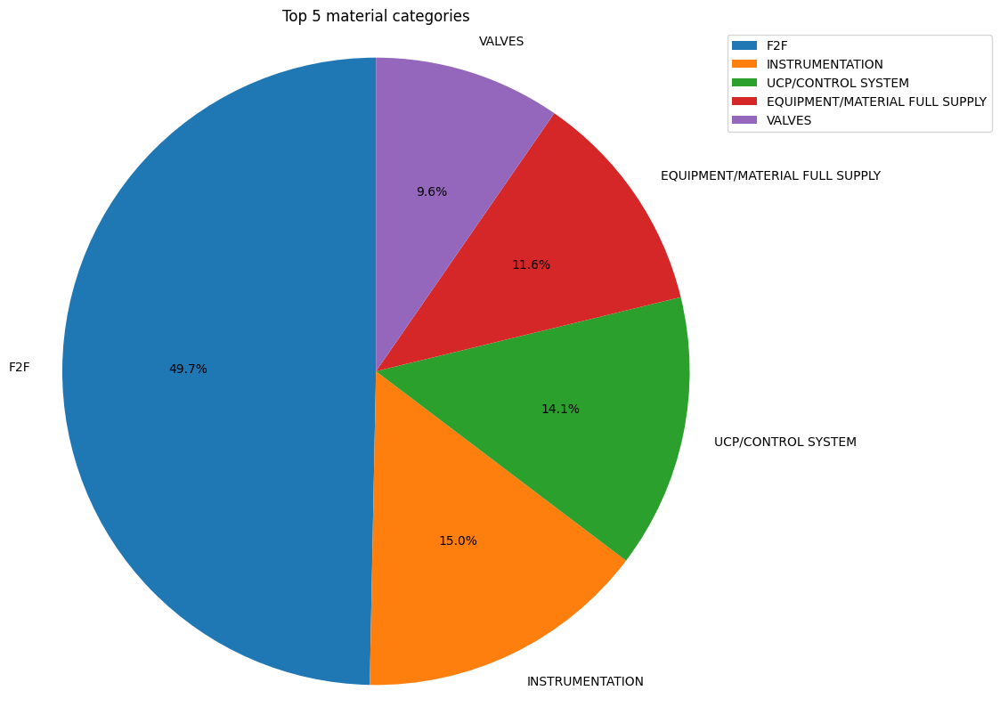

In [167]:
# prompt: plot pie graph for top 10 MATERIAL_CATEGORY for above top_categories_d

import matplotlib.pyplot as plt

# Assuming 'top_categories_df' is already defined as in your provided code.
top_10_materials = top_categories_df['MATERIAL_CATEGORY'].value_counts().nlargest(5)

plt.figure(figsize=(10, 10))
plt.pie(top_10_materials, labels=top_10_materials.index, autopct='%1.1f%%', startangle=90)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Top 5 material categories")
plt.show()

In [168]:
# prompt: top 5 MATERIAL_CATEGORY values

# Assuming df is your DataFrame as defined in the provided code.
top_5_materials = df['MATERIAL_CATEGORY'].value_counts().nlargest(5)
top_5_materials

,count
MATERIAL_CATEGORY,
F2F,3329
INSTRUMENTATION,1248
UCP/CONTROL SYSTEM,976
VALVES,627
EQUIPMENT/MATERIAL FULL SUPPLY,546


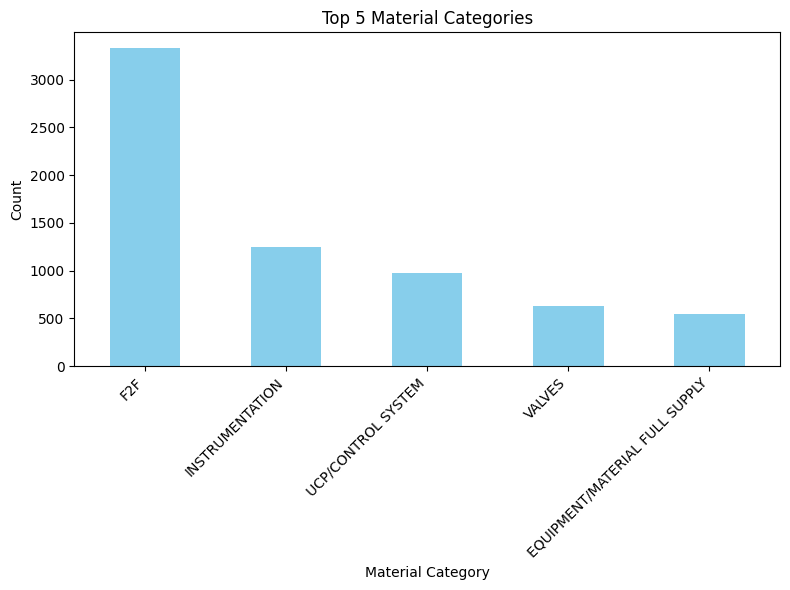

In [169]:
# prompt: plot graph for top_5_materials

import matplotlib.pyplot as plt

# Assuming top_5_materials is already defined as in your provided code.
plt.figure(figsize=(8, 6))
top_5_materials.plot(kind='bar', color='skyblue')
plt.title('Top 5 Material Categories')
plt.xlabel('Material Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [170]:
df['MATERIAL_CATEGORY'].value_counts()

,count
MATERIAL_CATEGORY,
F2F,3329
INSTRUMENTATION,1248
UCP/CONTROL SYSTEM,976
VALVES,627
EQUIPMENT/MATERIAL FULL SUPPLY,546
PIPINGS & SUPPORTS,317
SPARE PARTS,295
DRY GAS SEAL PANEL/TREATMENT/BOOSTER,176
SPECIAL TOOLS,152


In [171]:
#try doing multilabel binarizer or


#multilabel binarizer for MATERIAL_CATEGORY col


from sklearn.preprocessing import MultiLabelBinarizer
df['MATERIAL_CATEGORY']=df['MATERIAL_CATEGORY'].astype(str)
df['MATERIAL_CATEGORY'] = df['MATERIAL_CATEGORY'].apply(lambda x: x.split(','))


mlb = MultiLabelBinarizer()
material_category_encoded = pd.DataFrame(mlb.fit_transform(df['MATERIAL_CATEGORY']),
                                       columns=mlb.classes_,
                                       index=df.index)

# Concatenate the original data with the encoded columns
df = pd.concat([df, material_category_encoded], axis=1)




'''
#label encoder
le_material_category = LabelEncoder()
df['MATERIAL_CATEGORY'] = le_material_category.fit_transform(df['MATERIAL_CATEGORY'])

le_material_category_classes = dict(zip(le_material_category.classes_, le_material_category.transform(le_material_category.classes_)))

le_material_category_classes
'''

"\n#label encoder\nle_material_category = LabelEncoder()\ndf['MATERIAL_CATEGORY'] = le_material_category.fit_transform(df['MATERIAL_CATEGORY'])\n\nle_material_category_classes = dict(zip(le_material_category.classes_, le_material_category.transform(le_material_category.classes_)))\n\nle_material_category_classes\n"

In [172]:
df.head(20)

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col,ADD COMPONENT,CHANGE QTY,COSTOUT/SMI,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),PCB CATEGORY,REMOVE COMPONENT,nan,AUXILIARY BASEPLATE,BASEPLATE,CABLES,CONTROL CABINET,COUPLING,COUPLING GUARD,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,DUCTS,ENCLOSURE,EQUIPMENT/MATERIAL FULL SUPPLY,F2F,FILTER HOUSE,GEARBOX,INSTRUMENTATION,INTERCONNECTING PIPING AND SUPPORTS,LOW VOLTAGE MOTOR,LUBE OIL CONSOLE,MAIN MOTOR/GENERATOR,MCC,OTHER,PIPINGS & SUPPORTS,PUMP FOR AUXILIARIES,SHAFT LINE,SPARE PARTS,SPECIAL TOOLS,STEEL STRUCTURES,UCP/CONTROL SYSTEM,VALVES,nan
0,ECR-356867,0,2019-12-30,8,FFF&P ONLY,[VALVES],"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1...",1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,ECR-356638,0,2019-12-23,12,FFF&P ONLY,[F2F],Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,ECR-355980,0,2019-12-18,2,FFF&P ONLY,[UCP/CONTROL SYSTEM],Change on code for purchasing,BOM_LCORPHIC0021102/000,PLC OTHER MATERIAL,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,1NG0214,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
7,ECR-355841,0,2019-12-18,2,FFF&P ONLY,[VALVES],"one valve BV301 is changed from 1"" SW to 2"" fl...",ISPRB0131102/000,BALL VALVES SPECIFICATION,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1...",0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
10,ECR-355565,0,2019-12-17,2,FFF&P ONLY,[OTHER],Ajout dummy kit hydraulique pour montage accou...,BOM_LCOCPH900246-005/000,HYDRAULIC DEVICE,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,14.5,LC,"1NG0214, 1NG0218",1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
11,ECR-355504,0,2019-12-16,2,FFF&P ONLY,[OTHER],"To be revised to include MCT frames, cable gla...",SOM6824106/002,TURBOGROUP GENERAL ARRANGEMENT,GEP-ENG,ESE,IEP-GEP-ENG-Electrical Instrumentation & Contr...,15.5,EICE,5845566,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
16,ECR-355090,0,2019-12-12,2,CIS/CIS+FFF&P,[UCP/CONTROL SYSTEM],Closed loop 201928208_x000D_\nIt is necessary ...,M660Z8002_5845566/015,BOP - BALANCE OF PLANT (NON COA12),GEP-ENG,ICE,IEP-GEP-ENG-Electrical Instrumentation & Contr...,19.5,EICE,5845566,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
18,ECR-354983,0,2019-12-12,2,FFF&P ONLY,[F2F],ajout cale DGS en spare RTS,BOM_LCOCPH401259-109/000,WORKSHOP RTS SPARE PARTS FOR BCL404,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,19.5,LC,"1NG0218, 1NG0219, 1NG0220",1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
20,ECR-354388,0,2019-12-09,2,FFF&P ONLY,[F2F],Cambio Codici :_x000D_\n_x000D_\nda SMO0622649...,BOM_SMO0127569/000,LT12 - HP CASING VERTICAL ALIGNMENT,GEP-ENG,PSO,IEP-GEP-ENG-Turbine & Axial Expanders PSO,22.5,TAEE,6742920,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21,ECR-354309,0,2019-12-09,2,FFF&P ONLY,[F2F],Mise a jour du lot de pieces diverses pour ens...,BOM_LCOCPH200795-310/001,MISCELLANEOUS CASING MATERIAL _ BCL404,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,22.5,LC,"1NG0218, 1NG0219, 1NG0220",0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [175]:
print("AUXILIARY BASEPLATE -> ", len(df[df['AUXILIARY BASEPLATE']==1]))

print("BASEPLATE -> ", len(df[df['BASEPLATE']==1]))

print("CABLES -> ", len(df[df['CABLES']==1]))

print("CONTROL CABINET -> ", len(df[df['CONTROL CABINET']==1]))

print("COUPLING -> ", len(df[df['COUPLING']==1]))

print("COUPLING GUARD -> ", len(df[df['COUPLING GUARD']==1]))

print("DRY GAS SEAL PANEL/TREATMENT/BOOSTER -> ", len(df[df['DRY GAS SEAL PANEL/TREATMENT/BOOSTER']==1]))

print("DUCTS -> ", len(df[df['DUCTS']==1]))

print("ENCLOSURE -> ", len(df[df['ENCLOSURE']==1]))

print("EQUIPMENT/MATERIAL FULL SUPPLY -> ", len(df[df['EQUIPMENT/MATERIAL FULL SUPPLY']==1]))



print("F2F -> ", len(df[df['F2F']==1]))

print("FILTER HOUSE -> ", len(df[df['FILTER HOUSE']==1]))

print("GEARBOX -> ", len(df[df['GEARBOX']==1]))

#print("GEARBOX RAW -> ", len(df[df['GEARBOX RAW']==1]))

print("INSTRUMENTATION -> ", len(df[df['INSTRUMENTATION']==1]))

print("INTERCONNECTING PIPING AND SUPPORTS -> ", len(df[df['INTERCONNECTING PIPING AND SUPPORTS']==1]))

print("LOW VOLTAGE MOTOR -> ", len(df[df['LOW VOLTAGE MOTOR']==1]))

print("LUBE OIL CONSOLE -> ", len(df[df['LUBE OIL CONSOLE']==1]))

print("MAIN MOTOR/GENERATOR -> ", len(df[df['MAIN MOTOR/GENERATOR']==1]))

print("MCC -> ", len(df[df['MCC']==1]))



print("OTHER -> ", len(df[df['OTHER']==1]))

print("PIPINGS & SUPPORTS -> ", len(df[df['PIPINGS & SUPPORTS']==1]))

print("PUMP FOR AUXILIARIES -> ", len(df[df['PUMP FOR AUXILIARIES']==1]))

print("SHAFT LINE-> ", len(df[df['SHAFT LINE']==1]))

print("SPARE PARTS -> ", len(df[df['SPARE PARTS']==1]))

print("SPECIAL TOOLS -> ", len(df[df['SPECIAL TOOLS']==1]))

print("STEEL STRUCTURES -> ", len(df[df['STEEL STRUCTURES']==1]))

print("UCP/CONTROL SYSTEM -> ", len(df[df['UCP/CONTROL SYSTEM']==1]))

print("VALVES -> ", len(df[df['VALVES']==1]))

print("MCC -> ", len(df[df['MCC']==1]))


AUXILIARY BASEPLATE ->  34
BASEPLATE ->  164
CABLES ->  85
CONTROL CABINET ->  131
COUPLING ->  82
COUPLING GUARD ->  100
DRY GAS SEAL PANEL/TREATMENT/BOOSTER ->  209
DUCTS ->  56
ENCLOSURE ->  36
EQUIPMENT/MATERIAL FULL SUPPLY ->  588
F2F ->  3363
FILTER HOUSE ->  38
GEARBOX ->  95
INSTRUMENTATION ->  1318
INTERCONNECTING PIPING AND SUPPORTS ->  61
LOW VOLTAGE MOTOR ->  24
LUBE OIL CONSOLE ->  142
MAIN MOTOR/GENERATOR ->  93
MCC ->  22
OTHER ->  156
PIPINGS & SUPPORTS ->  377
PUMP FOR AUXILIARIES ->  36
SHAFT LINE->  17
SPARE PARTS ->  322
SPECIAL TOOLS ->  163
STEEL STRUCTURES ->  58
UCP/CONTROL SYSTEM ->  999
VALVES ->  701
MCC ->  22


In [176]:
# prompt: create a method which takes in ('COSTING_PROJECTS_new_col') value,  ('ADD COMPONENT' ==1) value and return all material category in a print statement

def get_material_categories(costing_projects_value, add_component_value):
    """
    This method takes in 'COSTING_PROJECTS_new_col' value and 'ADD COMPONENT' value
    and returns all material categories associated with the given criteria.
    """

    # Filter the DataFrame based on the provided criteria
    filtered_df = df[(df['COSTING_PROJECTS_new_col'] == costing_projects_value) & (df['ADD COMPONENT'] == add_component_value)]

    # Extract the material categories from the filtered data
    material_categories = filtered_df['MATERIAL_CATEGORY'].unique()

    # Print the material categories
    if material_categories.size > 0:
      print("Material Categories:", material_categories)
    else:
      print("No material categories found for given criteria")


In [178]:
get_material_categories("315503","1")

No material categories found for given criteria


In [191]:
# prompt: (df['COSTING_PROJECTS_new_col']=="315503") and only df['ADD COMPONENT']==1)]

def get_material_categories(costing_projects_value, col):
    """
    This method takes in 'COSTING_PROJECTS_new_col' value and 'ADD COMPONENT' value
    and returns all material categories associated with the given criteria.
    """

    # Filter the DataFrame based on the provided criteria
    filtered_df = df[(df['COSTING_PROJECTS_new_col'] == costing_projects_value) & (df[col] == 1)]

    # Extract the material categories from the filtered data
    material_categories = filtered_df['MATERIAL_CATEGORY'].apply(tuple).unique()

    # Print the material categories
    if material_categories.size > 0:
      print("Material Categories:", material_categories)
    else:
      print("No material categories found for given criteria")

get_material_categories("315529", 'REMOVE COMPONENT')

Material Categories: [('F2F',) ('MAIN MOTOR/GENERATOR',) ('VALVES',) ('LOW VOLTAGE MOTOR',)
 ('UCP/CONTROL SYSTEM',)]


In [197]:
#  enter a JobNo. and a col (add component, remove, anything)  based on this it will tell which Material category is affected along with its ECR_CODE

def get_material_categories(costing_projects_value, col):
    """
    This method takes in 'COSTING_PROJECTS_new_col' value and 'ADD COMPONENT' value
    and returns all material categories associated with the given criteria along with ECR_CODE.
    """
    # Filter the DataFrame based on the provided criteria
    filtered_df = df[(df['COSTING_PROJECTS_new_col'] == costing_projects_value) & (df[col] == 1)]

    # Extract the material categories and ECR_CODE from the filtered data
    if not filtered_df.empty:
        for index, row in filtered_df.iterrows():
            print(f"ECR_CODE: {row['ECR_CODE']}, Material Category: {row['MATERIAL_CATEGORY']}")
    else:
        print("No material categories found for given criteria")

get_material_categories("315529", 'REMOVE COMPONENT')

ECR_CODE: ECR-432021, Material Category: ['F2F']
ECR_CODE: ECR-417470, Material Category: ['F2F']
ECR_CODE: ECR-435350, Material Category: ['MAIN MOTOR/GENERATOR']
ECR_CODE: ECR-433838, Material Category: ['F2F']
ECR_CODE: ECR-432354, Material Category: ['MAIN MOTOR/GENERATOR']
ECR_CODE: ECR-412210, Material Category: ['F2F']
ECR_CODE: ECR-470017, Material Category: ['VALVES']
ECR_CODE: ECR-488418, Material Category: ['F2F']
ECR_CODE: ECR-487425, Material Category: ['F2F']
ECR_CODE: ECR-445784, Material Category: ['LOW VOLTAGE MOTOR']
ECR_CODE: ECR-445307, Material Category: ['UCP/CONTROL SYSTEM']
ECR_CODE: ECR-485609, Material Category: ['F2F']
ECR_CODE: ECR-447744, Material Category: ['F2F']
ECR_CODE: ECR-515397, Material Category: ['F2F']
ECR_CODE: ECR-543534, Material Category: ['F2F']


In [193]:
# prompt: from above print # Print the material categories along with its ECR_CODE
#     if material_categories.size > 0:
#       print("Material Categories:", material_categories)
#     else:
#       print("No material categories found for given criteria")

def get_material_categories_with_ecr(costing_projects_value, col):
    """
    This method takes in 'COSTING_PROJECTS_new_col' value and a column name
    and returns all material categories and their corresponding ECR codes
    associated with the given criteria.
    """

    # Filter the DataFrame based on the provided criteria
    filtered_df = df[(df['COSTING_PROJECTS_new_col'] == costing_projects_value) & (df[col] == 1)]

    # Extract the material categories and ECR codes from the filtered data
    material_categories_ecr = filtered_df[['MATERIAL_CATEGORY', 'ECR_CODE']].apply(tuple).unique()

    # Print the material categories along with its ECR_CODE
    if not material_categories_ecr.empty:
      print(material_categories_ecr)
    else:
      print("No material categories found for given criteria")

get_material_categories_with_ecr("315529", 'REMOVE COMPONENT')

AttributeError: 'DataFrame' object has no attribute 'unique'

In [186]:
df[(df['COSTING_PROJECTS_new_col']=="506171") ]

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col,ADD COMPONENT,CHANGE QTY,COSTOUT/SMI,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),PCB CATEGORY,REMOVE COMPONENT,nan,AUXILIARY BASEPLATE,BASEPLATE,CABLES,CONTROL CABINET,COUPLING,COUPLING GUARD,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,DUCTS,ENCLOSURE,EQUIPMENT/MATERIAL FULL SUPPLY,F2F,FILTER HOUSE,GEARBOX,INSTRUMENTATION,INTERCONNECTING PIPING AND SUPPORTS,LOW VOLTAGE MOTOR,LUBE OIL CONSOLE,MAIN MOTOR/GENERATOR,MCC,OTHER,PIPINGS & SUPPORTS,PUMP FOR AUXILIARIES,SHAFT LINE,SPARE PARTS,SPECIAL TOOLS,STEEL STRUCTURES,UCP/CONTROL SYSTEM,VALVES,nan


In [115]:
df[(df['COSTING_PROJECTS_new_col']=="1NG0257")]

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col,AUXILIARY BASEPLATE,BASEPLATE,CABLES,CONTROL CABINET,COUPLING,COUPLING GUARD,DRY GAS SEAL PANEL/TREATMENT/BOOSTER,DUCTS,ENCLOSURE,EQUIPMENT/MATERIAL FULL SUPPLY,F2F,FILTER HOUSE,GEARBOX,GEARBOX RAW,INSTRUMENTATION,INTERCONNECTING PIPING AND SUPPORTS,LOW VOLTAGE MOTOR,LUBE OIL CONSOLE,MAIN MOTOR/GENERATOR,MCC,OTHER,PIPINGS & SUPPORTS,PUMP FOR AUXILIARIES,SHAFT LINE,SPARE PARTS,SPECIAL TOOLS,STEEL STRUCTURES,UCP/CONTROL SYSTEM,VALVES,nan
7588,ECR-586968,0,2024-06-19,2,FFF&P ONLY,[F2F],DOCUMENT,CCMS00142: ajout galet innercasing\nCDD301210:...,CCMS00142/000,CC MEASUREMENT SHEETS / FEUILLES DE MESURAGE ...,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,132.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7589,ECR-586961,0,2024-06-19,0,FFF&P ONLY,[COUPLING],"ADD COMPONENT,DOCUMENT",Ajout manchon pas à gauche pour montage moyeu ...,IPLAC1011227/000,OUTILLAGE MONTAGE ACCOUPLEMENT,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,132.82,LC,1NG0257,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7704,ECR-585891,0,2024-06-12,2,FFF&P ONLY,[F2F],DOCUMENT,CDD921979: modification de la matière \nCDD921...,CDD921980/000,BLOCAGE BOITE UPSTREAM,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,139.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7721,ECR-585785,0,2024-06-12,2,FFF&P ONLY,[F2F],DOCUMENT,M-A-J TOLE \nMODIF CONTOUR\n151 --> 136 ; ...,CDD310849/000,TOLE DE PROTECTION ENVELOPPE COTEE ACC-MGV1-600,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,139.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7876,ECR-584297,0,2024-06-03,2,FFF&P ONLY,[F2F],DOCUMENT,"Mise à jour du montage bundle , ajout planche ...",CDD905775/000,MONTAGE/DEMONTAGE CARTOUCHE AERO++MOUNTING/DIS...,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,148.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7936,ECR-583764,0,2024-05-30,2,FFF&P ONLY,[F2F],DOCUMENT,CDD210813 et CDD210814: ajout zingage suivant ...,CDD210813/001,SHEAR RING MGV1 600#,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,152.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7947,ECR-583697,0,2024-05-29,2,CIS/CIS+FFF&P,[F2F],ADD COMPONENT,"under S9110DM91_1NG0257, can you add S9110DK05...",S9110DM91_1NG0257/011,ENSEMBLE AERODYNAMIQUE ++ AERODYNAMIC BUNDLE,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,153.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8034,ECR-578672,0,2024-04-30,2,FFF&P ONLY,[F2F],ADD COMPONENT,BOM_RVO464573907 remplacé par BOM_HCV16220\nBO...,CDD405259/001,ENSEMBLE AERODYNAMIQUE 2ICL507,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,182.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8110,ECR-578022,0,2024-04-24,2,FFF&P ONLY,[F2F],DOCUMENT,SUP-PALIER COTE ECARTEUR CDD310796 \nSECTION...,CDD310796/002,FOND PALIER USINE N.D.E MGV1-600 UPSTRM ++ MAC...,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,188.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8317,ECR-576044,0,2024-04-12,2,FFF&P ONLY,[F2F],ADD COMPONENT,AJOUT COUPE FINAL MOTEUR,S901L9201_1NG0257/003,LOTS GEPC ++ MAIN ITEM LIST FOR GE PC\n,OTHER ASSIGNMENTS,OTHER ASSIGNMENTS,IET-TD-ENG-Le Creusot,200.82,LC,1NG0257,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


##CHANGE DESCRIPTION

convert to english

perform text preprocessing

extract doc if mentioned in a new col

In [80]:
!pip install googletrans==3.1.0a0

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 29.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 3.0 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=f41adf66994cde5f090165096e34d2bef14f0ec12d39f9820259ab98385f2983
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans
  Attempting uninstall: h11
    Found existing installation: h11 0.14.0
    Uninstalling h11-0.14.0:
      Succe

In [81]:
# convert to english

from googletrans import Translator

translator = Translator()

def translate_column(df, column_name):
  df[column_name + '_translated'] = df[column_name].astype(str).apply(lambda x: translator.translate(x, dest='en').text)
  return df

In [84]:
df = translate_column(df, 'CHANGE DESCRIPTION')

In [83]:
df.head()

,ECR_CODE,SOURCE OF CHANGE,ECR_CREATION_DATE,REASON_DESC,CHANGE_TYPE,MATERIAL_CATEGORY,CHANGE DESCRIPTION,IMPACTEDITEM,IMPACTED ITEM DESCRIPTION,FUNCTION,DIVISION,ORGANIZATION NAME,AGING,SUB_PL,COSTING_PROJECTS_new_col,ADD COMPONENT,CHANGE QTY,COSTOUT/SMI,DOCUMENT,MOVE COMPONENT,NEW PRODUCT DEVELOPMENT (NPD),PCB CATEGORY,REMOVE COMPONENT,nan
0,ECR-356867,0,2019-12-30,8,FFF&P ONLY,358,"Add manual valves under section ""piping and va...",BOM_LCOIPHRS0241102/000,PIPING AND VALVES FOR RUN DOWN TANK,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,1.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1...",1,0,0,0,0,0,0,0,0
3,ECR-356638,0,2019-12-23,12,FFF&P ONLY,164,Spostare gli item marca 569 e 570 di SOP111633...,BOM_SNO2262041/000,TESTED CYLINDER 2ND STAGE,GEP-ENG,RCRQS,IEP-GEP-ENG-Compression and Radial Expanders R...,8.5,CREE,5448570,0,0,0,0,1,0,0,0,0
5,ECR-355980,0,2019-12-18,2,FFF&P ONLY,347,Change on code for purchasing,BOM_LCORPHIC0021102/000,PLC OTHER MATERIAL,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,1NG0214,0,0,0,0,1,0,0,0,0
7,ECR-355841,0,2019-12-18,2,FFF&P ONLY,358,"one valve BV301 is changed from 1"" SW to 2"" fl...",ISPRB0131102/000,BALL VALVES SPECIFICATION,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,13.5,LC,"1NG0214, 1NG0215, 1NG0216, 1NG0217, 1NG0218, 1...",0,1,0,1,0,0,0,0,0
10,ECR-355565,0,2019-12-17,2,FFF&P ONLY,286,Ajout dummy kit hydraulique pour montage accou...,BOM_LCOCPH900246-005/000,HYDRAULIC DEVICE,TD-ENG,OTHER ASSIGNMENTS,IEP-TD-ENG-Le Creusot,14.5,LC,"1NG0214, 1NG0218",1,0,0,0,0,0,0,0,0


In [ ]:
!pip install BHDataAnalysis

In [ ]:
from BHDataAnalysis import featureEngineeringFile

!pip show BHDataAnalysis

In [ ]:
df['CHANGE DESCRIPTION_translated_preprocessed']=df['CHANGE DESCRIPTION_translated'].apply(lambda x: featureEngineeringFile.almightyPreprocessMethod(x))


In [ ]:
df.head()

In [ ]:
# new col to find docs in change description

In [ ]:
# if a word which contains any numericals in df[CHANGE DESCRIPTION_translated], get ONLY that values and add it in new column 'Doc_name_from_description'. if it is only alphabets, dont add it

import re

def extract_doc_numbers(text):
    # Regular expression to find numerical sequences (potential document numbers)
    doc_numbers = re.findall(r'\w+\d[\w\d]+', text)
    return ','.join(doc_numbers) if doc_numbers else ''

df['Docs_in_CHANGE DESCRIPTION'] = df['CHANGE DESCRIPTION_translated'].apply(extract_doc_numbers)


In [ ]:
df

In [ ]:
# Total 54 rows has no doc mentioned in Change description.




df['Docs_in_CHANGE DESCRIPTION'].eq('').sum()



In [ ]:
# from this we can see each change description is UNIQUE.  need to do cosine similarity | or analyse based on only ADD component, remove component etc

df['CHANGE DESCRIPTION_translated'].value_counts()